Fine tuning on EfficientNetV2B0, DenseNet, Xception, dataset 2 (2019+2020), train_ds with cropped black edges

In [ ]:
import os
import gdown
import shutil
import numpy as np
import pandas as pd
import pathlib
from glob import glob
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import tensorflow as tf
# import tensorflow_datasets as tfds
from tensorflow import keras
from tensorflow.keras import layers
from keras.models import Model
from tensorflow.keras.utils import save_img, img_to_array, array_to_img, load_img, image_dataset_from_directory
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
# from tensorflow.keras.regularizers import l2
from tensorflow.keras.utils import plot_model
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, precision_recall_fscore_support
from sklearn.metrics import precision_recall_curve, roc_curve, auc

In [ ]:
from data_processing_utils import show_dirs_len, prepocess_to_crop, separate_vignette_images, crop_and_save

from models_processing_utils import make_sructured_subset, make_balanced_sructured_subset, make_custom_sructured_subset,\
                                    augment_and_save, run_augmentation, run_selective_augmentation, add_files, sample_and_copy_files,\
                                    generate_model_version_name, binary_class_weights, binary_class_weights_2, initial_bias_calc, initial_bias_calc_2,\
                                    MetricsLogger, CustomCheckpoint, plot_scores, plot_loss, plot_confusion_matrix, fbeta_metric,\
                                    make_model, get_predictions_df, get_predictions_df2, show_predicted,\
                                    scan_dataset, preprocess_image, split_by_class, stratified_dataset_from_directory
from models_processing_utils import ModelEvaluating, ModelPredicting, ModelTraining

In [ ]:
# !pip install wandb

In [ ]:
# import wandb
# wandb.login()

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter:

 ··········


wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: syurt (syurt-institution) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


True

In [ ]:
# wandb.init(project='melanoma_classification', settings=wandb.Settings(code_dir=None))
# from wandb.integration.keras import WandbMetricsLogger, WandbModelCheckpoint

In [ ]:
# os.environ["WANDB_MODE"] = "dryrun"
# os.environ["WANDB_DIR"] = "/dev/null"
# os.environ["WANDB_DATA_DIR"] = "/dev/null"
# os.environ["WANDB_CONFIG_DIR"] = "/dev/null"

## Формування робочого датасету

Завантаження джерела

In [ ]:
# https://drive.google.com/file/d/1Wn-z5ozhs94Pfgrix70CiCcQGZdTXh3z/view?usp=sharing
file_id = "1Wn-z5ozhs94Pfgrix70CiCcQGZdTXh3z"
url = f"https://drive.google.com/uc?id={file_id}"
output = "2020_supplemented_cropped.zip"

gdown.download(url, output, quiet=False)


Downloading...
From (original): https://drive.google.com/uc?id=1Wn-z5ozhs94Pfgrix70CiCcQGZdTXh3z
From (redirected): https://drive.google.com/uc?id=1Wn-z5ozhs94Pfgrix70CiCcQGZdTXh3z&confirm=t&uuid=43f9d44b-0467-4a81-812c-ed721cbf6c74
To: /content/2020_supplemented_cropped.zip
100%|██████████| 1.59G/1.59G [00:27<00:00, 57.1MB/s]


'2020_supplemented_cropped.zip'

In [ ]:
!unzip -q 2020_supplemented_cropped.zip

In [ ]:
os.makedirs('2020_supplemented_cropped', exist_ok=True)
!mv /content/content/2020_supplemented/* /content/2020_supplemented_cropped/

In [ ]:
show_dirs_len(pathlib.Path("/content/2020_supplemented_cropped"))

.: 2
train: 2
train/melanoma: 5093
train/other: 32112
test: 2
test/melanoma: 1587
test/other: 10638


In [ ]:
# shutil.rmtree("/content/2020_supplemented_cropped")

In [ ]:
data_dir = pathlib.Path("/content/2020_supplemented_cropped")

Завантажити зображення з набору 2019 року з видаленими чорними краями в тренувальному наборі.

In [ ]:
# https://drive.google.com/file/d/1Qo98PZ2fsgsp-nEG6DW4XX5NtUb16xoi/view?usp=sharing
file_id = "1Qo98PZ2fsgsp-nEG6DW4XX5NtUb16xoi"
url = f"https://drive.google.com/uc?id={file_id}"
output = "2019_all_croppedtr.zip"

gdown.download(url, output, quiet=False)
!unzip -q 2019_all_croppedtr.zip

Downloading...
From (original): https://drive.google.com/uc?id=1Qo98PZ2fsgsp-nEG6DW4XX5NtUb16xoi
From (redirected): https://drive.google.com/uc?id=1Qo98PZ2fsgsp-nEG6DW4XX5NtUb16xoi&confirm=t&uuid=94ca40a8-7074-4743-a186-3d53ac35b5b3
To: /content/2019_all_croppedtr.zip
100%|██████████| 1.26G/1.26G [00:18<00:00, 69.1MB/s]


In [ ]:
show_dirs_len(pathlib.Path("/content/2019_all_croppedtr"))

.: 2
train: 2
train/melanoma: 4513
train/other: 20768
test: 2
test/melanoma: 1327
test/other: 6911


Об'єднати набори даних. В 2020 році, позитивний клас, вже присутні зображення 2019 року, тому доповнення тільки негативним класом.

In [ ]:
!mv /content/2019_all_croppedtr/train/other/* /content/2020_supplemented_cropped/train/other
!mv /content/2019_all_croppedtr/test/other/* /content/2020_supplemented_cropped/test/other

In [ ]:
show_dirs_len(data_dir)

.: 2
train: 2
train/melanoma: 5093
train/other: 52880
test: 2
test/melanoma: 1587
test/other: 17549


In [ ]:
# select in validation directory 40:60 proportion of classes
val_dir = data_dir / "validation"
train_dir = data_dir / "train"
num_melanoma = len(os.listdir(os.path.join(train_dir, "melanoma")))
num_other = len(os.listdir(os.path.join(train_dir, "other")))
k = num_melanoma/num_other if num_other > 0 else 1
print(f'Class proportion={k}')
rates_per_class = {
    "melanoma": 0.2,
    "other": 0.2*k*1.57
}
make_balanced_sructured_subset(train_dir, val_dir, 10, rates_per_class, copy=False)

Class proportion=0.09631240544629349


In [ ]:
show_dirs_len(data_dir)

.: 3
train: 2
train/melanoma: 4075
train/other: 51281
test: 2
test/melanoma: 1587
test/other: 17549
validation: 2
validation/melanoma: 1018
validation/other: 1599


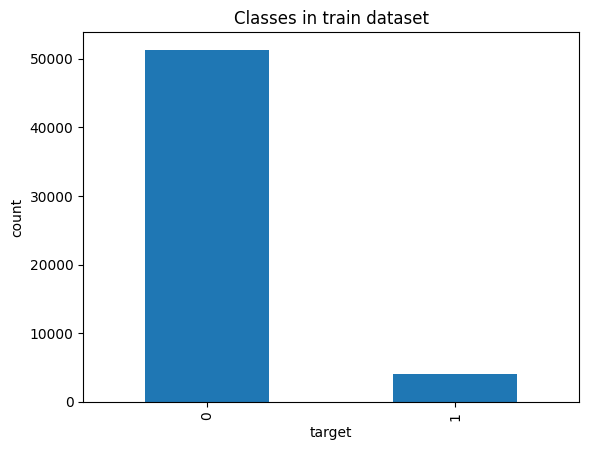

In [ ]:
tmp_df1 = pd.DataFrame({"image_name": os.listdir(data_dir / "train/melanoma"), "target": 1})
tmp_df2 = pd.DataFrame({"image_name": os.listdir(data_dir / "train/other"), "target": 0})
tmp_df_comb = pd.concat([tmp_df1, tmp_df2], ignore_index=True)
tmp_df_comb.target.value_counts().plot(kind='bar')
plt.title('Classes in train dataset')
plt.xlabel('target')
plt.ylabel('count')
plt.show()

## Аугментація цільового класу для збалансування набору

In [ ]:
# version1
data_augmentation = keras.Sequential(
    [ layers.RandomZoom(0.3),
      layers.RandomFlip(mode="horizontal_and_vertical"),
      layers.RandomRotation(0.5),
      layers.RandomShear(x_factor=0.1, y_factor=0.1, fill_mode="nearest"),
      layers.MixUp(alpha=0.2),
      layers.RandomColorJitter(
          value_range=(0, 255),
          brightness_factor=0.2,
          contrast_factor=0.2,
          saturation_factor=(0.46, 0.54),
          hue_factor=0.05)
    ]
)

In [ ]:
# shutil.rmtree("/content/augmented")

In [ ]:
input_dir = pathlib.Path("/content/2020_supplemented_cropped/train/melanoma")
output_dir = pathlib.Path("/content/augmented")

Аугментація зображень з тренувального набору (вибірка) для класу "меланома".

In [ ]:
np.random.seed(42)
augm_example = np.random.choice(os.listdir(input_dir), 1)[0]
augm_example_path = os.path.join(input_dir, augm_example)
augm_example_set = augment_and_save(augm_example_path, data_augmentation, 5, save=False)
augm_example_set = [Image.open(augm_example_path)] + augm_example_set

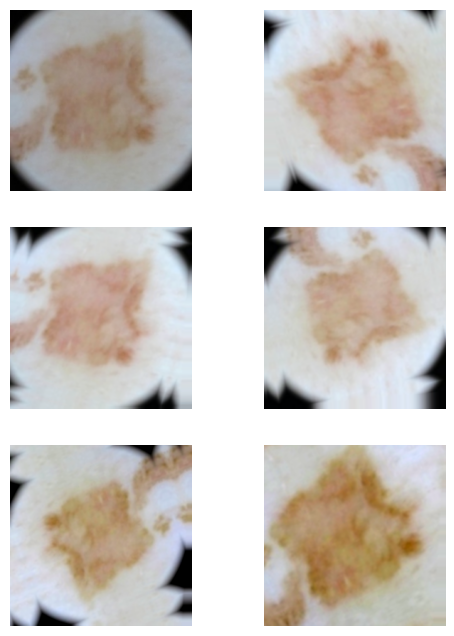

In [ ]:
plt.figure(figsize=(6, 8))
for i, image in enumerate(augm_example_set):
  ax = plt.subplot(3, 2, i + 1)
  plt.imshow(img_to_array(image).astype("uint8"))
  plt.axis("off")

In [ ]:
input_dir = pathlib.Path("/content/full_ds_croppedtr_no_augm/train/melanoma")
output_dir = pathlib.Path("/content/augmented")

In [ ]:
# version2
data_augmentation2 = keras.Sequential(
    [
      layers.RandomZoom(height_factor = (-0.3, 0.1), fill_mode="nearest", interpolation="bilinear"),
      layers.RandomFlip(mode="horizontal_and_vertical"),
      layers.RandomRotation(0.2, fill_mode="nearest", interpolation="bilinear", fill_value=0.0),
      layers.RandomShear(x_factor=0.1, y_factor=0.1, fill_mode="nearest"),
      # layers.MixUp(alpha=0.2),
      layers.RandomColorJitter(
          value_range=(0, 255),
          brightness_factor=0.2,
          contrast_factor=0.2,
          saturation_factor=(0.46, 0.54),
          hue_factor=0.05)
    ]
)

In [ ]:
np.random.seed(42)
n_examples = 20
augm_example = np.random.choice(os.listdir(input_dir), 1)[0]
augm_example_path = os.path.join(input_dir, augm_example)
augm_example_set = augment_and_save(augm_example_path, data_augmentation2, n_examples, save=False)
augm_example_set = [Image.open(augm_example_path)] + augm_example_set

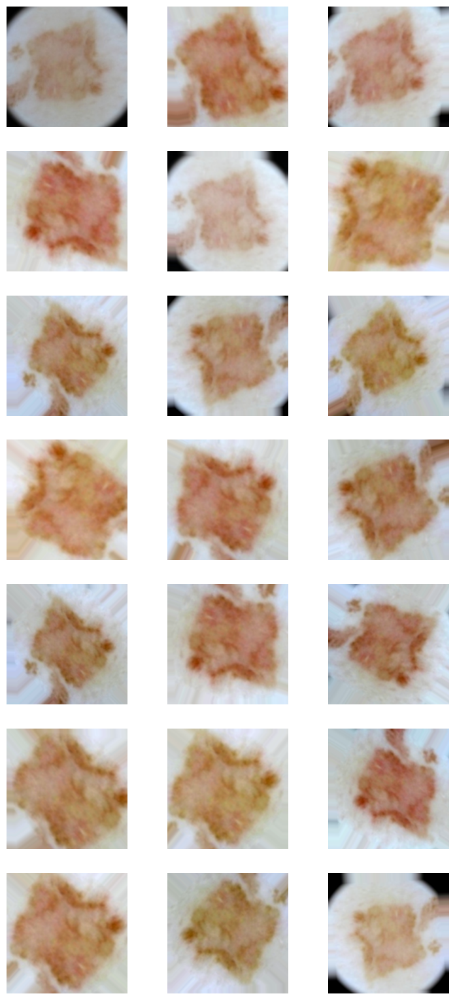

In [ ]:
plt.figure(figsize=(9, np.ceil(n_examples/3)*2.8))
for i, image in enumerate(augm_example_set):
  ax = plt.subplot(int(np.ceil(n_examples/3)), 3, i + 1)
  plt.imshow(img_to_array(image).astype("uint8"))
  plt.axis("off")

In [ ]:
# version3
data_augmentation3 = keras.Sequential(
    [
      layers.RandomZoom(height_factor = (-0.3, 0.1), fill_mode="constant", interpolation="bilinear", fill_value=0.0),
      layers.RandomFlip(mode="horizontal_and_vertical"),
      layers.RandomRotation(0.5, fill_mode="constant", interpolation="bilinear", fill_value=0.0),
      layers.RandomShear(x_factor=0.1, y_factor=0.1, fill_mode="constant", fill_value=0.0),
      # layers.MixUp(alpha=0.2),
      layers.RandomColorJitter(
          value_range=(0, 255),
          brightness_factor=0.2,
          contrast_factor=0.2,
          saturation_factor=(0.46, 0.54),
          hue_factor=0.05)
    ]
)

In [ ]:
# input_dir = pathlib.Path("/content/full_ds_croppedtr_no_augm/train/melanoma")
input_dir = pathlib.Path("/content/full_ds_croppedtr_no_augm/train/other")
# output_dir = pathlib.Path("/content/augmented/train/melanoma")
output_dir = pathlib.Path("/content/augmented/train/other")

In [ ]:
np.random.seed(34)
n_examples = 10
augm_example = np.random.choice(os.listdir(input_dir), 1)[0]
augm_example_path = os.path.join(input_dir, augm_example)
augm_example_set = augment_and_save(augm_example_path, data_augmentation3, n_examples, save=False)
augm_example_set = [Image.open(augm_example_path)] + augm_example_set

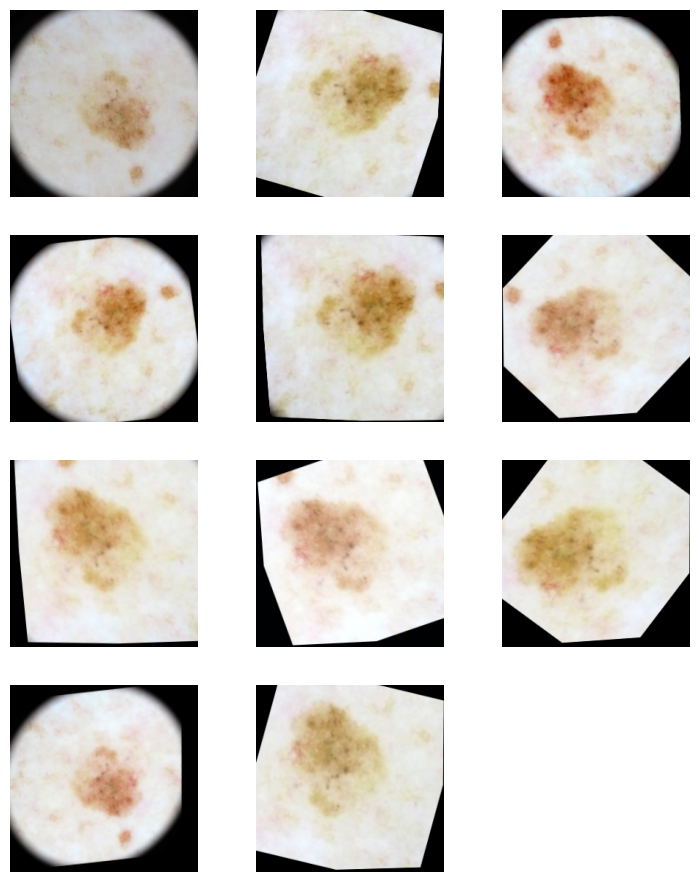

In [ ]:
plt.figure(figsize=(9, np.ceil(n_examples/3)*2.8))
for i, image in enumerate(augm_example_set):
  ax = plt.subplot(int(np.ceil(n_examples/3)), 3, i + 1)
  plt.imshow(img_to_array(image).astype("uint8"))
  plt.axis("off")

In [ ]:
# run_augmentation(data_augmentation, input_dir, output_dir, 5)
# run_augmentation(data_augmentation2, input_dir, output_dir, 5)
# run_augmentation(data_augmentation3, input_dir, output_dir, 5)
run_augmentation(data_augmentation3, input_dir, output_dir, 1)

In [ ]:
show_dirs_len(output_dir)

.: 20375


In [ ]:
show_dirs_len(output_dir)

.: 51281


In [ ]:
# input_dir = pathlib.Path("/content/full_ds_croppedtr_no_augm/validation/melanoma")
# input_dir = pathlib.Path("/content/full_ds_croppedtr_no_augm/validation/other")
# output_dir = pathlib.Path("/content/augmented/validation/melanoma")
# output_dir = pathlib.Path("/content/augmented/validation/other")

In [ ]:
# зберегти за потреби аугментовані зображення
!zip -q -r melanoma_augmented_cropped5v2.zip . -i /augmented/*
from google.colab import files
files.download("melanoma_augmented_cropped5v2.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# зберегти за потреби аугментовані зображення
!zip -q -r augmented_cropped5v3.zip . -i /augmented/*
from google.colab import files
files.download("augmented_cropped5v3.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# зберегти за потреби датасет без аугментації
!zip -q -r full_ds_croppedtr_no_augm.zip /content/2020_supplemented_cropped/
from google.colab import files
files.download("full_ds_croppedtr_no_augm.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# додати аугментовані файли у датасет
add_files(output_dir, input_dir)

In [ ]:
show_dirs_len(input_dir)

.: 24450


In [ ]:
show_dirs_len(data_dir)

.: 3
train: 2
train/melanoma: 24450
train/other: 51281
test: 2
test/melanoma: 1587
test/other: 17549
validation: 2
validation/melanoma: 1018
validation/other: 1599


In [ ]:
# зберегти вибірку з аугментацією цільового класу
!zip -q -r full_ds_croppedtr_with_augm.zip /content/2020_supplemented_cropped/
from google.colab import files
files.download("full_ds_croppedtr_with_augm.zip")

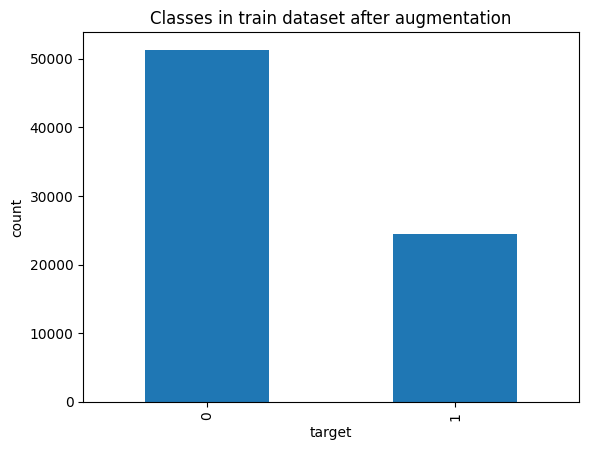

In [ ]:
# augmentation 1:5 melanoma class
tmp_df1 = pd.DataFrame({"image_name": os.listdir(data_dir / "train/melanoma"), "target": 1})
tmp_df2 = pd.DataFrame({"image_name": os.listdir(data_dir / "train/other"), "target": 0})
tmp_df_comb = pd.concat([tmp_df1, tmp_df2], ignore_index=True)
tmp_df_comb.target.value_counts().plot(kind='bar')
plt.title('Classes in train dataset after augmentation')
plt.xlabel('target')
plt.ylabel('count')
plt.show()

## Завантаження даних для навчання

In [ ]:
# весь cropped датасет без аугментації
# https://drive.google.com/file/d/1vIdcm_P_m5jJxWtidqct1iy4VfiJfO4Y/view?usp=sharing
file_id = "1vIdcm_P_m5jJxWtidqct1iy4VfiJfO4Y"
url = f"https://drive.google.com/uc?id={file_id}"
output = "full_ds_croppedtr_no_augm.zip"

gdown.download(url, output, quiet=False)

Downloading...
From (original): https://drive.google.com/uc?id=1vIdcm_P_m5jJxWtidqct1iy4VfiJfO4Y
From (redirected): https://drive.google.com/uc?id=1vIdcm_P_m5jJxWtidqct1iy4VfiJfO4Y&confirm=t&uuid=26815a1b-67ac-40e9-9f82-cdee03c36cb2
To: /content/full_ds_croppedtr_no_augm.zip
100%|██████████| 2.08G/2.08G [00:39<00:00, 53.0MB/s]


'full_ds_croppedtr_no_augm.zip'

In [ ]:
!unzip -q full_ds_croppedtr_no_augm.zip

In [ ]:
# весь cropped датасет melanoma class з аугментацією 1:5
# https://drive.google.com/file/d/1iGY_AW2F4UolnGNb61pybA5pOFAEhOKu/view?usp=sharing
file_id = "1iGY_AW2F4UolnGNb61pybA5pOFAEhOKu"
url = f"https://drive.google.com/uc?id={file_id}"
output = "melanoma_augmented_cropped5v2.zip"

gdown.download(url, output, quiet=False)
!unzip -q melanoma_augmented_cropped5v2.zip

Downloading...
From (original): https://drive.google.com/uc?id=1iGY_AW2F4UolnGNb61pybA5pOFAEhOKu
From (redirected): https://drive.google.com/uc?id=1iGY_AW2F4UolnGNb61pybA5pOFAEhOKu&confirm=t&uuid=1fb8b1c7-d6b6-46ae-9fe8-49d1328dffec
To: /content/melanoma_augmented_cropped5v2.zip
100%|██████████| 156M/156M [00:03<00:00, 45.5MB/s]


In [ ]:
# датасет prove_ai для доповнення валідаційних даних
# https://https://drive.google.com/file/d/1K2IrjUHuHl1Nn-t0aUMGXOvytSABf108/view?usp=sharing
file_id = "1K2IrjUHuHl1Nn-t0aUMGXOvytSABf108"
url = f"https://drive.google.com/uc?id={file_id}"
output = "prove_ai_split.zip"

gdown.download(url, output, quiet=False)
!unzip -q prove_ai_split.zip

Downloading...
From: https://drive.google.com/uc?id=1K2IrjUHuHl1Nn-t0aUMGXOvytSABf108
To: /content/prove_ai_split.zip
100%|██████████| 15.5M/15.5M [00:00<00:00, 249MB/s]


In [ ]:
# додати валідаційні дані
source_dir = pathlib.Path("/content/prove_ai_split/validation/other")
dest_dir = pathlib.Path("/content/full_ds_croppedtr_no_augm/validation/other")
add_files(source_dir, dest_dir)
source_dir1 = pathlib.Path("/content/prove_ai_split/validation/melanoma")
dest_dir1 = pathlib.Path("/content/full_ds_croppedtr_no_augm/validation/melanoma")
add_files(source_dir1, dest_dir1)

In [ ]:
# додати аугментовані файли у датасет (якщо не використовується додаткова аугментація, а тільки version2)
dest_dir = pathlib.Path("/content/full_ds_croppedtr_no_augm/train/melanoma")
source_dir = pathlib.Path("/content/melanoma_augmented_cropped5v2")
add_files(source_dir, dest_dir)

In [ ]:
data_dir = pathlib.Path("/content/full_ds_croppedtr_no_augm")
show_dirs_len(data_dir)

.: 3
train: 2
train/other: 51281
train/melanoma: 24450
validation: 2
validation/other: 1599
validation/melanoma: 1018
test: 2
test/other: 17549
test/melanoma: 1587


### Додавання додаткової аугментації

In [ ]:
# version3 аугментації (+ аугментація негативного класу)
# https://drive.google.com/file/d/1kIKi-e-VLdS2PMibkfXpVWfPEMuBsxja/view?usp=sharing

file_id = "1kIKi-e-VLdS2PMibkfXpVWfPEMuBsxja"
url = f"https://drive.google.com/uc?id={file_id}"
output = "augmented_cropped5v3.zip"

gdown.download(url, output, quiet=False)
!unzip -q augmented_cropped5v3.zip

Downloading...
From (original): https://drive.google.com/uc?id=1kIKi-e-VLdS2PMibkfXpVWfPEMuBsxja
From (redirected): https://drive.google.com/uc?id=1kIKi-e-VLdS2PMibkfXpVWfPEMuBsxja&confirm=t&uuid=a948a234-0b55-46a5-9004-4b0ab31f2ae3
To: /content/augmented_cropped5v3.zip
100%|██████████| 546M/546M [00:08<00:00, 63.6MB/s]


In [ ]:
# додати аугментовані дані в клас other ВСІ
source_dir = pathlib.Path("/content/augmented/train/other")
dest_dir = pathlib.Path("/content/full_ds_croppedtr_no_augm/train/other")
add_files(source_dir, dest_dir)

In [ ]:
# додати ЧАСТИНУ аугментованих даних в клас other
source_dir = pathlib.Path("/content/augmented/train/other")
dest_dir = pathlib.Path("/content/full_ds_croppedtr_no_augm/train/other")
sample_and_copy_files(source_dir, dest_dir, ratio=0.25)

In [ ]:
# додати аугментовані дані класу melanoma v2
dest_dir = pathlib.Path("/content/full_ds_croppedtr_no_augm/train/melanoma")
source_dir = pathlib.Path("/content/melanoma_augmented_cropped5v2")
# source_dir = pathlib.Path("/content/augmented_cropped5v3/augmented/train/melanoma")
add_files(source_dir, dest_dir)

In [ ]:
# відібрати частину аугментованих даних v3, класу меланома та домішати з заміною v2
dest_dir = pathlib.Path("/content/full_ds_croppedtr_no_augm/train/melanoma")
source_dir = pathlib.Path("/content/augmented/train/melanoma")
sample_and_copy_files(source_dir, dest_dir, ratio=0.7)

In [ ]:
# додати аугментовані файли у датасет (клас melanoma)
# dest_dir = pathlib.Path("/content/full_ds_croppedtr_no_augm/train/melanoma")
# source_dir = pathlib.Path("/content/augm_mix_mel")
# add_files(source_dir, dest_dir)

In [ ]:
data_dir = pathlib.Path("/content/full_ds_croppedtr_no_augm")
show_dirs_len(data_dir)

.: 3
train: 2
train/other: 102562
train/melanoma: 24450
validation: 2
validation/other: 1599
validation/melanoma: 1018
test: 2
test/other: 17549
test/melanoma: 1587


## Визначення параметрів для побудови моделі, розбиття датасету

In [ ]:
IM_SIZE = 256
BATCH_SIZE = 32
VERSION = generate_model_version_name()
# MODEL_NAME = f"Basic_model_{VERSION}"
LEARNING_RATE = 1e-4

In [ ]:
METRICS = [
      keras.metrics.BinaryAccuracy(name='accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.TruePositives(name='tp'),
      keras.metrics.FalsePositives(name='fp'),
      keras.metrics.TrueNegatives(name='tn'),
      keras.metrics.FalseNegatives(name='fn'),
      keras.metrics.AUC(name='auc'),
      keras.metrics.AUC(name='prc', curve='PR') # precision-recall curve
]

In [ ]:
VERSION

'04-23-11'

In [ ]:
# if full train_ds
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir / "train",
  class_names=["other", "melanoma"],
  seed=123,
  # image_size=(IM_SIZE, IM_SIZE),
  shuffle=True,
  batch_size=BATCH_SIZE)

val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir / "validation",
  class_names=["other", "melanoma"],
  seed=123,
  # image_size=(IM_SIZE, IM_SIZE),
  batch_size=BATCH_SIZE)

test_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir / "test",
  class_names=["other", "melanoma"],
  seed=123,
  # image_size=(IM_SIZE, IM_SIZE),
  batch_size=BATCH_SIZE)

Found 88551 files belonging to 2 classes.
Found 2617 files belonging to 2 classes.
Found 19136 files belonging to 2 classes.


### Візуалізація датасету

In [ ]:
class_names = train_ds.class_names
print(class_names)

['other', 'melanoma']


In [ ]:
print(train_ds)
print(val_ds)
print(test_ds)

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>


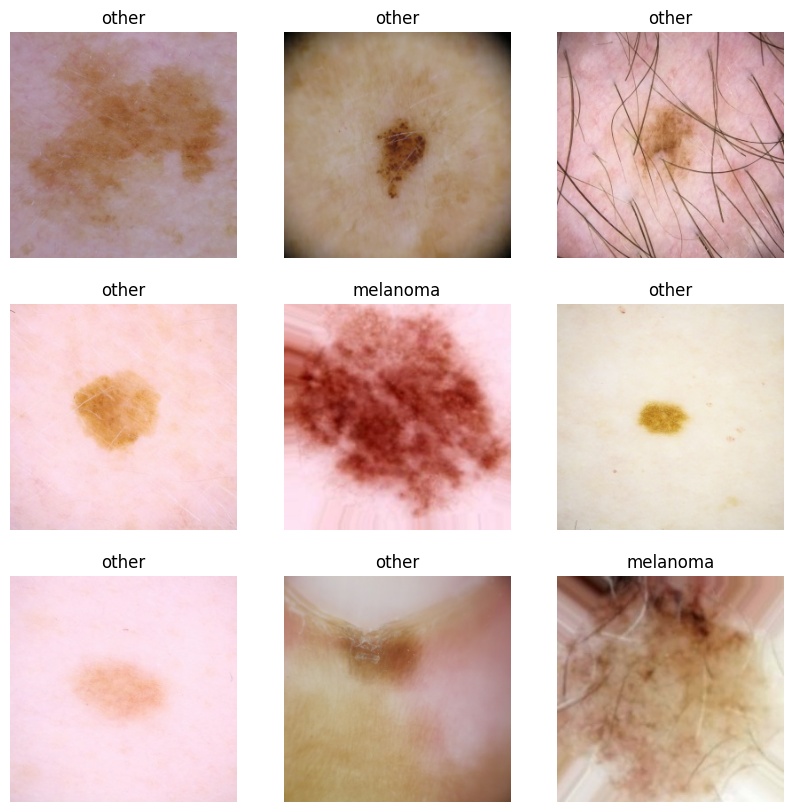

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

## Створення моделі, передобробка датасету, навчання, оцінка

In [ ]:
# Configure the dataset for performance
train_ds = train_ds.shuffle(64).prefetch(buffer_size=tf.data.AUTOTUNE)
# val_ds = val_ds.cache().prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.prefetch(buffer_size=tf.data.AUTOTUNE)

### при дисбалансі класів

In [ ]:
count_1 = len(os.listdir(data_dir / "train/melanoma"))
count_0 = len(os.listdir(data_dir / "train/other"))

In [ ]:
# weight_0, weight_1 = binary_class_weights(train_ds)
weight_0, weight_1 = binary_class_weights_2(count_1, count_0)

class_weights = {0: weight_0, 1: weight_1}

print(f'Weight for class 0: {weight_0:.2f}')
print(f'Weight for class 1: {weight_1:.2f}')

Weight for class 0: 0.62
Weight for class 1: 2.60


In [ ]:
# initial_bias = initial_bias_calc(train_ds)
initial_bias = initial_bias_calc_2(count_1, count_0)
print(f'initial_bias: {initial_bias}')

initial_bias: -1.4338372778413724


### Модель

In [ ]:
# створення та компіляція моделі з заданим bias для останнього шару
def make_model(learning_rate=LEARNING_RATE, metrics=METRICS, model=None, output_bias=None):
  model.compile(
      optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
      loss=keras.losses.BinaryCrossentropy(),
      metrics=metrics)
  if output_bias is not None:
    model.layers[-1].bias.assign([output_bias])
  return model

In [ ]:
MODEL_NAMES = [f"MobileNetV2_{VERSION}",
              f"Xception_{VERSION}",
              f"ResNet50V2_{VERSION}",
               f"DenseNet121_{VERSION}",
               f"EfficientNetV2B0_{VERSION}"]

In [ ]:
# ! Перезапускати
model_index = 3
MODEL_NAME = MODEL_NAMES[model_index]

In [ ]:
MODEL_NAME

'EfficientNetV2B0_04-23-10'

### if keras pretrained model

In [ ]:
if model_index == 0:
  from keras.applications.mobilenet_v2 import MobileNetV2, preprocess_input
  IM_SIZE = 256       #224
  base_model = MobileNetV2(
    weights="imagenet",
    input_shape=(IM_SIZE, IM_SIZE, 3),
    include_top=False)

if model_index == 1:
  from keras.applications.xception import Xception, preprocess_input
  IM_SIZE = 256   #229
  base_model = Xception(
    weights="imagenet",
    input_shape=(IM_SIZE, IM_SIZE, 3),
    include_top=False)

if model_index == 2:
  from keras.applications.resnet_v2 import ResNet50V2, preprocess_input
  IM_SIZE = 256   #224
  base_model = ResNet50V2(
    weights="imagenet",
    input_shape=(IM_SIZE, IM_SIZE, 3),
    include_top=False)

if model_index == 3:
  from keras.applications.densenet import DenseNet121, preprocess_input
  IM_SIZE = 256   #224
  base_model = DenseNet121(
    weights="imagenet",
    input_shape=(IM_SIZE, IM_SIZE, 3),
    include_top=False)

if model_index == 4:
  from keras.applications.efficientnet_v2 import EfficientNetV2B0, preprocess_input
  IM_SIZE = 256
  base_model = EfficientNetV2B0(
    weights="imagenet",
    input_shape=(IM_SIZE, IM_SIZE, 3),
    include_top=False)

print(base_model.output_shape)

# preprocess for fine_tuning:
def preprocess(image, label):
  image = preprocess_input(image)
  return image, label

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
(None, 8, 8, 2048)


In [ ]:
# заморозити шари базової моделі
base_model.trainable = False

In [ ]:
# модель
inputs = keras.Input(shape=(IM_SIZE, IM_SIZE, 3))
preprocessed = layers.Lambda(preprocess_input)(inputs)
x = base_model(preprocessed, training=False)  #to keep batchnorm layers in inference mode, when unfreeze the base model for fine-tuning
x = keras.layers.GlobalAveragePooling2D()(x)
x = keras.layers.Dropout(0.5)(x)
x = keras.layers.Dense(128, activation='relu', name="full_con1")(x)
outputs = keras.layers.Dense(1, activation='sigmoid', name="pred")(x)
model = keras.Model(inputs, outputs)

### small dataset feature-extractors-models

In [ ]:
# https://drive.google.com/file/d/17p3Y9AFIPC-C3rphCZlDzKBiKKYskFBj/view?usp=sharing
file_id = "17p3Y9AFIPC-C3rphCZlDzKBiKKYskFBj"
url = f"https://drive.google.com/uc?id={file_id}"
output = "feature_extractors.zip"

gdown.download(url, output, quiet=False)
!unzip -q feature_extractors.zip

Downloading...
From (original): https://drive.google.com/uc?id=17p3Y9AFIPC-C3rphCZlDzKBiKKYskFBj
From (redirected): https://drive.google.com/uc?id=17p3Y9AFIPC-C3rphCZlDzKBiKKYskFBj&confirm=t&uuid=83e5d7e3-b607-40f9-86f8-9e01be2c0aac
To: /content/feature_extractors.zip
100%|██████████| 233M/233M [00:04<00:00, 51.3MB/s]


In [ ]:
FEATURE_EXTRACTORS = [
    'small-tl-MobileNetV2_03-27-19.keras',
    'small-tl-Xception_03-29-11.keras',
    'small-tl-ResNet50V2_04-05-14.keras',
    'small-tl-DenseNet121_04-06-14.keras',
    'small-tl-EfficientNetV2B0_04-07-19.keras'
]

In [ ]:
FEATURE_EXTRACTOR = FEATURE_EXTRACTORS[model_index]
FEATURE_EXTRACTOR

'small-tl-EfficientNetV2B0_04-07-19.keras'

In [ ]:
if model_index == 0:
  from keras.applications.mobilenet_v2 import preprocess_input
  IM_SIZE = 256       #224

if model_index == 1:
  from keras.applications.xception import preprocess_input
  IM_SIZE = 256   #229

if model_index == 2:
  from keras.applications.resnet_v2 import preprocess_input
  IM_SIZE = 256   #224

if model_index == 3:
  from keras.applications.densenet import preprocess_input
  IM_SIZE = 256   #224

if model_index == 4:
  from keras.applications.efficientnet_v2 import preprocess_input
  IM_SIZE = 256

# preprocess for fine_tuning:
def preprocess(image, label):
  image = preprocess_input(image)
  return image, label

# models selection

## Xception

transfer learning Xception

! оновити визначення версії, моделі, індекс, базова модель, модель

In [ ]:
data_dir = pathlib.Path("/content/full_ds_croppedtr_no_augm")
show_dirs_len(data_dir)

.: 3
test: 2
test/other: 17549
test/melanoma: 1587
validation: 2
validation/other: 1599
validation/melanoma: 1018
train: 2
train/other: 64101
train/melanoma: 24450


In [ ]:
# weight_0, weight_1 = binary_class_weights(train_ds)
weight_0, weight_1 = binary_class_weights_2(count_1, count_0)

class_weights = {0: weight_0, 1: weight_1}

print(f'Weight for class 0: {weight_0:.2f}')
print(f'Weight for class 1: {weight_1:.2f}')

Weight for class 0: 0.69
Weight for class 1: 1.81


In [ ]:
# initial_bias = initial_bias_calc(train_ds)
initial_bias = initial_bias_calc_2(count_1, count_0)
print(f'initial_bias: {initial_bias}')

initial_bias: -0.9638297485080798


In [ ]:
model_index = 1

In [ ]:
labels = ['tl-', 'ft-']
label = labels[0]

In [ ]:
# створення та компіляція transfer learning моделі
tl_model = make_model(learning_rate=LEARNING_RATE, loss_func=keras.losses.BinaryCrossentropy(), metrics=METRICS, model=model, output_bias=initial_bias)
model.summary(show_trainable=True)

# створити логгер
metrics_logger = MetricsLogger(filepath=f"metrics_logs_{label}{MODEL_NAME}.csv")

# !помилка monitor - val_auc
callbacks_list = [EarlyStopping(monitor='auc', patience=4),
                  ModelCheckpoint(f'{label}{MODEL_NAME}.keras', monitor='val_loss', save_best_only=True),
                  metrics_logger,
                  # WandbMetricsLogger(),
                  # WandbModelCheckpoint(filepath=f"{label}{MODEL_NAME}_wandb.keras", monitor="val_loss")
]

epochs=20

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ input_layer_2 (InputLayer)  │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ lambda_1 (Lambda)           │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ xception (Functional)       │ (None, 8, 8, 2048)    │ 20,861,480 │   N   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ global_average_pooling2d_1  │ (None, 2048)          │          0 │   -   │
│ (GlobalAveragePooling2D)    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dropout_1 (Dropout)         │ (None, 2048)          │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ full_con1 (Dense)           │ (None, 128)           │    262,272 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ pred (Dense)                │ (None, 1)             │        129 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 21,123,881 (80.58 MB)

 Trainable params: 262,401 (1.00 MB)

 Non-trainable params: 20,861,480 (79.58 MB)

In [ ]:
# Xception
history = tl_model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=callbacks_list,
  class_weight=class_weights
)

Epoch 1/20
2768/2768 ━━━━━━━━━━━━━━━━━━━━ 462s 160ms/step - accuracy: 0.8266 - auc: 0.8975 - fn: 1945.7404 - fp: 5373.0908 - loss: 0.4013 - prc: 0.7786 - precision: 0.6446 - recall: 0.8260 - tn: 26693.5488 - tp: 10307.2295 - val_accuracy: 0.7367 - val_auc: 0.8607 - val_fn: 640.0000 - val_fp: 49.0000 - val_loss: 0.5348 - val_prc: 0.8083 - val_precision: 0.8852 - val_recall: 0.3713 - val_tn: 1550.0000 - val_tp: 378.0000
Epoch 2/20
2768/2768 ━━━━━━━━━━━━━━━━━━━━ 440s 159ms/step - accuracy: 0.8520 - auc: 0.9256 - fn: 1726.8527 - fp: 4858.9175 - loss: 0.3473 - prc: 0.8337 - precision: 0.6848 - recall: 0.8594 - tn: 27207.5918 - tp: 10526.5088 - val_accuracy: 0.7551 - val_auc: 0.8707 - val_fn: 590.0000 - val_fp: 51.0000 - val_loss: 0.4975 - val_prc: 0.8238 - val_precision: 0.8935 - val_recall: 0.4204 - val_tn: 1548.0000 - val_tp: 428.0000
Epoch 3/20
2768/2768 ━━━━━━━━━━━━━━━━━━━━ 440s 159ms/step - accuracy: 0.8562 - auc: 0.9299 - fn: 1694.0123 - fp: 4688.8218 - loss: 0.3369 - prc: 0.8417 - pr

In [ ]:
from google.colab import files

df_basic = pd.DataFrame(history.history)
df_basic.to_csv(f"metrics_{label}{MODEL_NAME}.csv", index=False)

files.download(f'/content/metrics_logs_{label}{MODEL_NAME}.csv')
files.download(f'/content/{label}{MODEL_NAME}.keras')
files.download(f'/content/metrics_{label}{MODEL_NAME}.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
tl_model.save('/content/tl-Xception_05-20-16_last.keras')

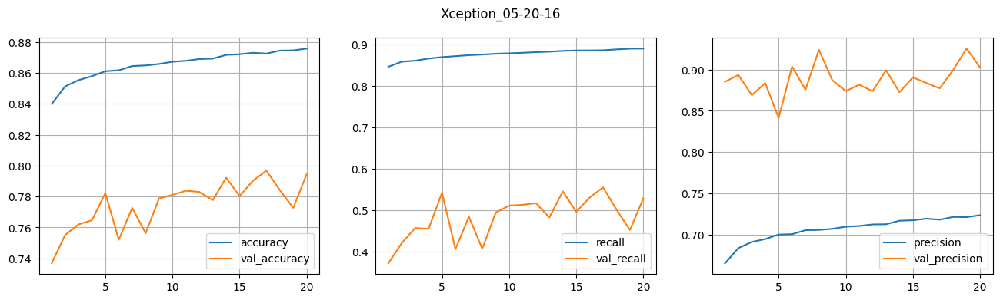

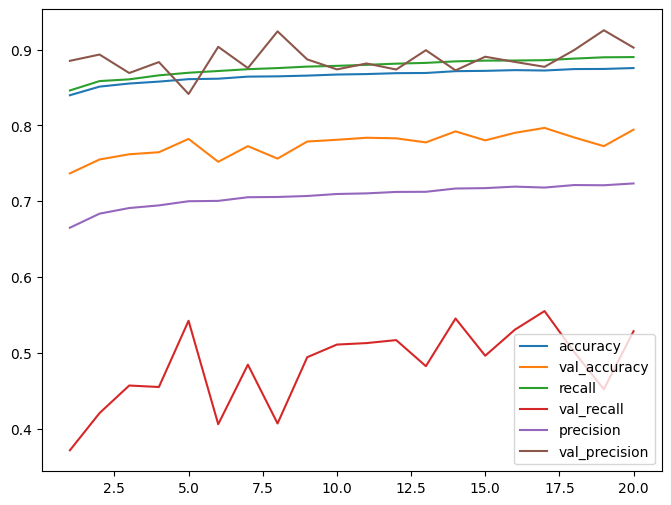

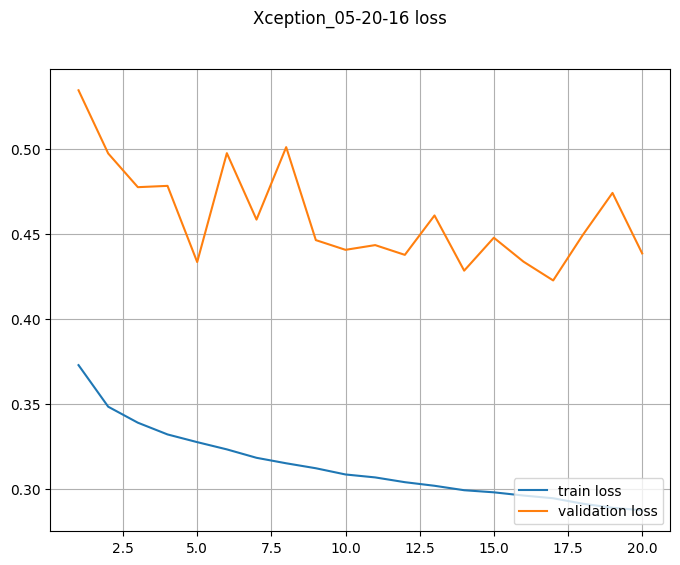

In [ ]:
plot_scores (df_basic, MODEL_NAME, ['accuracy', 'recall', 'precision'])
plot_loss(df_basic, MODEL_NAME)

In [ ]:
model_path = f"/content/tl-{MODEL_NAME}.keras"
best_tl_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})

In [ ]:
best_tl_results = best_tl_model.evaluate(test_ds, verbose=1)

598/598 ━━━━━━━━━━━━━━━━━━━━ 93s 148ms/step - accuracy: 0.9031 - auc: 0.7503 - fn: 536.3356 - fp: 374.0668 - loss: 0.2862 - prc: 0.3257 - precision: 0.3906 - recall: 0.3056 - tn: 8440.2852 - tp: 249.2588


In [ ]:
precision = best_tl_results[2]
recall = best_tl_results[3]
fbeta = fbeta_metric(precision, recall)
best_tl_results.append(fbeta)
for metric, value in zip(["loss"] + [m.name for m in METRICS] + ["f1_beta"], best_tl_results):
  print(metric, ': ', value)
print()

loss :  0.2821592688560486
accuracy :  0.9056228995323181
precision :  0.4111922085285187
recall :  0.31947070360183716
tp :  507.0
fp :  726.0
tn :  16823.0
fn :  1080.0
auc :  0.7561264038085938
prc :  0.33721601963043213
f1_beta :  0.33438860600208115



In [ ]:
# Зберегти результат оцінки на тествому наборі
df_eval = pd.DataFrame({'Metric': ["loss"] + [m.name for m in METRICS] + ["f1_beta"], 'Value': best_tl_results})
df_eval.to_csv(f'evaluate_results_{label}{MODEL_NAME}.csv', index=False)
files.download(f'/content/evaluate_results_{label}{MODEL_NAME}.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

остання модель

In [ ]:
last_tl_results = tl_model.evaluate(test_ds, verbose=1)

precision = last_tl_results[2]
recall = last_tl_results[3]
fbeta = fbeta_metric(precision, recall)
last_tl_results.append(fbeta)
for metric, value in zip(["loss"] + [m.name for m in METRICS] + ["f1_beta"], last_tl_results):
  print(metric, ': ', value)
print()

598/598 ━━━━━━━━━━━━━━━━━━━━ 89s 149ms/step - accuracy: 0.9093 - auc: 0.7560 - fn: 560.4608 - fp: 288.7279 - loss: 0.2743 - prc: 0.3306 - precision: 0.4233 - recall: 0.2728 - tn: 8525.0137 - tp: 225.7446
loss :  0.27134305238723755
accuracy :  0.9116325378417969
precision :  0.44970986247062683
recall :  0.29300567507743835
tp :  465.0
fp :  569.0
tn :  16980.0
fn :  1122.0
auc :  0.7594577074050903
prc :  0.3437965512275696
f1_beta :  0.31495530015567247



fine tuning Xception

! Оновити індекс базової моделі

In [ ]:
# labels = ['tl-', 'ft-']
label = labels[1]
print(label, MODEL_NAME)

ft- Xception_05-20-16


In [ ]:
IM_SIZE = 256
BATCH_SIZE = 32
# VERSION = generate_model_version_name()
# MODEL_NAME = "DenseNet121_05-05-17"
LEARNING_RATE = 3e-5

labels = ['tl-', 'ft-']
label = labels[1]
print(label,  MODEL_NAME)

model_path = f"/content/tl-{MODEL_NAME}.keras"
best_tl_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})
base_model = best_tl_model.get_layer('xception')
# plot_model(base_model, show_shapes=True)


ft- Xception_05-20-16


In [ ]:
for i, layer in enumerate(base_model.layers):
  print(f'{i+1}. {layer.name}: {layer.output.shape}')

1. input_layer: (None, 256, 256, 3)
2. block1_conv1: (None, 127, 127, 32)
3. block1_conv1_bn: (None, 127, 127, 32)
4. block1_conv1_act: (None, 127, 127, 32)
5. block1_conv2: (None, 125, 125, 64)
6. block1_conv2_bn: (None, 125, 125, 64)
7. block1_conv2_act: (None, 125, 125, 64)
8. block2_sepconv1: (None, 125, 125, 128)
9. block2_sepconv1_bn: (None, 125, 125, 128)
10. block2_sepconv2_act: (None, 125, 125, 128)
11. block2_sepconv2: (None, 125, 125, 128)
12. block2_sepconv2_bn: (None, 125, 125, 128)
13. conv2d: (None, 63, 63, 128)
14. block2_pool: (None, 63, 63, 128)
15. batch_normalization: (None, 63, 63, 128)
16. add: (None, 63, 63, 128)
17. block3_sepconv1_act: (None, 63, 63, 128)
18. block3_sepconv1: (None, 63, 63, 256)
19. block3_sepconv1_bn: (None, 63, 63, 256)
20. block3_sepconv2_act: (None, 63, 63, 256)
21. block3_sepconv2: (None, 63, 63, 256)
22. block3_sepconv2_bn: (None, 63, 63, 256)
23. conv2d_1: (None, 32, 32, 256)
24. block3_pool: (None, 32, 32, 256)
25. batch_normalization_1

In [ ]:
for layer in base_model.layers[-46:]:
  layer.trainable=True

for layer in base_model.layers[:-46]:
  layer.trainable=False

best_tl_model.summary(show_trainable=True)

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ input_layer_2 (InputLayer)  │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ lambda_1 (Lambda)           │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ xception (Functional)       │ (None, 8, 8, 2048)    │ 20,861,480 │   N   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ global_average_pooling2d_1  │ (None, 2048)          │          0 │   -   │
│ (GlobalAveragePooling2D)    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dropout_1 (Dropout)         │ (None, 2048)          │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ full_con1 (Dense)           │ (None, 128)           │    262,272 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ pred (Dense)                │ (None, 1)             │        129 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 21,648,685 (82.58 MB)

 Trainable params: 11,892,713 (45.37 MB)

 Non-trainable params: 9,231,168 (35.21 MB)

 Optimizer params: 524,804 (2.00 MB)

In [ ]:
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=LEARNING_RATE,
    decay_steps=5200,
    decay_rate=0.95
)

optimizer = keras.optimizers.Adam(learning_rate=lr_schedule, weight_decay=0.01)

callbacks_list = [EarlyStopping(monitor='val_auc', patience=4),
                  ModelCheckpoint(f'{label}{MODEL_NAME}.keras', monitor='val_loss', save_best_only=True)
                  ]

epochs=20

ft-Xception_05-20-16
Epoch 1/20
2768/2768 ━━━━━━━━━━━━━━━━━━━━ 744s 259ms/step - accuracy: 0.8854 - auc: 0.9111 - fn: 2711.6958 - fp: 4696.2773 - loss: 0.3224 - prc: 0.7826 - precision: 0.6861 - recall: 0.7617 - tn: 44917.6250 - tp: 11129.8379 - val_accuracy: 0.8212 - val_auc: 0.9188 - val_fn: 394.0000 - val_fp: 74.0000 - val_loss: 0.3863 - val_prc: 0.8889 - val_precision: 0.8940 - val_recall: 0.6130 - val_tn: 1525.0000 - val_tp: 624.0000
Epoch 2/20
2768/2768 ━━━━━━━━━━━━━━━━━━━━ 712s 257ms/step - accuracy: 0.9009 - auc: 0.9668 - fn: 1028.5355 - fp: 3307.0979 - loss: 0.2320 - prc: 0.9203 - precision: 0.7701 - recall: 0.9140 - tn: 28760.4219 - tp: 11223.4629 - val_accuracy: 0.8288 - val_auc: 0.9225 - val_fn: 390.0000 - val_fp: 58.0000 - val_loss: 0.4311 - val_prc: 0.9013 - val_precision: 0.9155 - val_recall: 0.6169 - val_tn: 1541.0000 - val_tp: 628.0000
Epoch 3/20
2768/2768 ━━━━━━━━━━━━━━━━━━━━ 713s 257ms/step - accuracy: 0.9324 - auc: 0.9847 - fn: 606.4897 - fp: 2312.6992 - loss: 0.155

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

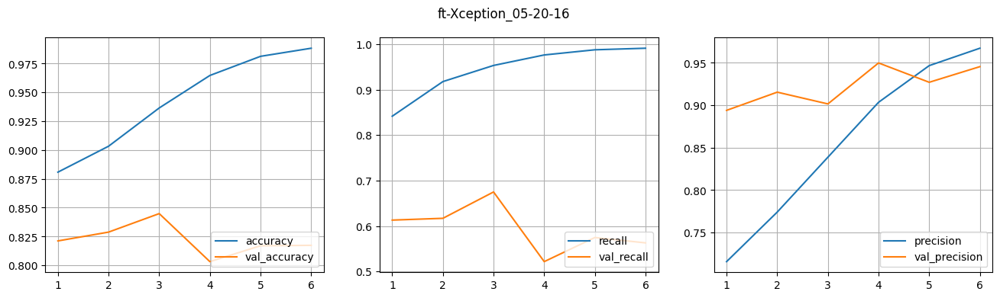

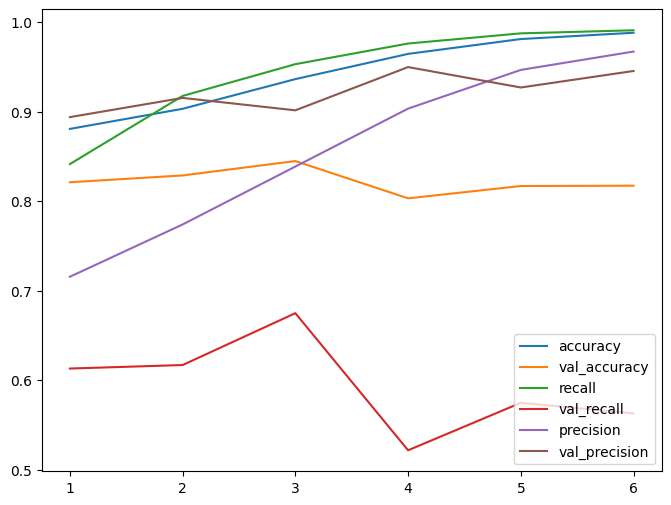

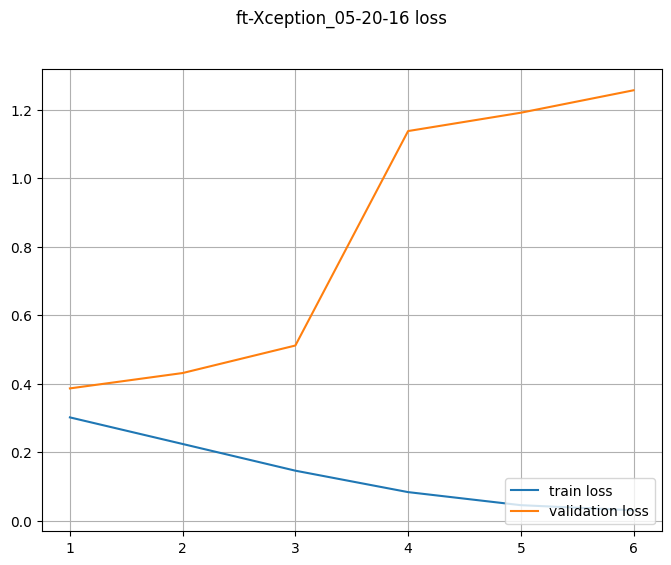

In [ ]:
history = ModelTraining(train_ds, val_ds,
                       best_tl_model, show_summary=False, model_name=f"{label}"+MODEL_NAME,
                        optimizer=optimizer,
                        metrics=METRICS,
                        class_weights=class_weights,
                        callbacks_list=callbacks_list,
                        epochs=epochs)

In [ ]:
# load best model after fine tuning
model_path = f"/content/ft-{MODEL_NAME}.keras"
best_ft_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})
# оцінка на необроблених даних
best_ft_results = ModelEvaluating(test_ds,
                           best_ft_model, model_name='ft-'+ MODEL_NAME,
                           metrics=METRICS)


598/598 ━━━━━━━━━━━━━━━━━━━━ 94s 150ms/step - accuracy: 0.9094 - auc: 0.7574 - fn: 526.1586 - fp: 321.4992 - loss: 0.2986 - prc: 0.3420 - precision: 0.4349 - recall: 0.3160 - tn: 8492.1807 - tp: 260.1085
loss :  0.29146328568458557
accuracy :  0.9115279912948608
precision :  0.4539930522441864
recall :  0.32955262064933777
tp :  523.0
fp :  629.0
tn :  16920.0
fn :  1064.0
auc :  0.7642593383789062
prc :  0.3627866804599762
f1_beta :  0.3486666713377952


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Found 19136 files.
              precision    recall  f1-score   support

           0       0.94      0.96      0.95     17549
           1       0.45      0.33      0.38      1587

    accuracy                           0.91     19136
   macro avg       0.70      0.65      0.67     19136
weighted avg       0.90      0.91      0.91     19136

(0.9004610780273349, 0.9115280100334449, 0.9087513635788683, None)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

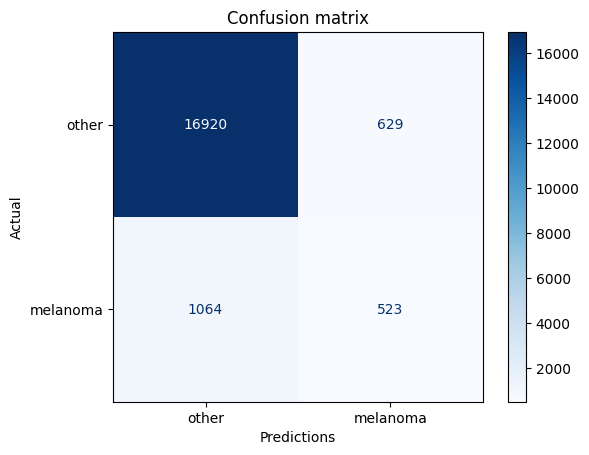

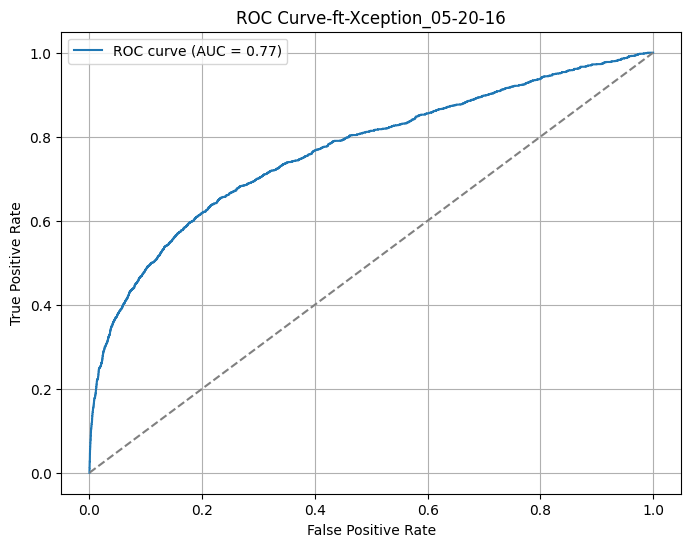

In [ ]:
# перевизначити, щоб прибрати prefetch та отримати атрибут датасету file_paths, а також прибрати мітки, перемішування
test_dataset = tf.keras.utils.image_dataset_from_directory(
  data_dir / "test",
  label_mode=None,
  image_size=IM_SIZE,
  batch_size=BATCH_SIZE,
  shuffle=False)

prediction_df = ModelPredicting(test_dataset, best_ft_model, model_name=f"{label}"+ MODEL_NAME)


With vignette /content/full_ds_croppedtr_no_augm/test/other: 2028
Without vignette /content/full_ds_croppedtr_no_augm/test/other: 15521
17549
With vignette /content/full_ds_croppedtr_no_augm/test/melanoma: 517
Without vignette /content/full_ds_croppedtr_no_augm/test/melanoma: 1070
1587
Found 19136 files belonging to 2 classes.
              precision    recall  f1-score   support

           0       0.95      0.95      0.95     17549
           1       0.44      0.42      0.43      1587

    accuracy                           0.91     19136
   macro avg       0.69      0.69      0.69     19136
weighted avg       0.91      0.91      0.91     19136

(0.9061242793574181, 0.9077132107023411, 0.9073853637441275, None)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

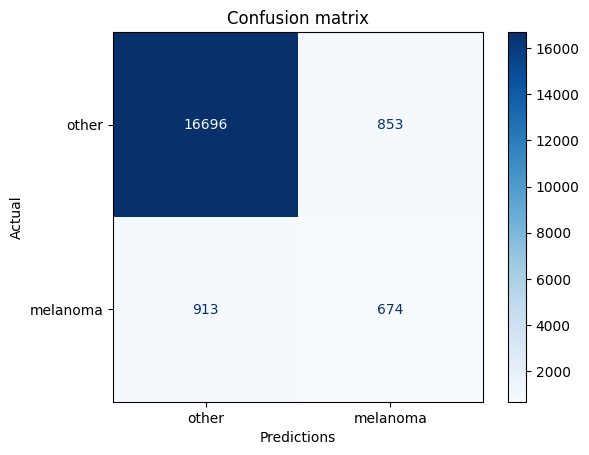

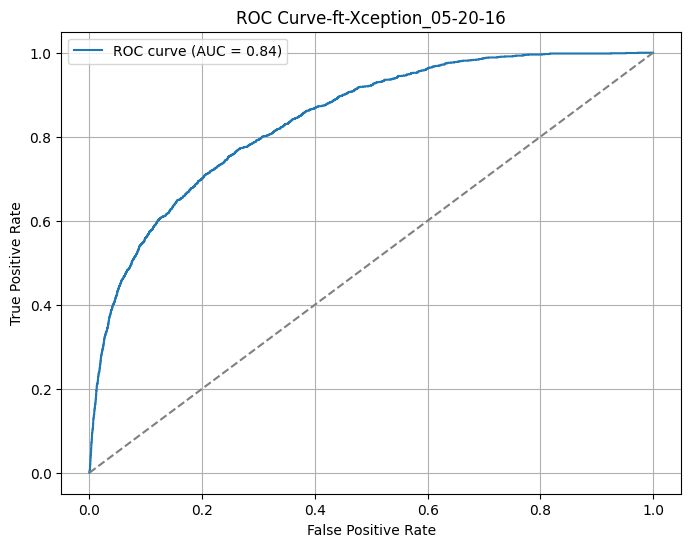

In [ ]:
# обробка тестових даних
test_data_dir = pathlib.Path('/content/full_ds_croppedtr_no_augm/test')
prepocess_to_crop(test_data_dir, center_ratio=0.5, threshold=70)

test_ds = tf.keras.utils.image_dataset_from_directory(
  test_data_dir,
  class_names=["other", "melanoma"],
  seed=123,
  # image_size=(IM_SIZE, IM_SIZE),
  batch_size=BATCH_SIZE)

prediction_df = ModelPredicting(test_dataset, best_ft_model, model_name=f"{label}"+ MODEL_NAME)

In [ ]:
# оцінка на оброблених даних
best_ft_results = ModelEvaluating(test_ds,
                           best_ft_model, model_name='ft-'+ MODEL_NAME,
                           metrics=METRICS)

598/598 ━━━━━━━━━━━━━━━━━━━━ 89s 149ms/step - accuracy: 0.9045 - auc: 0.8332 - fn: 456.4557 - fp: 437.8464 - loss: 0.2647 - prc: 0.3557 - precision: 0.4182 - recall: 0.4006 - tn: 8376.5059 - tp: 329.1385
loss :  0.2570240795612335
accuracy :  0.9077132344245911
precision :  0.441388338804245
recall :  0.42470070719718933
tp :  674.0
fp :  853.0
tn :  16696.0
fn :  913.0
auc :  0.8403671383857727
prc :  0.3808102011680603
f1_beta :  0.4279365185428151


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## DenseNet121

змінено датасет, аугментація негативного класу тільки частина зображень

In [ ]:
data_dir = pathlib.Path("/content/full_ds_croppedtr_no_augm")
show_dirs_len(data_dir)

.: 3
validation: 2
validation/melanoma: 1018
validation/other: 1599
test: 2
test/melanoma: 1587
test/other: 17549
train: 2
train/melanoma: 24450
train/other: 76921


### Transfer learning

In [ ]:
IM_SIZE = 256
BATCH_SIZE = 32
VERSION = generate_model_version_name()
# MODEL_NAME = f"Basic_model_{VERSION}"
LEARNING_RATE = 1e-4

In [ ]:
# if full train_ds
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir / "train",
  class_names=["other", "melanoma"],
  seed=123,
  # image_size=(IM_SIZE, IM_SIZE),
  shuffle=True,
  batch_size=BATCH_SIZE)

val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir / "validation",
  class_names=["other", "melanoma"],
  seed=123,
  # image_size=(IM_SIZE, IM_SIZE),
  batch_size=BATCH_SIZE)

test_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir / "test",
  class_names=["other", "melanoma"],
  seed=123,
  # image_size=(IM_SIZE, IM_SIZE),
  batch_size=BATCH_SIZE)

Found 101371 files belonging to 2 classes.
Found 2617 files belonging to 2 classes.
Found 19136 files belonging to 2 classes.


In [ ]:
# Configure the dataset for performance
train_ds = train_ds.shuffle(64).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.prefetch(buffer_size=tf.data.AUTOTUNE)

In [ ]:
# weight_0, weight_1 = binary_class_weights(train_ds)
weight_0, weight_1 = binary_class_weights_2(count_1, count_0)

class_weights = {0: weight_0, 1: weight_1}

print(f'Weight for class 0: {weight_0:.2f}')
print(f'Weight for class 1: {weight_1:.2f}')

Weight for class 0: 0.66
Weight for class 1: 2.07


In [ ]:
# initial_bias = initial_bias_calc(train_ds)
initial_bias = initial_bias_calc_2(count_1, count_0)
print(f'initial_bias: {initial_bias}')

initial_bias: -1.1461487052352126


! оновити визначення версії, моделі, індекс, базова модель, модель

In [ ]:
labels = ['tl-', 'ft-']
label = labels[0]
print(label, MODEL_NAME)

tl- DenseNet121_05-05-17


In [ ]:
# створення та компіляція transfer learning моделі
tl_model = make_model(learning_rate=LEARNING_RATE, loss_func=keras.losses.BinaryCrossentropy(), metrics=METRICS, model=model, output_bias=initial_bias)
model.summary(show_trainable=True)

# створити логгер
metrics_logger = MetricsLogger(filepath=f"metrics_logs_{label}{MODEL_NAME}.csv")

# !помилка monitor - val_auc
callbacks_list = [EarlyStopping(monitor='auc', patience=5),
                  ModelCheckpoint(f'{label}{MODEL_NAME}.keras', monitor='val_loss', save_best_only=True),
                  metrics_logger,
                  # WandbMetricsLogger(),
                  # WandbModelCheckpoint(filepath=f"{label}{MODEL_NAME}_wandb.keras", monitor="val_loss")
]

epochs=20

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ input_layer_1 (InputLayer)  │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ lambda (Lambda)             │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ densenet121 (Functional)    │ (None, 8, 8, 1024)    │  7,037,504 │   N   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ global_average_pooling2d    │ (None, 1024)          │          0 │   -   │
│ (GlobalAveragePooling2D)    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dropout (Dropout)           │ (None, 1024)          │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ full_con1 (Dense)           │ (None, 128)           │    131,200 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ pred (Dense)                │ (None, 1)             │        129 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 7,168,833 (27.35 MB)

 Trainable params: 131,329 (513.00 KB)

 Non-trainable params: 7,037,504 (26.85 MB)

In [ ]:
# DenseNet121
history = tl_model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=callbacks_list,
  class_weight=class_weights
)

Epoch 1/20
3168/3168 ━━━━━━━━━━━━━━━━━━━━ 396s 113ms/step - accuracy: 0.7957 - auc: 0.8686 - fn: 2765.7346 - fp: 6661.9604 - loss: 0.4420 - prc: 0.7528 - precision: 0.5624 - recall: 0.7603 - tn: 31764.1406 - tp: 9528.1328 - val_accuracy: 0.7692 - val_auc: 0.8594 - val_fn: 464.0000 - val_fp: 140.0000 - val_loss: 0.4731 - val_prc: 0.7980 - val_precision: 0.7983 - val_recall: 0.5442 - val_tn: 1459.0000 - val_tp: 554.0000
Epoch 2/20
3168/3168 ━━━━━━━━━━━━━━━━━━━━ 319s 100ms/step - accuracy: 0.8404 - auc: 0.9119 - fn: 2427.4077 - fp: 5609.9121 - loss: 0.3704 - prc: 0.8314 - precision: 0.6353 - recall: 0.8020 - tn: 32817.1211 - tp: 9865.5449 - val_accuracy: 0.7696 - val_auc: 0.8628 - val_fn: 477.0000 - val_fp: 126.0000 - val_loss: 0.4712 - val_prc: 0.8023 - val_precision: 0.8111 - val_recall: 0.5314 - val_tn: 1473.0000 - val_tp: 541.0000
Epoch 3/20
3168/3168 ━━━━━━━━━━━━━━━━━━━━ 318s 100ms/step - accuracy: 0.8474 - auc: 0.9190 - fn: 2333.1147 - fp: 5441.9692 - loss: 0.3552 - prc: 0.8434 - pr

In [ ]:
from google.colab import files

df_basic = pd.DataFrame(history.history)
df_basic.to_csv(f"metrics_{label}{MODEL_NAME}.csv", index=False)

files.download(f'/content/metrics_logs_{label}{MODEL_NAME}.csv')
files.download(f'/content/{label}{MODEL_NAME}.keras')
files.download(f'/content/metrics_{label}{MODEL_NAME}.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

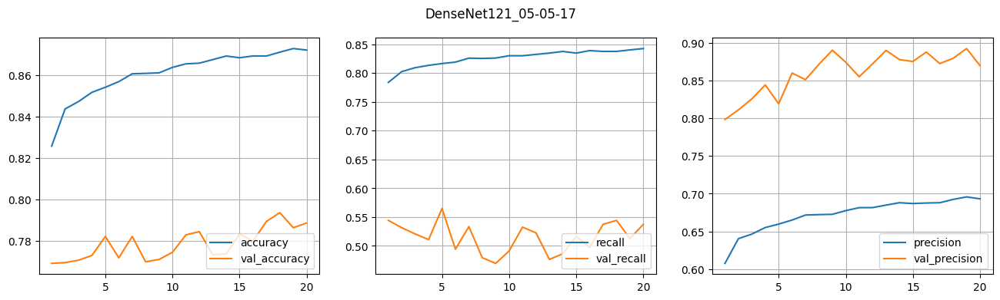

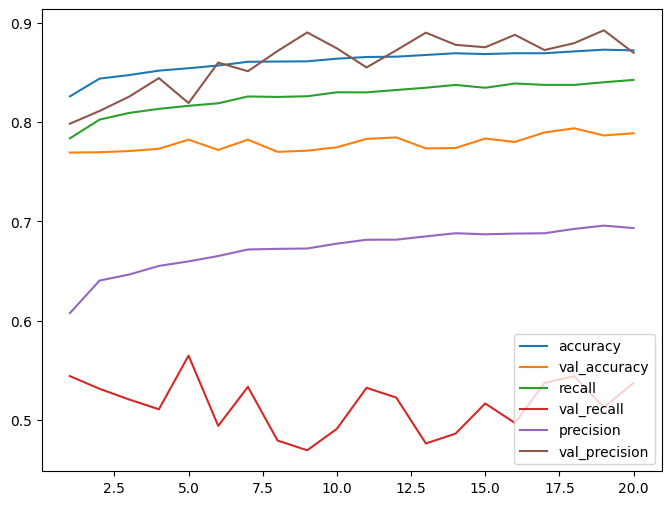

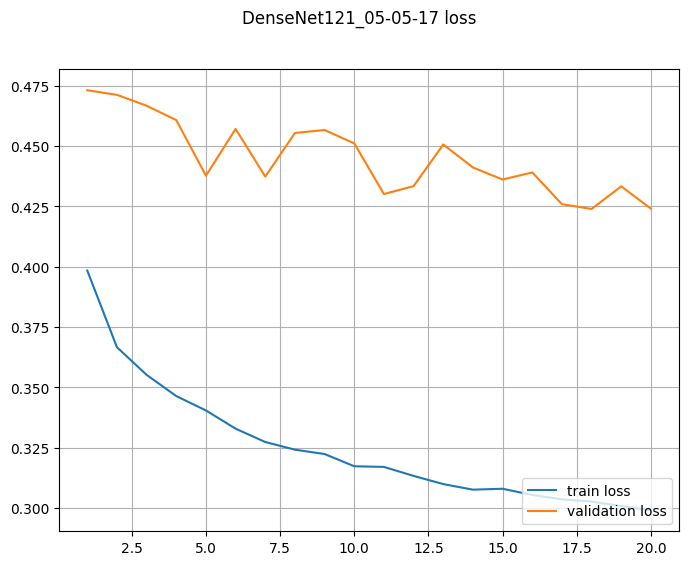

In [ ]:
plot_scores (df_basic, MODEL_NAME, ['accuracy', 'recall', 'precision'])
plot_loss(df_basic, MODEL_NAME)

In [ ]:
model_path = f"/content/tl-{MODEL_NAME}.keras"
best_tl_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})

best_tl_results = ModelEvaluating(test_ds,
                           best_tl_model, model_name='tl-'+ MODEL_NAME,
                           metrics=METRICS)

598/598 ━━━━━━━━━━━━━━━━━━━━ 74s 97ms/step - accuracy: 0.9087 - auc: 0.8242 - fn: 494.3623 - fp: 371.4140 - loss: 0.2569 - prc: 0.3849 - precision: 0.4367 - recall: 0.3602 - tn: 8442.9385 - tp: 291.2321
loss :  0.2557215094566345
accuracy :  0.9092286825180054
precision :  0.4430955946445465
recall :  0.3679899275302887
tp :  584.0
fp :  734.0
tn :  16815.0
fn :  1003.0
auc :  0.8261514902114868
prc :  0.38799771666526794
f1_beta :  0.380902694584699


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
tf.keras.backend.clear_session()

### fine tuning DenseNet121

In [ ]:
IM_SIZE = 256
BATCH_SIZE = 32
# VERSION = generate_model_version_name()
MODEL_NAME = "DenseNet121_05-05-17"
LEARNING_RATE = 3e-5

ft- DenseNet121_05-05-17


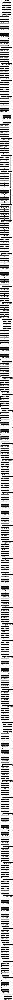

In [ ]:
labels = ['tl-', 'ft-']
label = labels[1]
print(label,  MODEL_NAME)

model_path = f"/content/tl-{MODEL_NAME}.keras"
best_tl_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})
base_model = best_tl_model.get_layer('densenet121')
plot_model(base_model, show_shapes=True)

In [ ]:
for i, layer in enumerate(base_model.layers):
  print(f'{i+1}. {layer.name}: {layer.output.shape}')

1. input_layer: (None, 256, 256, 3)
2. zero_padding2d: (None, 262, 262, 3)
3. conv1_conv: (None, 128, 128, 64)
4. conv1_bn: (None, 128, 128, 64)
5. conv1_relu: (None, 128, 128, 64)
6. zero_padding2d_1: (None, 130, 130, 64)
7. pool1: (None, 64, 64, 64)
8. conv2_block1_0_bn: (None, 64, 64, 64)
9. conv2_block1_0_relu: (None, 64, 64, 64)
10. conv2_block1_1_conv: (None, 64, 64, 128)
11. conv2_block1_1_bn: (None, 64, 64, 128)
12. conv2_block1_1_relu: (None, 64, 64, 128)
13. conv2_block1_2_conv: (None, 64, 64, 32)
14. conv2_block1_concat: (None, 64, 64, 96)
15. conv2_block2_0_bn: (None, 64, 64, 96)
16. conv2_block2_0_relu: (None, 64, 64, 96)
17. conv2_block2_1_conv: (None, 64, 64, 128)
18. conv2_block2_1_bn: (None, 64, 64, 128)
19. conv2_block2_1_relu: (None, 64, 64, 128)
20. conv2_block2_2_conv: (None, 64, 64, 32)
21. conv2_block2_concat: (None, 64, 64, 128)
22. conv2_block3_0_bn: (None, 64, 64, 128)
23. conv2_block3_0_relu: (None, 64, 64, 128)
24. conv2_block3_1_conv: (None, 64, 64, 128)
25

In [ ]:
for layer in base_model.layers[-118:]:
  layer.trainable=True

for layer in base_model.layers[:-118]:
  layer.trainable=False

best_tl_model.summary(show_trainable=True)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ input_layer_1 (InputLayer)  │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ lambda (Lambda)             │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ densenet121 (Functional)    │ (None, 8, 8, 1024)    │  7,037,504 │   N   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ global_average_pooling2d    │ (None, 1024)          │          0 │   -   │
│ (GlobalAveragePooling2D)    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dropout (Dropout)           │ (None, 1024)          │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ full_con1 (Dense)           │ (None, 128)           │    131,200 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ pred (Dense)                │ (None, 1)             │        129 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 7,431,493 (28.35 MB)

 Trainable params: 2,817,793 (10.75 MB)

 Non-trainable params: 4,351,040 (16.60 MB)

 Optimizer params: 262,660 (1.00 MB)

In [ ]:
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=LEARNING_RATE,
    decay_steps=3168,
    decay_rate=0.95
)

optimizer = keras.optimizers.Adam(learning_rate=lr_schedule, weight_decay=0.01)

callbacks_list = [EarlyStopping(monitor='val_auc', patience=4),
                  ModelCheckpoint(f'{label}{MODEL_NAME}.keras', monitor='val_loss', save_best_only=True),
                  # metrics_logger,
                  # WandbMetricsLogger(),
                  # WandbModelCheckpoint(filepath=f"small-{label}{MODEL_NAME}_wandb.keras", monitor="val_loss")
]

epochs=20


ft-DenseNet121_05-05-17


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ input_layer_1 (InputLayer)  │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ lambda (Lambda)             │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ densenet121 (Functional)    │ (None, 8, 8, 1024)    │  7,037,504 │   N   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ global_average_pooling2d    │ (None, 1024)          │          0 │   -   │
│ (GlobalAveragePooling2D)    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dropout (Dropout)           │ (None, 1024)          │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ full_con1 (Dense)           │ (None, 128)           │    131,200 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ pred (Dense)                │ (None, 1)             │        129 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 7,168,833 (27.35 MB)

 Trainable params: 2,817,793 (10.75 MB)

 Non-trainable params: 4,351,040 (16.60 MB)

Epoch 1/20
3168/3168 ━━━━━━━━━━━━━━━━━━━━ 496s 137ms/step - accuracy: 0.8500 - auc: 0.9218 - fn: 2457.8306 - fp: 5049.4038 - loss: 0.3496 - prc: 0.8438 - precision: 0.6773 - recall: 0.7950 - tn: 34974.1992 - tp: 10855.5156 - val_accuracy: 0.8063 - val_auc: 0.9134 - val_fn: 443.0000 - val_fp: 64.0000 - val_loss: 0.4054 - val_prc: 0.8782 - val_precision: 0.8998 - val_recall: 0.5648 - val_tn: 1535.0000 - val_tp: 575.0000
Epoch 2/20
3168/3168 ━━━━━━━━━━━━━━━━━━━━ 398s 125ms/step - accuracy: 0.8946 - auc: 0.9609 - fn: 1525.2297 - fp: 3776.0251 - loss: 0.2495 - prc: 0.9159 - precision: 0.7389 - recall: 0.8732 - tn: 34649.8086 - tp: 10768.8818 - val_accuracy: 0.8395 - val_auc: 0.9256 - val_fn: 327.0000 - val_fp: 93.0000 - val_loss: 0.3576 - val_prc: 0.8986 - val_precision: 0.8814 - val_recall: 0.6788 - val_tn: 1506.0000 - val_tp: 691.0000
Epoch 3/20
3168/3168 ━━━━━━━━━━━━━━━━━━━━ 389s 123ms/step - accuracy: 0.9124 - auc: 0.9709 - fn: 1252.3856 - fp: 3201.8252 - loss: 0.2163 - prc: 0.9357 - pr

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

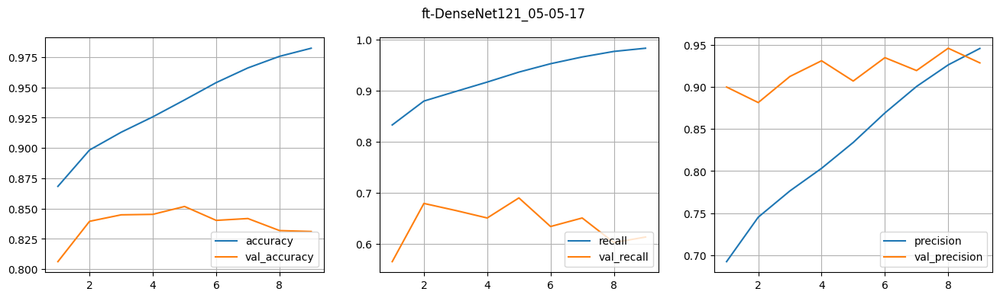

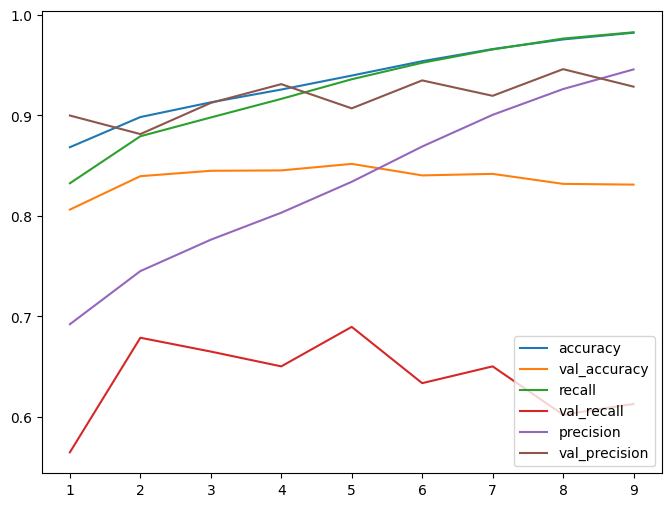

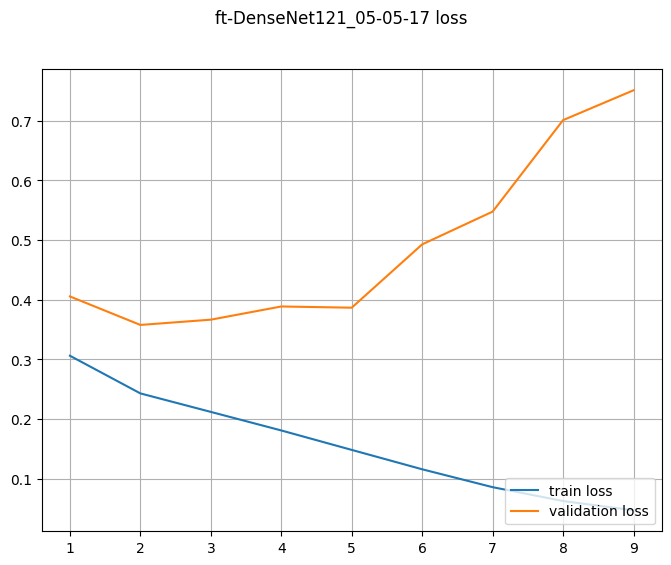

In [ ]:
# DenseNet121 fine tuning

history = ModelTraining(train_ds, val_ds,
                       best_tl_model, model_name=f"{label}"+MODEL_NAME,
                        optimizer=optimizer,
                        metrics=METRICS,
                        class_weights=class_weights,
                        callbacks_list=callbacks_list,
                        epochs=epochs)


In [ ]:
# load best model after fine tuning
model_path = f"/content/ft-{MODEL_NAME}.keras"
best_ft_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})
# оцінка на необроблених даних
best_ft_results = ModelEvaluating(test_ds,
                           best_ft_model, model_name='ft-'+ MODEL_NAME,
                           metrics=METRICS)

598/598 ━━━━━━━━━━━━━━━━━━━━ 67s 94ms/step - accuracy: 0.9083 - auc: 0.8519 - fn: 464.0384 - fp: 389.0952 - loss: 0.2373 - prc: 0.4174 - precision: 0.4394 - recall: 0.3934 - tn: 8424.6465 - tp: 322.1669
loss :  0.23273389041423798
accuracy :  0.9106919169425964
precision :  0.45679888129234314
recall :  0.4064272344112396
tp :  645.0
fp :  767.0
tn :  16782.0
fn :  942.0
auc :  0.8575850129127502
prc :  0.43464648723602295
f1_beta :  0.415592796969561


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# перевизначити, щоб прибрати prefetch та отримати атрибут датасету file_paths, а також прибрати мітки, перемішування
test_dataset = tf.keras.utils.image_dataset_from_directory(
  data_dir / "test",
  label_mode=None,
  image_size=IM_SIZE,
  batch_size=BATCH_SIZE,
  shuffle=False)

Found 19136 files.


              precision    recall  f1-score   support

           0       0.95      0.96      0.95     17549
           1       0.46      0.41      0.43      1587

    accuracy                           0.91     19136
   macro avg       0.70      0.68      0.69     19136
weighted avg       0.91      0.91      0.91     19136

(0.9062103234514536, 0.910691889632107, 0.9097064216660901, None)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

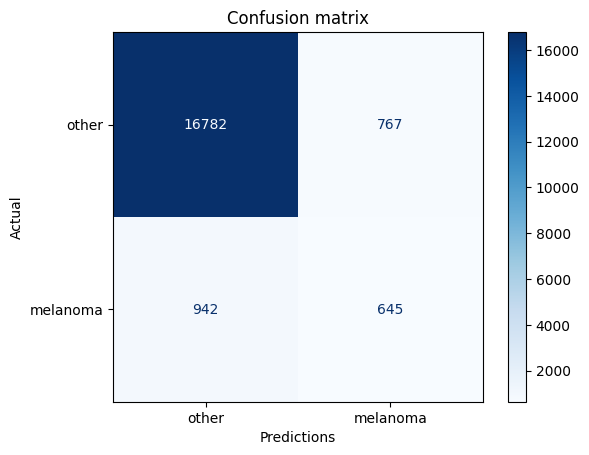

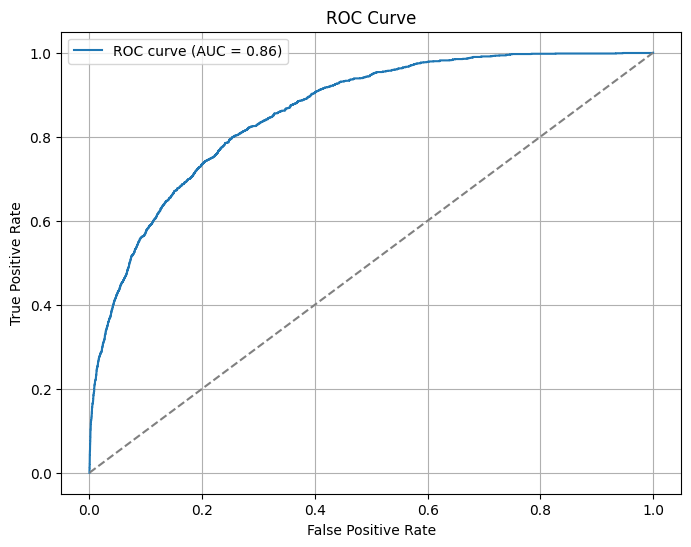

In [ ]:
prediction_df = ModelPredicting(test_dataset, best_ft_model, model_name=f"{label}"+ MODEL_NAME)

In [ ]:
import sys
if 'data_processing_utils' in sys.modules:
    del sys.modules['data_processing_utils']
import data_processing_utils

Передбачення на даних після обробки

In [ ]:
# обробка тестових даних
test_data_dir = pathlib.Path('/content/full_ds_croppedtr_no_augm/test')
prepocess_to_crop(test_data_dir, center_ratio=0.5, threshold=70)

test_ds = tf.keras.utils.image_dataset_from_directory(
  test_data_dir,
  class_names=["other", "melanoma"],
  seed=123,
  # image_size=(IM_SIZE, IM_SIZE),
  batch_size=BATCH_SIZE)

test_ds = test_ds.prefetch(buffer_size=tf.data.AUTOTUNE)

With vignette /content/full_ds_croppedtr_no_augm/test/melanoma: 517
Without vignette /content/full_ds_croppedtr_no_augm/test/melanoma: 1070
1587
With vignette /content/full_ds_croppedtr_no_augm/test/other: 2028
Without vignette /content/full_ds_croppedtr_no_augm/test/other: 15521
17549
Found 19136 files belonging to 2 classes.


In [ ]:
from keras.applications.densenet import preprocess_input

# model_path = f"/content/ft-{MODEL_NAME}.keras"
model_path = f"/content/ft-DenseNet121_05-05-17.keras"

best_ft_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})
# оцінка на оброблених даних
best_ft_results = ModelEvaluating(test_ds,
                           best_ft_model, model_name='ft-DenseNet121_05-05-17',
                           metrics=METRICS)

598/598 ━━━━━━━━━━━━━━━━━━━━ 65s 91ms/step - accuracy: 0.9066 - auc: 0.8702 - fn: 401.2271 - fp: 483.2905 - loss: 0.2385 - prc: 0.4398 - precision: 0.4363 - recall: 0.4813 - tn: 8330.4258 - tp: 385.0033
loss :  0.23544709384441376
accuracy :  0.9072951674461365
precision :  0.4458598792552948
recall :  0.4851921796798706
tp :  770.0
fp :  957.0
tn :  16592.0
fn :  817.0
auc :  0.8751328587532043
prc :  0.4510882794857025
f1_beta :  0.47678018199749045


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Found 19136 files.
              precision    recall  f1-score   support

           0       0.95      0.95      0.95     17549
           1       0.45      0.49      0.46      1587

    accuracy                           0.91     19136
   macro avg       0.70      0.72      0.71     19136
weighted avg       0.91      0.91      0.91     19136

(0.9110059287717985, 0.9072951505016722, 0.9079831488472464, None)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

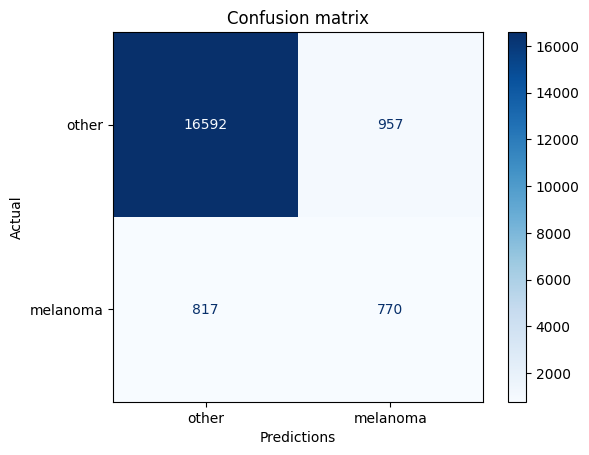

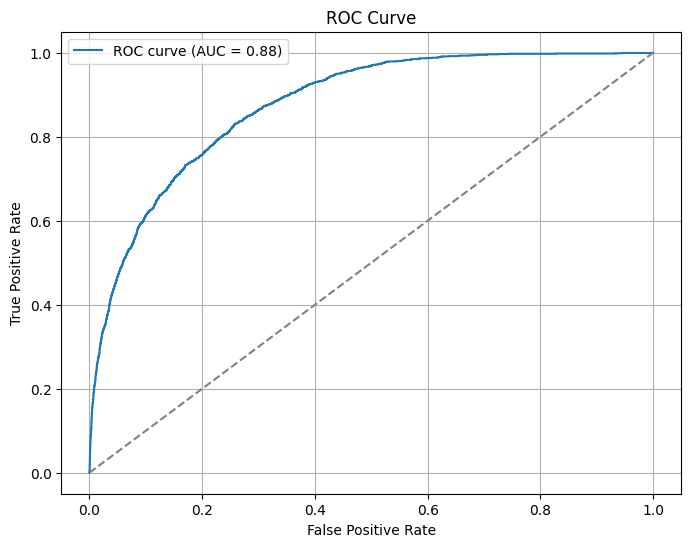

In [ ]:
# перевизначити, щоб прибрати prefetch та отримати атрибут датасету file_paths, а також прибрати мітки, перемішування
test_dataset = tf.keras.utils.image_dataset_from_directory(
  data_dir / "test",
  label_mode=None,
  image_size=IM_SIZE,
  batch_size=BATCH_SIZE,
  shuffle=False)

prediction_df = ModelPredicting(test_dataset, best_ft_model, model_name=f"{label}"+ MODEL_NAME)

### Навчання з поступовим розморожуванням шарів та зміною lr, batch size

In [ ]:
IM_SIZE = 256
BATCH_SIZE = 32
VERSION = generate_model_version_name()
LEARNING_RATE = 3e-5

In [ ]:
MODEL_NAME

'DenseNet121_05-06-13'

In [ ]:
labels = ['tl-', 'ft-']
label = labels[1]
print(label,  MODEL_NAME)

model_path = "/content/tl-DenseNet121_05-05-17.keras"
best_tl_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})
base_model = best_tl_model.get_layer('densenet121')

ft- DenseNet121_05-06-13


In [ ]:
for layer in base_model.layers[-51:]:
  layer.trainable=True

for layer in base_model.layers[:-51]:
  layer.trainable=False

best_tl_model.summary(show_trainable=True)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ input_layer_1 (InputLayer)  │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ lambda (Lambda)             │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ densenet121 (Functional)    │ (None, 8, 8, 1024)    │  7,037,504 │   N   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ global_average_pooling2d    │ (None, 1024)          │          0 │   -   │
│ (GlobalAveragePooling2D)    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dropout (Dropout)           │ (None, 1024)          │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ full_con1 (Dense)           │ (None, 128)           │    131,200 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ pred (Dense)                │ (None, 1)             │        129 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 7,431,493 (28.35 MB)

 Trainable params: 1,208,577 (4.61 MB)

 Non-trainable params: 5,960,256 (22.74 MB)

 Optimizer params: 262,660 (1.00 MB)

!визначення callbacks_list, epoches, lr_schedule, optimizer

In [ ]:
# DenseNet121 fine tuning with 51 layers unfreezed

history = ModelTraining(train_ds, val_ds,
                       best_tl_model, model_name=f"{label}"+MODEL_NAME,
                        optimizer=optimizer,
                        metrics=METRICS,
                        class_weights=class_weights,
                        callbacks_list=callbacks_list,
                        epochs=epochs)

ft-DenseNet121_05-06-13


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ input_layer_1 (InputLayer)  │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ lambda (Lambda)             │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ densenet121 (Functional)    │ (None, 8, 8, 1024)    │  7,037,504 │   N   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ global_average_pooling2d    │ (None, 1024)          │          0 │   -   │
│ (GlobalAveragePooling2D)    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dropout (Dropout)           │ (None, 1024)          │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ full_con1 (Dense)           │ (None, 128)           │    131,200 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ pred (Dense)                │ (None, 1)             │        129 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 7,168,833 (27.35 MB)

 Trainable params: 1,208,577 (4.61 MB)

 Non-trainable params: 5,960,256 (22.74 MB)

Epoch 1/20
3168/3168 ━━━━━━━━━━━━━━━━━━━━ 478s 131ms/step - accuracy: 0.8470 - auc: 0.9258 - fn: 2085.3660 - fp: 5289.4795 - loss: 0.3710 - prc: 0.8454 - precision: 0.6450 - recall: 0.8303 - tn: 33134.3438 - tp: 10210.7842 - val_accuracy: 0.8040 - val_auc: 0.9029 - val_fn: 432.0000 - val_fp: 81.0000 - val_loss: 0.4188 - val_prc: 0.8636 - val_precision: 0.8786 - val_recall: 0.5756 - val_tn: 1518.0000 - val_tp: 586.0000
Epoch 2/20
3168/3168 ━━━━━━━━━━━━━━━━━━━━ 346s 109ms/step - accuracy: 0.8791 - auc: 0.9479 - fn: 1803.9132 - fp: 4305.0552 - loss: 0.2874 - prc: 0.8930 - precision: 0.7079 - recall: 0.8517 - tn: 34119.3008 - tp: 10491.6553 - val_accuracy: 0.8070 - val_auc: 0.9102 - val_fn: 431.0000 - val_fp: 74.0000 - val_loss: 0.4062 - val_prc: 0.8745 - val_precision: 0.8880 - val_recall: 0.5766 - val_tn: 1525.0000 - val_tp: 587.0000
Epoch 3/20
3168/3168 ━━━━━━━━━━━━━━━━━━━━ 357s 112ms/step - accuracy: 0.8867 - auc: 0.9550 - fn: 1646.7722 - fp: 4106.8047 - loss: 0.2672 - prc: 0.9053 - pr

KeyboardInterrupt: 

Зростає помилка

Додаткова розморозка, 108 шарів, збільшення пакету до 64 та донавчання протягом 6 епох, зменшення learning_rate до 1e-5

In [ ]:
IM_SIZE = 256
BATCH_SIZE = 64
VERSION = generate_model_version_name()
LEARNING_RATE = 1e-5

In [ ]:
labels = ['tl-', 'ft-']
label = labels[1]
MODEL_NAME = 'DenseNet121_05-06-13'

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir / "train",
  class_names=["other", "melanoma"],
  seed=123,
  # image_size=(IM_SIZE, IM_SIZE),
  shuffle=True,
  batch_size=BATCH_SIZE)

val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir / "validation",
  class_names=["other", "melanoma"],
  seed=123,
  # image_size=(IM_SIZE, IM_SIZE),
  batch_size=BATCH_SIZE)

test_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir / "test",
  class_names=["other", "melanoma"],
  seed=123,
  # image_size=(IM_SIZE, IM_SIZE),
  batch_size=BATCH_SIZE)

train_ds = train_ds.shuffle(64).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.prefetch(buffer_size=tf.data.AUTOTUNE)

Found 101371 files belonging to 2 classes.
Found 2617 files belonging to 2 classes.
Found 19136 files belonging to 2 classes.


In [ ]:
model_path = "/content/ft-DenseNet121_05-06-13.keras"
ft_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})
base_model = ft_model.get_layer('densenet121')

In [ ]:
for layer in base_model.layers[-108:]:
  layer.trainable=True

for layer in base_model.layers[:-108]:
  layer.trainable=False

# ft_model.summary(show_trainable=True)

In [ ]:
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=LEARNING_RATE,
    decay_steps=1584,
    decay_rate=0.95
)

optimizer = keras.optimizers.Adam(learning_rate=lr_schedule, weight_decay=0.01)

callbacks_list = [EarlyStopping(monitor='val_auc', patience=2),
                  ModelCheckpoint(f'{label}{MODEL_NAME}.keras', monitor='val_loss', save_best_only=True),
                  # metrics_logger,
                  # WandbMetricsLogger(),
                  # WandbModelCheckpoint(filepath=f"small-{label}{MODEL_NAME}_wandb.keras", monitor="val_loss")
]

epochs=6

ft-DenseNet121_05-06-13


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ input_layer_1 (InputLayer)  │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ lambda (Lambda)             │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ densenet121 (Functional)    │ (None, 8, 8, 1024)    │  7,037,504 │   N   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ global_average_pooling2d    │ (None, 1024)          │          0 │   -   │
│ (GlobalAveragePooling2D)    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dropout (Dropout)           │ (None, 1024)          │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ full_con1 (Dense)           │ (None, 128)           │    131,200 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ pred (Dense)                │ (None, 1)             │        129 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 7,168,833 (27.35 MB)

 Trainable params: 2,187,777 (8.35 MB)

 Non-trainable params: 4,981,056 (19.00 MB)

Epoch 1/6
1584/1584 ━━━━━━━━━━━━━━━━━━━━ 502s 262ms/step - accuracy: 0.9069 - auc: 0.9691 - fn: 1325.0334 - fp: 3374.8188 - loss: 0.2232 - prc: 0.9307 - precision: 0.7641 - recall: 0.8912 - tn: 35074.5898 - tp: 10977.4521 - val_accuracy: 0.8330 - val_auc: 0.9252 - val_fn: 364.0000 - val_fp: 73.0000 - val_loss: 0.3738 - val_prc: 0.8971 - val_precision: 0.8996 - val_recall: 0.6424 - val_tn: 1526.0000 - val_tp: 654.0000
Epoch 2/6
1584/1584 ━━━━━━━━━━━━━━━━━━━━ 409s 230ms/step - accuracy: 0.9125 - auc: 0.9729 - fn: 1206.5223 - fp: 3240.8379 - loss: 0.2093 - prc: 0.9378 - precision: 0.7738 - recall: 0.9018 - tn: 35213.2305 - tp: 11091.2451 - val_accuracy: 0.8380 - val_auc: 0.9277 - val_fn: 353.0000 - val_fp: 71.0000 - val_loss: 0.3693 - val_prc: 0.9010 - val_precision: 0.9035 - val_recall: 0.6532 - val_tn: 1528.0000 - val_tp: 665.0000
Epoch 3/6
1584/1584 ━━━━━━━━━━━━━━━━━━━━ 348s 216ms/step - accuracy: 0.9154 - auc: 0.9751 - fn: 1156.3584 - fp: 3135.2000 - loss: 0.2010 - prc: 0.9425 - preci

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

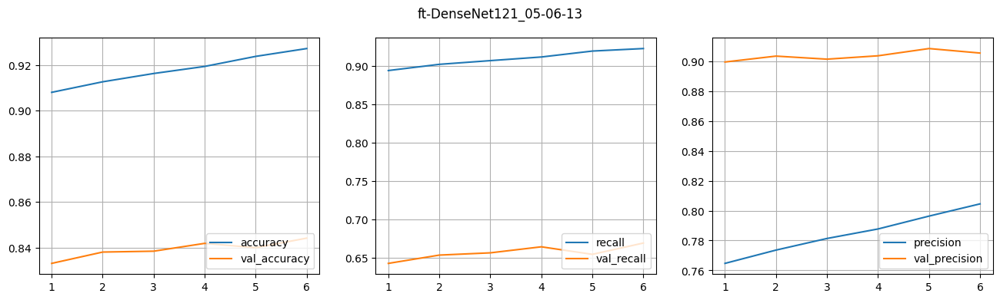

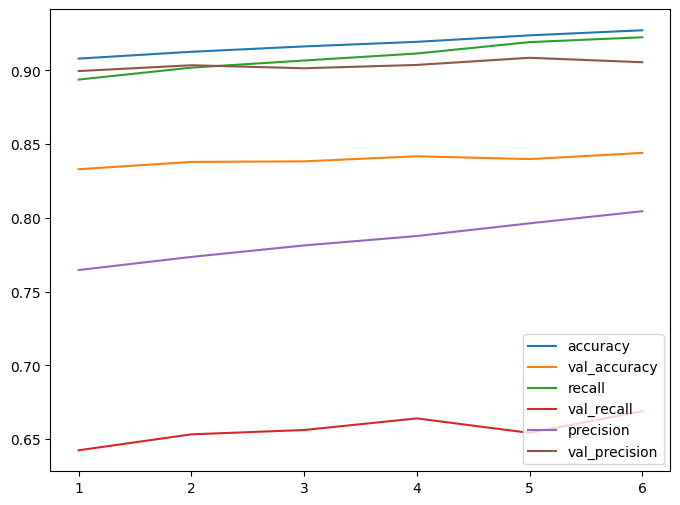

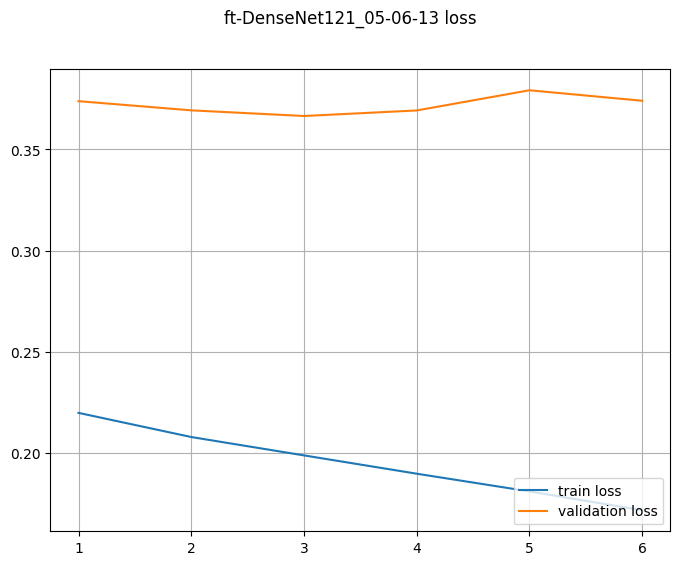

In [ ]:
history = ModelTraining(train_ds, val_ds,
                       ft_model, model_name=f"{label}"+MODEL_NAME,
                        optimizer=optimizer,
                        metrics=METRICS,
                        class_weights=class_weights,
                        callbacks_list=callbacks_list,
                        epochs=epochs)

In [ ]:
ft_model.save(f'ft-{MODEL_NAME}_last.keras')

### ОЦІНКА

In [ ]:
data_dir = pathlib.Path("/content/full_ds_croppedtr_no_augm")

In [ ]:
IM_SIZE = 256
BATCH_SIZE = 32

In [ ]:
test_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir / "test",
  class_names=["other", "melanoma"],
  seed=123,
  # image_size=(IM_SIZE, IM_SIZE),
  batch_size=BATCH_SIZE)

test_ds = test_ds.prefetch(buffer_size=tf.data.AUTOTUNE)

Found 19136 files belonging to 2 classes.


Після збереження моделей оцінка:
- донавчання feature extractor моделі з розморожуванням 51 шару
- подальше донавчання з розморожуванням 108 шарів, зменшенням lr, збільшенням batch, модель, що мала найменший loss на валідації
- модель, на якій зупинилось навчання, з кращими метриками на валідації

Донавчаний feature extractor з розморожуванням 51 шару, batch 32, lr=3e-5 зі зменшенням

In [ ]:
# model after fine tuning
model_path = f"/content/ft-DenseNet121_05-06-13.keras"
eval_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})

results = ModelEvaluating(test_ds,
                         eval_model, model_name='ft-DenseNet121_05-06-13',
                         metrics=METRICS)

598/598 ━━━━━━━━━━━━━━━━━━━━ 99s 126ms/step - accuracy: 0.9082 - auc: 0.8185 - fn: 521.5476 - fp: 336.9432 - loss: 0.2551 - prc: 0.3564 - precision: 0.4254 - recall: 0.3197 - tn: 8477.4092 - tp: 264.0468
loss :  0.24986626207828522
accuracy :  0.9103260636329651
precision :  0.44584381580352783
recall :  0.3345935642719269
tp :  531.0
fp :  660.0
tn :  16889.0
fn :  1056.0
auc :  0.8241851925849915
prc :  0.3757629096508026
f1_beta :  0.35216871349179996


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Оцінка моделі з найменшим loss після донавчання 108 шарів

In [ ]:
# model after fine tuning
model_path2 = f"/content/ft-DenseNet121_05-06-13_further.keras"
eval_model2 = keras.models.load_model(model_path2, custom_objects={"preprocess_input": preprocess_input})

results2 = ModelEvaluating(test_ds,
                           eval_model2, model_name='ft-DenseNet121_05-06-13_further',
                           metrics=METRICS)

598/598 ━━━━━━━━━━━━━━━━━━━━ 92s 116ms/step - accuracy: 0.9069 - auc: 0.8215 - fn: 522.4725 - fp: 343.7496 - loss: 0.2569 - prc: 0.3466 - precision: 0.4177 - recall: 0.3212 - tn: 8469.9912 - tp: 263.7329
loss :  0.25099438428878784
accuracy :  0.90964674949646
precision :  0.44083333015441895
recall :  0.3333333432674408
tp :  529.0
fp :  671.0
tn :  16878.0
fn :  1058.0
auc :  0.8270987868309021
prc :  0.3714568316936493
f1_beta :  0.3504239617465096


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Оцінка моделі, на якій зупинилось навчання

In [ ]:
# model after fine tuning
model_path3 = f"/content/ft-DenseNet121_05-06-13_last.keras"
eval_model3 = keras.models.load_model(model_path3, custom_objects={"preprocess_input": preprocess_input})

results3 = ModelEvaluating(test_ds,
                           eval_model3, model_name='ft-DenseNet121_05-06-13_last',
                           metrics=METRICS)

598/598 ━━━━━━━━━━━━━━━━━━━━ 73s 99ms/step - accuracy: 0.9071 - auc: 0.8246 - fn: 504.7729 - fp: 360.7195 - loss: 0.2651 - prc: 0.3560 - precision: 0.4253 - recall: 0.3461 - tn: 8452.9600 - tp: 281.4942
loss :  0.2588695287704468
accuracy :  0.9105350971221924
precision :  0.45074862241744995
recall :  0.36042848229408264
tp :  572.0
fp :  697.0
tn :  16852.0
fn :  1015.0
auc :  0.8304693102836609
prc :  0.3787882328033447
f1_beta :  0.375475910118935


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Найкраща з DenseNet моделей з параметрами навчання: розморожені 118 шарів після навчання класифікатора, lr=3-05 з sheduler decay.

### Отримання передбачень з train_ds (помилки)

In [ ]:
data_dir = pathlib.Path("/content/full_ds_croppedtr_no_augm")
show_dirs_len(data_dir)

.: 3
test: 2
test/other: 17549
test/melanoma: 1587
validation: 2
validation/other: 1599
validation/melanoma: 1018
train: 2
train/other: 64101
train/melanoma: 34637


In [ ]:
BATCH_SIZE = 32
IM_SIZE = 256

from keras.applications.efficientnet_v2 import preprocess_input

# preprocess for fine_tuning:
# def preprocess(image, label):
#   image = preprocess_input(image)
#   return image, label

MODEL_NAME = 'DenseNet121_05-05-17_train_preds'
model_path = '/content/ft-DenseNet121_05-05-17.keras'
model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})

train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir / "train",
  label_mode=None,
  image_size=(IM_SIZE, IM_SIZE)
  batch_size=BATCH_SIZE,
  shuffle=False)

prediction_df1 = ModelPredicting(train_ds, model, model_name=MODEL_NAME)

## EfficientNetV2B0

Параметри: learning rate=1e-4, batch_size=32

! оновити визначення версії, моделі, індекс, базова модель, модель

### Transfer learning

In [ ]:
labels = ['tl-', 'ft-']
label = labels[0]
print(label, MODEL_NAME)

# створення та компіляція transfer learning моделі
tl_model = make_model(metrics=METRICS, model=model, output_bias=initial_bias)
model.summary(show_trainable=True)

tl- EfficientNetV2B0_04-23-10


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ input_layer_1 (InputLayer)  │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ lambda (Lambda)             │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ efficientnetv2-b0           │ (None, 8, 8, 1280)    │  5,919,312 │   N   │
│ (Functional)                │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ global_average_pooling2d    │ (None, 1280)          │          0 │   -   │
│ (GlobalAveragePooling2D)    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dropout (Dropout)           │ (None, 1280)          │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ full_con1 (Dense)           │ (None, 128)           │    163,968 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ pred (Dense)                │ (None, 1)             │        129 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 6,083,409 (23.21 MB)

 Trainable params: 164,097 (641.00 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

In [ ]:
metrics_logger = MetricsLogger(filepath=f"metrics_logs_{label}{MODEL_NAME}.csv")

callbacks_list = [EarlyStopping(monitor='val_accuracy', patience=6),
                  ModelCheckpoint(f'{label}{MODEL_NAME}.keras', monitor='val_loss', save_best_only=True),
                  metrics_logger,
                  # WandbMetricsLogger(),
                  # WandbModelCheckpoint(filepath=f"small-{label}{MODEL_NAME}_wandb.keras", monitor="val_loss")
]

epochs=40

In [ ]:
# EfficientNetV2B0
history = tl_model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=callbacks_list,
  class_weight=class_weights
)

Epoch 1/40
2367/2367 ━━━━━━━━━━━━━━━━━━━━ 161s 53ms/step - accuracy: 0.9088 - auc: 0.9568 - fn: 1439.4135 - fp: 1511.3091 - loss: 0.2449 - prc: 0.9414 - precision: 0.8542 - recall: 0.8763 - tn: 24110.3965 - tp: 10842.7510 - val_accuracy: 0.7291 - val_auc: 0.8613 - val_fn: 674.0000 - val_fp: 35.0000 - val_loss: 0.6126 - val_prc: 0.8091 - val_precision: 0.9077 - val_recall: 0.3379 - val_tn: 1564.0000 - val_tp: 344.0000
Epoch 2/40
2367/2367 ━━━━━━━━━━━━━━━━━━━━ 166s 45ms/step - accuracy: 0.9396 - auc: 0.9750 - fn: 1278.3036 - fp: 1007.3024 - loss: 0.1813 - prc: 0.9669 - precision: 0.9156 - recall: 0.8967 - tn: 24620.4746 - tp: 10997.8838 - val_accuracy: 0.7348 - val_auc: 0.8782 - val_fn: 668.0000 - val_fp: 26.0000 - val_loss: 0.5686 - val_prc: 0.8298 - val_precision: 0.9309 - val_recall: 0.3438 - val_tn: 1573.0000 - val_tp: 350.0000
Epoch 3/40
2367/2367 ━━━━━━━━━━━━━━━━━━━━ 135s 42ms/step - accuracy: 0.9423 - auc: 0.9770 - fn: 1269.2479 - fp: 913.6520 - loss: 0.1730 - prc: 0.9691 - precis

In [ ]:
from google.colab import files

df_basic = pd.DataFrame(history.history)
df_basic.to_csv(f"metrics_{label}{MODEL_NAME}.csv", index=False)

files.download(f'/content/metrics_logs_{label}{MODEL_NAME}.csv')
files.download(f'/content/{label}{MODEL_NAME}.keras')
files.download(f'/content/metrics_{label}{MODEL_NAME}.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

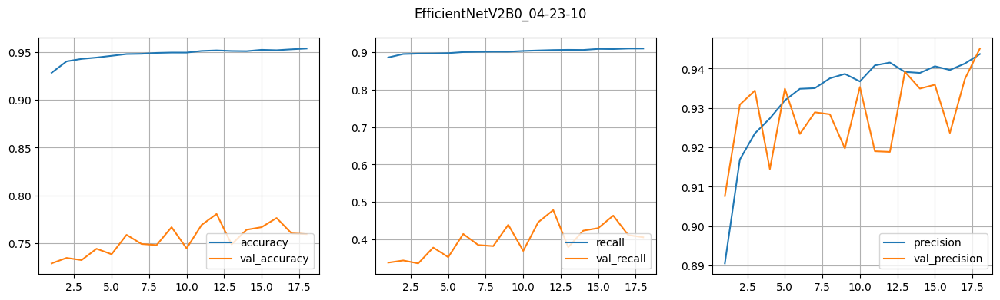

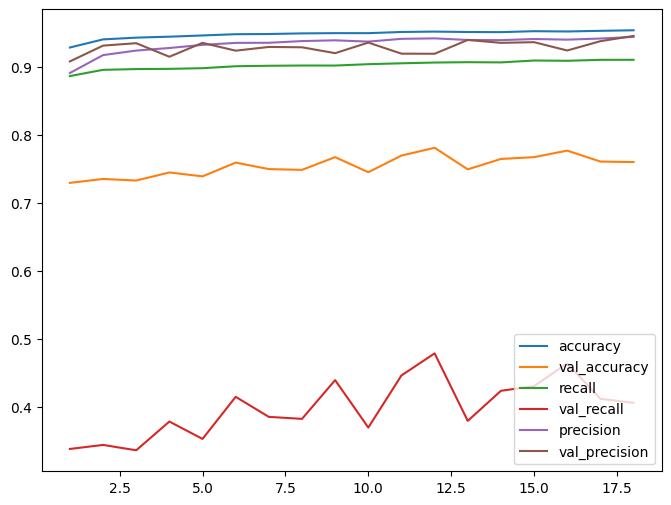

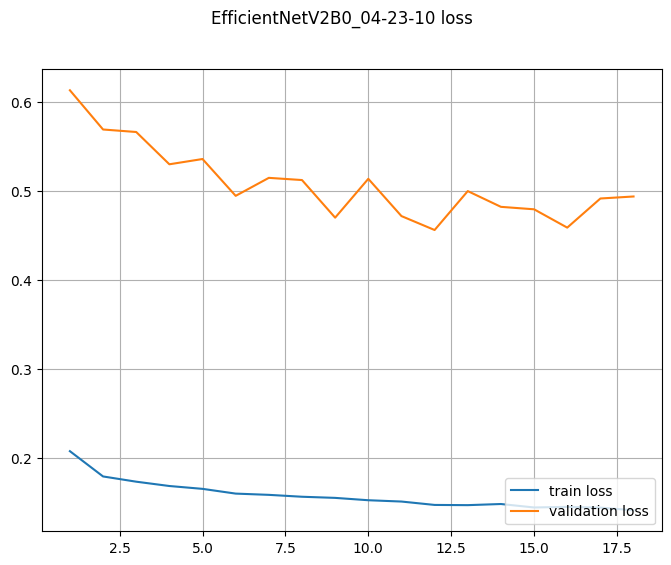

In [ ]:
plot_scores (df_basic, MODEL_NAME, ['accuracy', 'recall', 'precision'])
plot_loss(df_basic, MODEL_NAME)

In [ ]:
model_path = f"/content/tl-{MODEL_NAME}.keras"
best_tl_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})

best_tl_results = best_tl_model.evaluate(test_ds, verbose=1)

precision = best_tl_results[2]
recall = best_tl_results[3]
fbeta = fbeta_metric(precision, recall)
best_tl_results.append(fbeta)

598/598 ━━━━━━━━━━━━━━━━━━━━ 46s 64ms/step - accuracy: 0.9186 - auc: 0.8221 - fn: 583.8815 - fp: 193.8698 - loss: 0.2336 - prc: 0.3782 - precision: 0.5163 - recall: 0.2534 - tn: 8620.4824 - tp: 201.7129


In [ ]:
for metric, value in zip(["loss"] + [m.name for m in METRICS] + ["f1_beta"], best_tl_results):
  print(metric, ': ', value)
print()

loss :  0.2325289398431778
accuracy :  0.9187918305397034
precision :  0.5211267471313477
recall :  0.25645872950553894
tp :  407.0
fp :  374.0
tn :  17175.0
fn :  1180.0
auc :  0.8234942555427551
prc :  0.3870398700237274
f1_beta :  0.28545378185434384



In [ ]:
# Зберегти результат оцінки на тествому наборі
df_eval = pd.DataFrame({'Metric': ["loss"] + [m.name for m in METRICS] + ["f1_beta"], 'Value': best_tl_results})
df_eval.to_csv(f'evaluate_results_{label}{MODEL_NAME}.csv', index=False)
files.download(f'/content/evaluate_results_{label}{MODEL_NAME}.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Fine tuning

In [ ]:
MODEL_NAME='EfficientNetV2B0_04-23-10'


ft- EfficientNetV2B0_04-23-10


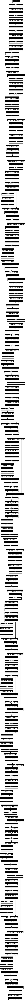

In [ ]:
labels = ['tl-', 'ft-']
label = labels[1]
print(label,  MODEL_NAME)

model_path = f"/content/tl-{MODEL_NAME}.keras"
best_tl_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})
# ! замінити назву шара:
base_model = best_tl_model.get_layer('efficientnetv2-b0')
plot_model(base_model, show_shapes=True)

In [ ]:
counter=0
for layer in base_model.layers:
  if '6' in layer.name:
    counter +=1
print(counter)

118


Розморожено 121 шар базової моделі

In [ ]:
for layer in base_model.layers[-121:]:
  layer.trainable=True

for layer in base_model.layers[:-121]:
  layer.trainable=False

best_tl_model.summary(show_trainable=True)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ input_layer_1 (InputLayer)  │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ lambda (Lambda)             │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ efficientnetv2-b0           │ (None, 8, 8, 1280)    │  5,919,312 │   N   │
│ (Functional)                │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ global_average_pooling2d    │ (None, 1280)          │          0 │   -   │
│ (GlobalAveragePooling2D)    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dropout (Dropout)           │ (None, 1280)          │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ full_con1 (Dense)           │ (None, 128)           │    163,968 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ pred (Dense)                │ (None, 1)             │        129 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 6,411,605 (24.46 MB)

 Trainable params: 4,650,797 (17.74 MB)

 Non-trainable params: 1,432,612 (5.46 MB)

 Optimizer params: 328,196 (1.25 MB)

In [ ]:
LEARNING_RATE=1e-05

In [ ]:
metrics_logger = MetricsLogger(filepath=f"metrics_logs_{label}{MODEL_NAME}.csv")

best_tl_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=LEARNING_RATE),
    loss=keras.losses.BinaryCrossentropy(),
    metrics=METRICS)

callbacks_list = [EarlyStopping(monitor='val_recall', patience=10),
                  ReduceLROnPlateau(factor=0.7, patience=5, min_lr=1e-6),
                  ModelCheckpoint(f'{label}{MODEL_NAME}.keras', monitor='val_loss', save_best_only=True),
                  metrics_logger,
                  # WandbMetricsLogger(),
                  # WandbModelCheckpoint(filepath=f"small-{label}{MODEL_NAME}_wandb.keras", monitor="val_loss")
]

epochs=60

In [ ]:
# EfficientNetV2B0 fine tuning
history = best_tl_model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=callbacks_list,
  class_weight=class_weights
)

Epoch 1/60
2367/2367 ━━━━━━━━━━━━━━━━━━━━ 245s 82ms/step - accuracy: 0.9266 - auc: 0.9707 - fn: 1290.6309 - fp: 1166.9742 - loss: 0.2011 - prc: 0.9609 - precision: 0.8828 - recall: 0.8969 - tn: 24459.5664 - tp: 10986.6660 - val_accuracy: 0.7417 - val_auc: 0.8945 - val_fn: 651.0000 - val_fp: 25.0000 - val_loss: 0.5270 - val_prc: 0.8529 - val_precision: 0.9362 - val_recall: 0.3605 - val_tn: 1574.0000 - val_tp: 367.0000 - learning_rate: 1.0000e-05
Epoch 2/60
2367/2367 ━━━━━━━━━━━━━━━━━━━━ 164s 69ms/step - accuracy: 0.9496 - auc: 0.9826 - fn: 1184.0211 - fp: 727.5545 - loss: 0.1513 - prc: 0.9752 - precision: 0.9391 - recall: 0.9034 - tn: 24905.8164 - tp: 11086.2539 - val_accuracy: 0.7707 - val_auc: 0.9055 - val_fn: 563.0000 - val_fp: 37.0000 - val_loss: 0.4771 - val_prc: 0.8696 - val_precision: 0.9248 - val_recall: 0.4470 - val_tn: 1562.0000 - val_tp: 455.0000 - learning_rate: 1.0000e-05
Epoch 3/60
2367/2367 ━━━━━━━━━━━━━━━━━━━━ 164s 69ms/step - accuracy: 0.9546 - auc: 0.9849 - fn: 1079.44

In [ ]:
from google.colab import files

df_basic = pd.DataFrame(history.history)
df_basic.to_csv(f"metrics_{label}{MODEL_NAME}.csv", index=False)

files.download(f'/content/metrics_logs_{label}{MODEL_NAME}.csv')
files.download(f'/content/{label}{MODEL_NAME}.keras')
files.download(f'/content/metrics_{label}{MODEL_NAME}.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
df_basic = pd.read_csv(f'/content/metrics_logs_{label}{MODEL_NAME}.csv')

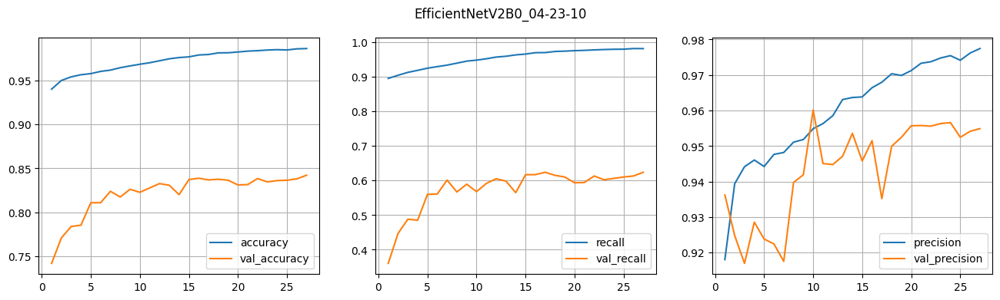

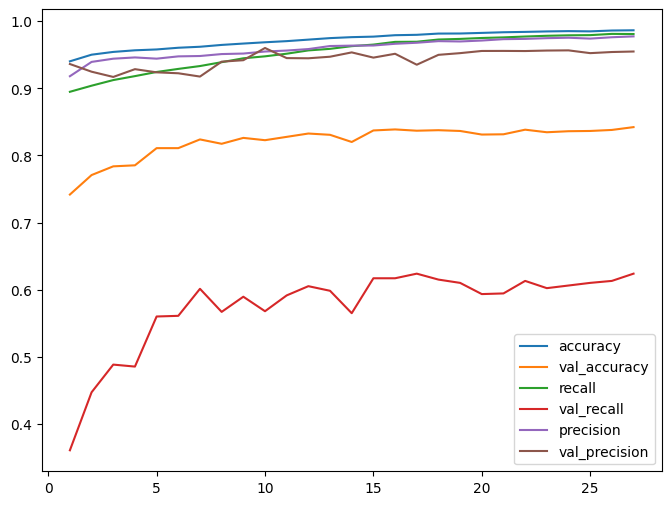

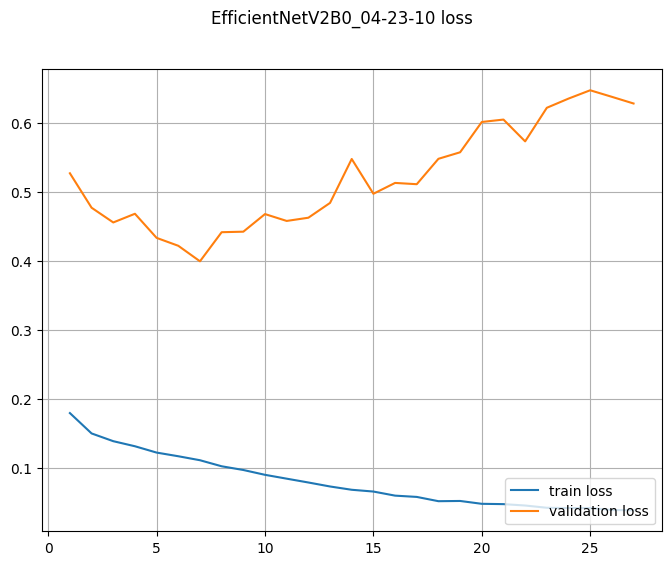

In [ ]:
plot_scores (df_basic, MODEL_NAME, ['accuracy', 'recall', 'precision'])
plot_loss(df_basic, MODEL_NAME)

In [ ]:
# load best model after fine tuning
model_path = f"/content/ft-{MODEL_NAME}.keras"
best_ft_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})

best_ft_results = best_ft_model.evaluate(test_ds, verbose=1)

precision = best_ft_results[2]
recall = best_ft_results[3]
fbeta = fbeta_metric(precision, recall)
best_ft_results.append(fbeta)

598/598 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - accuracy: 0.9242 - auc: 0.8678 - fn: 464.9199 - fp: 243.5075 - loss: 0.2107 - prc: 0.4939 - precision: 0.5579 - recall: 0.3967 - tn: 8570.8447 - tp: 320.6745


In [ ]:
for metric, value in zip(["loss"] + [m.name for m in METRICS] + ["f1_beta"], best_ft_results):
  print(metric, ': ', value)
print()

loss :  0.20797693729400635
accuracy :  0.9258465766906738
precision :  0.5755395889282227
recall :  0.40327662229537964
tp :  640.0
fp :  472.0
tn :  17077.0
fn :  947.0
auc :  0.8705374598503113
prc :  0.5040608048439026
f1_beta :  0.4289544256412275



In [ ]:
# Зберегти результат оцінки на тествому наборі
from google.colab import files
df_eval = pd.DataFrame({'Metric': ["loss"] + [m.name for m in METRICS] + ["f1_beta"], 'Value': best_ft_results})
df_eval.to_csv(f'evaluate_results_{label}{MODEL_NAME}.csv', index=False)
files.download(f'/content/evaluate_results_{label}{MODEL_NAME}.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

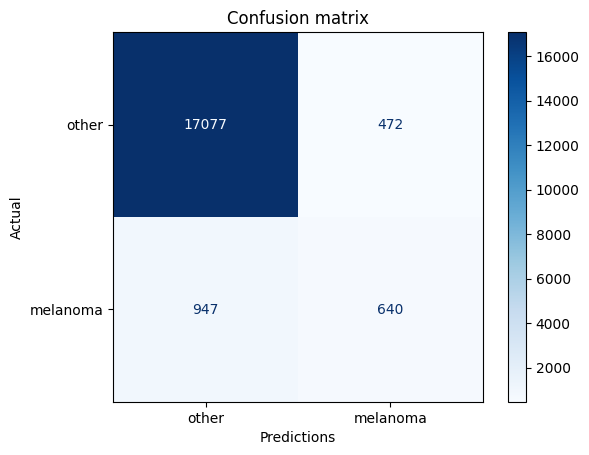

In [ ]:
predictions_array = []
test_labels_array = []
for images, labels in test_ds:
    predictions = best_ft_model.predict(images, verbose=0)
    predictions_array.extend(predictions)
    test_labels_array.extend(labels.numpy())
predictions_array = np.array(predictions_array)
test_labels_array = np.array(test_labels_array)

plot_confusion_matrix(test_labels_array, predictions_array, threshold=0.5)

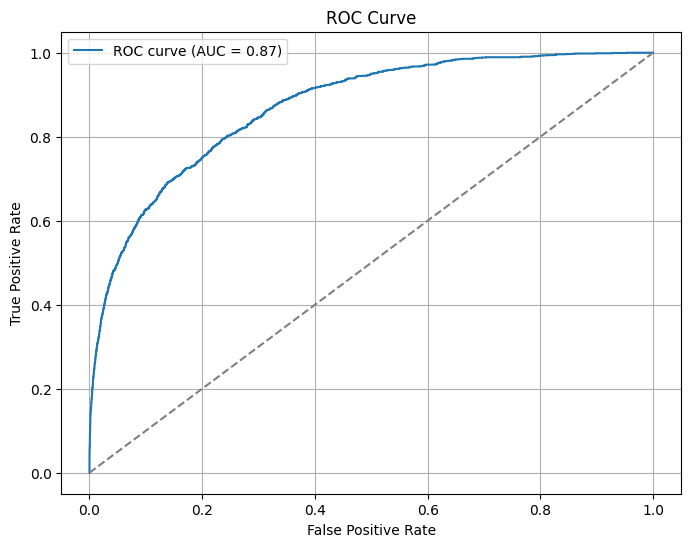

In [ ]:
from sklearn.metrics import precision_recall_curve, roc_curve, auc

predictions_array_rev =predictions_array.ravel()  # приводимо до 1D

fp_rate, tp_rate, _ = roc_curve(test_labels_array, predictions_array_rev)
roc_auc = auc(fp_rate, tp_rate)

plt.figure(figsize=(8, 6))
plt.plot(fp_rate, tp_rate, label=f"ROC curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.grid(True)
plt.show()

Оцінка останньої моделі, на якій зуаинилося навчання.

In [ ]:
last_model = best_tl_model
last_model.save('ft-EfficientNetV2B0_04-23-10_last.keras')

In [ ]:
MODEL_NAME

'EfficientNetV2B0_04-23-10'

In [ ]:
# check last model after fine tuning
model_path = f"/content/ft-{MODEL_NAME}_last.keras"
last_ft_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})
last_ft_results = last_ft_model.evaluate(test_ds, verbose=1)

precision = last_ft_results[2]
recall = last_ft_results[3]
fbeta = fbeta_metric(precision, recall)
last_ft_results.append(fbeta)

598/598 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step - accuracy: 0.9245 - auc: 0.8027 - fn: 496.8648 - fp: 210.0050 - loss: 0.3377 - prc: 0.4372 - precision: 0.5608 - recall: 0.3579 - tn: 8603.7109 - tp: 289.3656


In [ ]:
for metric, value in zip(["loss"] + [m.name for m in METRICS] + ["f1_beta"], last_ft_results):
  print(metric, ': ', value)
print()

loss :  0.3352084457874298
accuracy :  0.9261600971221924
precision :  0.5885946750640869
recall :  0.36420920491218567
tp :  578.0
fp :  404.0
tn :  17145.0
fn :  1009.0
auc :  0.8036298751831055
prc :  0.44966402649879456
f1_beta :  0.39427012496649033



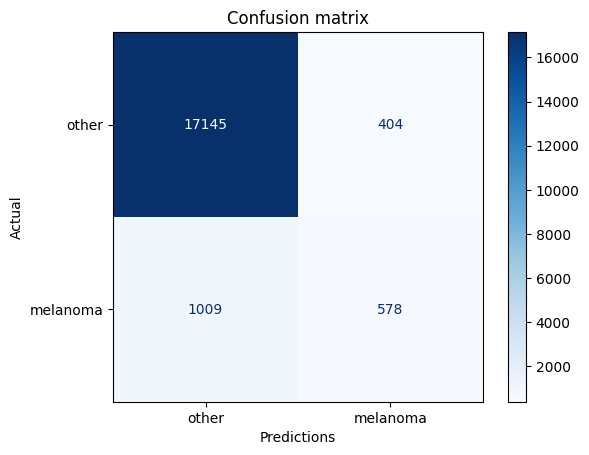

In [ ]:
predictions_array = []
test_labels_array = []
for images, labels in test_ds:
    predictions = last_ft_model.predict(images, verbose=0)
    predictions_array.extend(predictions)
    test_labels_array.extend(labels.numpy())
predictions_array = np.array(predictions_array)
test_labels_array = np.array(test_labels_array)

plot_confusion_matrix(test_labels_array, predictions_array, threshold=0.5)

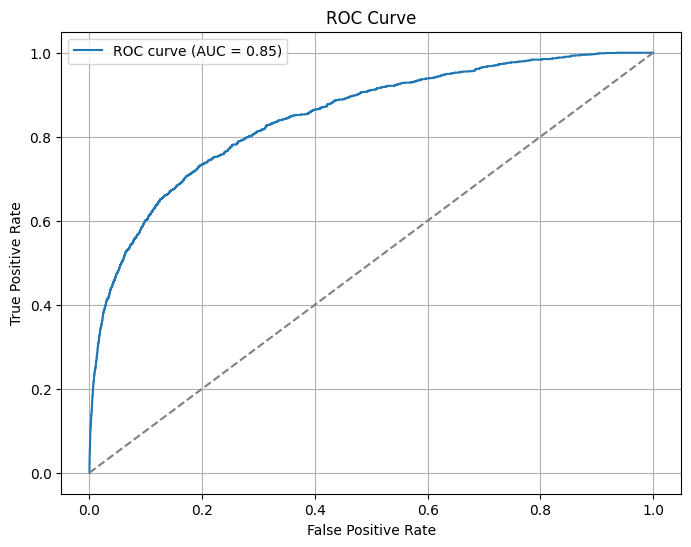

In [ ]:
predictions_array_rev = predictions_array.ravel()  # приводимо до 1D

fp_rate, tp_rate, _ = roc_curve(test_labels_array, predictions_array_rev)
roc_auc = auc(fp_rate, tp_rate)

plt.figure(figsize=(8, 6))
plt.plot(fp_rate, tp_rate, label=f"ROC curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.grid(True)
plt.show()

Валідація неточна через невелику вибірку, остання модель показує гіршу повноту, хоча на валідації вона краща за цією метрикою.

## Перевірка передбачень на зображеннях

Перевірка моделі ft-EfficientNetV2B0_04-23-10.keras на зображеннях тестового набору.

In [ ]:
from keras.applications.efficientnet_v2 import preprocess_input
from sklearn.metrics import classification_report, precision_recall_fscore_support

model_path = '/content/ft-EfficientNetV2B0_04-23-10.keras'
model_to_test = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})
img_size = (256, 256)
batch_size = 32

In [ ]:
# перевизначити, щоб прибрати prefetch та отримати атрибут датасету file_paths, а також прибрати мітки, перемішування
test_dataset = tf.keras.utils.image_dataset_from_directory(
  data_dir / "test",
  label_mode=None,
  image_size=img_size,
  batch_size=batch_size,
  shuffle=False)

Found 19136 files.


In [ ]:
predictions_df = get_predictions_df(model_to_test, img_size=(256, 256), batch_size=32, dataset=test_dataset)
print(classification_report(predictions_df['true_label'], predictions_df['predicted_label']))
print(precision_recall_fscore_support(predictions_df['true_label'], predictions_df['predicted_label'], beta=2.0, average='weighted'))

predictions_df.to_csv(f'Predictions_ft-EfficientNetV2B0_04-23-10_test_ds.csv', index=False)
from google.colab import files
files.download(f'Predictions_ft-EfficientNetV2B0_04-23-10_test_ds.csv')

              precision    recall  f1-score   support

           0       0.95      0.97      0.96     17549
           1       0.58      0.40      0.47      1587

    accuracy                           0.93     19136
   macro avg       0.76      0.69      0.72     19136
weighted avg       0.92      0.93      0.92     19136

(0.916614668516902, 0.9258465719063546, 0.9231711721052992, None)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
mask_fp = (predictions_df['true_label'] == 0) & (predictions_df['predicted_label'] == 1)
mask_fn = (predictions_df['true_label'] == 1) & (predictions_df['predicted_label'] == 0)
mask_tn = (predictions_df['true_label'] == 0) & (predictions_df['predicted_label'] == 0)
mask_tp = (predictions_df['true_label'] == 1) & (predictions_df['predicted_label'] == 1)
fp_images_pathes = predictions_df.file_path[mask_fp]
fn_images_pathes = predictions_df.file_path[mask_fn]
tp_images_pathes = predictions_df.file_path[mask_tp]
tn_images_pathes = predictions_df.file_path[mask_tn]
print(f'FP: {len(fp_images_pathes)}, FN: {len(fn_images_pathes)}')
print(f'TP: {len(tp_images_pathes)}, TN: {len(tn_images_pathes)}')

FP: 472, FN: 947
TP: 640, TN: 17077


False Negative:


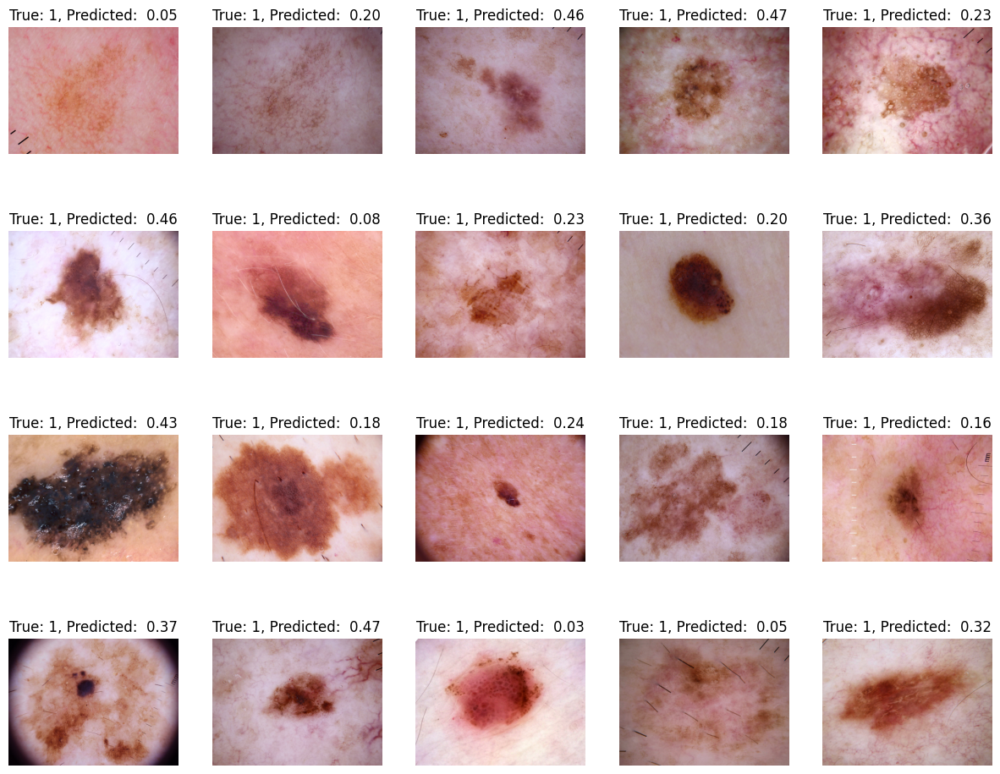

In [ ]:
# Візуалізація FN
print("False Negative:")
show_predicted(fn_images_pathes[:20])

False Positive:


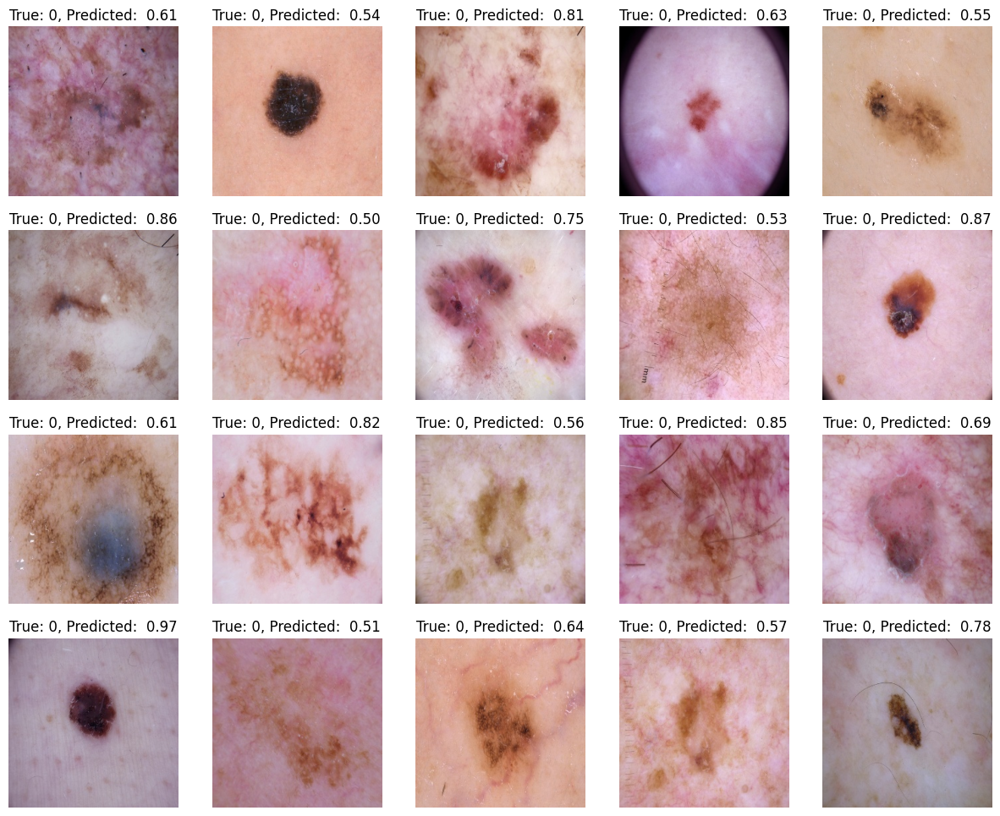

In [ ]:
# Візуалізація FP
print("False Positive:")
show_predicted(fp_images_pathes[:20])

### Оцінка на зміненому тестовому наборі зі зрізанимим краями для зображень з чорним фоном

---



In [ ]:
working_dir1 = pathlib.Path('/content/full_ds_croppedtr_no_augm/test/melanoma')
to_crop_dict = separate_vignette_images(working_dir1, center_ratio=0.5, threshold=70)
print(f"With vignette: {len(to_crop_dict['has'])}")
print(f"Without vignette: {len(to_crop_dict['not_has'])}")
print(len(os.listdir(working_dir1)))

With vignette: 517
Without vignette: 1070
1587


In [ ]:
for im_path in to_crop_dict['has']:
  im_path = str(im_path)
  crop_and_save(im_path)

In [ ]:
working_dir2 = pathlib.Path('/content/full_ds_croppedtr_no_augm/test/other')
to_crop_dict = separate_vignette_images(working_dir2, center_ratio=0.5, threshold=70)
print(f"With vignette: {len(to_crop_dict['has'])}")
print(f"Without vignette: {len(to_crop_dict['not_has'])}")
print(len(os.listdir(working_dir2)))

With vignette: 2028
Without vignette: 15521
17549


In [ ]:
for im_path in to_crop_dict['has']:
  im_path = str(im_path)
  crop_and_save(im_path)

In [ ]:
test_data_dir = pathlib.Path('/content/full_ds_croppedtr_no_augm/test')
test_ds = tf.keras.utils.image_dataset_from_directory(
  test_data_dir,
  class_names=["other", "melanoma"],
  seed=123,
  # image_size=(IM_SIZE, IM_SIZE),
  batch_size=BATCH_SIZE)

test_ds = test_ds.prefetch(buffer_size=tf.data.AUTOTUNE)

Found 19136 files belonging to 2 classes.


In [ ]:
model_path = '/content/ft-EfficientNetV2B0_04-23-10.keras'
ft_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})

ft_results = ft_model.evaluate(test_ds, verbose=1)

precision = ft_results[2]
recall = ft_results[3]
fbeta = fbeta_metric(precision, recall)
ft_results.append(fbeta)

598/598 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step - accuracy: 0.9264 - auc: 0.9024 - fn: 393.2805 - fp: 298.3372 - loss: 0.1954 - prc: 0.5448 - precision: 0.5618 - recall: 0.4878 - tn: 8516.0146 - tp: 392.3138


In [ ]:
for metric, value in zip(["loss"] + [m.name for m in METRICS] + ["f1_beta"], ft_results):
  print(metric, ': ', value)
print()

loss :  0.19322115182876587
accuracy :  0.9272575378417969
precision :  0.5713240504264832
recall :  0.4921235144138336
tp :  781.0
fp :  586.0
tn :  16963.0
fn :  806.0
auc :  0.9036266207695007
prc :  0.5536697506904602
f1_beta :  0.5061568439462015



In [ ]:
# Зберегти результат оцінки на тествому наборі
from google.colab import files
df_eval = pd.DataFrame({'Metric': ["loss"] + [m.name for m in METRICS] + ["f1_beta"], 'Value': ft_results})
df_eval.to_csv(f'evaluate_results_ft-EfficientNetV2B0_04-23-10_on_cropped_test.csv', index=False)
files.download(f'/content/evaluate_results_ft-EfficientNetV2B0_04-23-10_on_cropped_test.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Оброблені зображення модель розпізнає краще, тому що навчалась на таких зображеннях

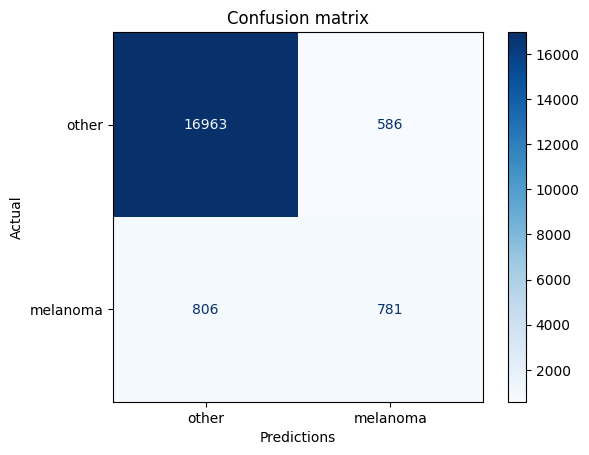

In [ ]:
predictions_array = []
test_labels_array = []
for images, labels in test_ds:
    predictions = ft_model.predict(images, verbose=0)
    predictions_array.extend(predictions)
    test_labels_array.extend(labels.numpy())
predictions_array = np.array(predictions_array)
test_labels_array = np.array(test_labels_array)

plot_confusion_matrix(test_labels_array, predictions_array, threshold=0.5)

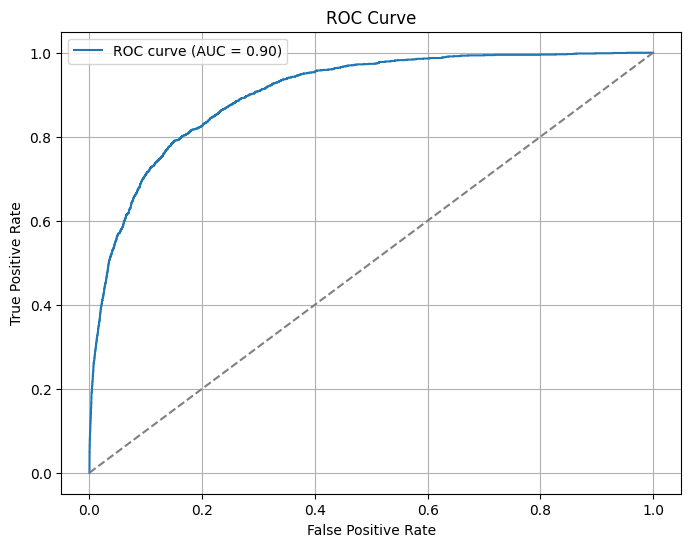

In [ ]:
predictions_array_rev = predictions_array.ravel()  # приводимо до 1D

fp_rate, tp_rate, _ = roc_curve(test_labels_array, predictions_array_rev)
roc_auc = auc(fp_rate, tp_rate)

plt.figure(figsize=(8, 6))
plt.plot(fp_rate, tp_rate, label=f"ROC curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.grid(True)
plt.show()

## Зміна розміру batch

Параметри: learning_rate=1e-4, batch_size=64

In [ ]:
IM_SIZE = 256
BATCH_SIZE = 64
VERSION = generate_model_version_name()
LEARNING_RATE = 1e-4
VERSION

'04-27-21'

In [ ]:
MODEL_NAME

'EfficientNetV2B0_04-27-21'

### Transfer learning

In [ ]:
labels = ['tl-', 'ft-']
label = labels[0]
print(label, MODEL_NAME)

# створення та компіляція transfer learning моделі
tl_model = make_model(metrics=METRICS, model=model, output_bias=initial_bias)
tl_model.summary(show_trainable=True)

tl- EfficientNetV2B0_04-27-21


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ input_layer_1 (InputLayer)  │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ lambda (Lambda)             │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ efficientnetv2-b0           │ (None, 8, 8, 1280)    │  5,919,312 │   N   │
│ (Functional)                │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ global_average_pooling2d    │ (None, 1280)          │          0 │   -   │
│ (GlobalAveragePooling2D)    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dropout (Dropout)           │ (None, 1280)          │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ full_con1 (Dense)           │ (None, 128)           │    163,968 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ pred (Dense)                │ (None, 1)             │        129 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 6,083,409 (23.21 MB)

 Trainable params: 164,097 (641.00 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

In [ ]:
metrics_logger = MetricsLogger(filepath=f"metrics_logs_{label}{MODEL_NAME}.csv")

callbacks_list = [EarlyStopping(monitor='val_accuracy', patience=6),
                  ModelCheckpoint(f'{label}{MODEL_NAME}.keras', monitor='val_loss', save_best_only=True),
                  metrics_logger,
                  # WandbMetricsLogger(),
                  # WandbModelCheckpoint(filepath=f"small-{label}{MODEL_NAME}_wandb.keras", monitor="val_loss")
]

epochs=20

In [ ]:
# EfficientNetV2B0
history = tl_model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=callbacks_list,
  class_weight=class_weights
)

Epoch 1/20
1184/1184 ━━━━━━━━━━━━━━━━━━━━ 190s 120ms/step - accuracy: 0.9083 - auc: 0.9557 - fn: 1489.6920 - fp: 1540.4102 - loss: 0.2590 - prc: 0.9396 - precision: 0.8540 - recall: 0.8730 - tn: 24123.1328 - tp: 10797.5723 - val_accuracy: 0.7318 - val_auc: 0.8523 - val_fn: 650.0000 - val_fp: 52.0000 - val_loss: 0.6100 - val_prc: 0.7980 - val_precision: 0.8762 - val_recall: 0.3615 - val_tn: 1547.0000 - val_tp: 368.0000
Epoch 2/20
1184/1184 ━━━━━━━━━━━━━━━━━━━━ 124s 97ms/step - accuracy: 0.9388 - auc: 0.9746 - fn: 1289.9849 - fp: 1033.0835 - loss: 0.1831 - prc: 0.9666 - precision: 0.9135 - recall: 0.8960 - tn: 24622.1797 - tp: 11006.1289 - val_accuracy: 0.7360 - val_auc: 0.8680 - val_fn: 663.0000 - val_fp: 28.0000 - val_loss: 0.6043 - val_prc: 0.8170 - val_precision: 0.9269 - val_recall: 0.3487 - val_tn: 1571.0000 - val_tp: 355.0000
Epoch 3/20
1184/1184 ━━━━━━━━━━━━━━━━━━━━ 136s 94ms/step - accuracy: 0.9406 - auc: 0.9758 - fn: 1271.6625 - fp: 977.3798 - loss: 0.1782 - prc: 0.9681 - preci

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

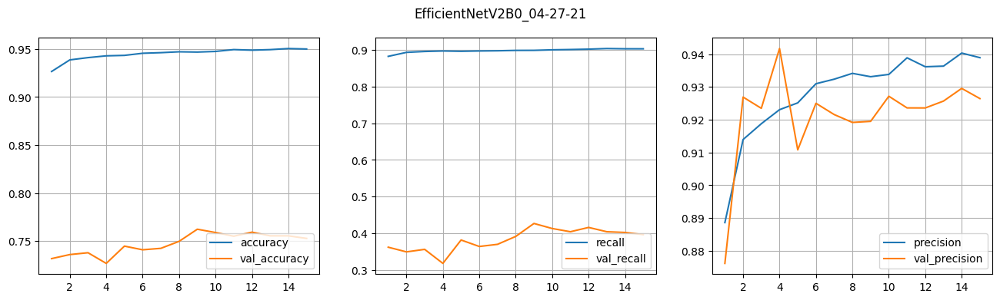

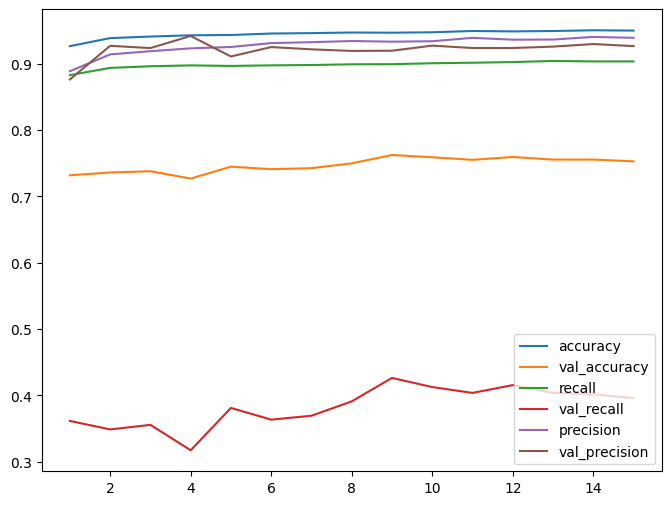

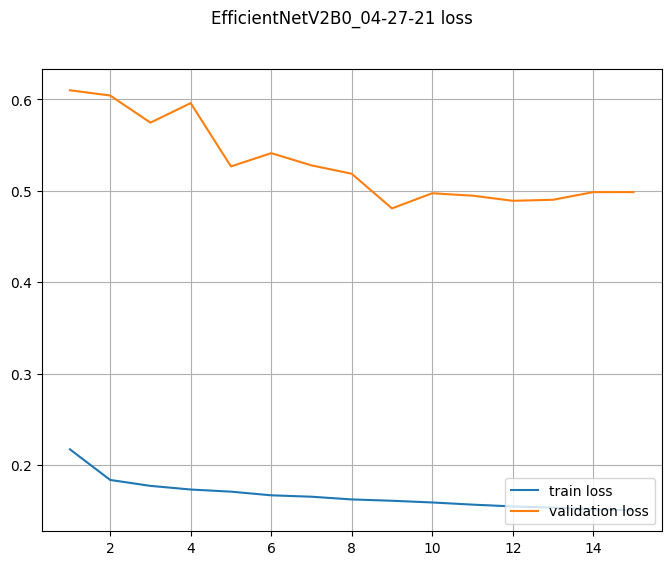

In [ ]:
from google.colab import files

df_basic = pd.DataFrame(history.history)
df_basic.to_csv(f"metrics_{label}{MODEL_NAME}.csv", index=False)

files.download(f'/content/metrics_logs_{label}{MODEL_NAME}.csv')
files.download(f'/content/{label}{MODEL_NAME}.keras')
files.download(f'/content/metrics_{label}{MODEL_NAME}.csv')

plot_scores (df_basic, MODEL_NAME, ['accuracy', 'recall', 'precision'])
plot_loss(df_basic, MODEL_NAME)

In [ ]:
model_path = f"/content/tl-{MODEL_NAME}.keras"
best_tl_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})

best_tl_results = best_tl_model.evaluate(test_ds, verbose=1)

precision = best_tl_results[2]
recall = best_tl_results[3]
fbeta = fbeta_metric(precision, recall)
best_tl_results.append(fbeta)

for metric, value in zip(["loss"] + [m.name for m in METRICS] + ["f1_beta"], best_tl_results):
  print(metric, ': ', value)
print()

# Зберегти результат оцінки на тествому наборі
df_eval = pd.DataFrame({'Metric': ["loss"] + [m.name for m in METRICS] + ["f1_beta"], 'Value': best_tl_results})
df_eval.to_csv(f'evaluate_results_{label}{MODEL_NAME}.csv', index=False)
files.download(f'/content/evaluate_results_{label}{MODEL_NAME}.csv')

299/299 ━━━━━━━━━━━━━━━━━━━━ 63s 166ms/step - accuracy: 0.9187 - auc: 0.7997 - fn: 638.3000 - fp: 138.2600 - loss: 0.2405 - prc: 0.3301 - precision: 0.5237 - recall: 0.1890 - tn: 8703.4863 - tp: 151.7400
loss :  0.23872382938861847
accuracy :  0.9189485907554626
precision :  0.5314685106277466
recall :  0.1915563941001892
tp :  304.0
fp :  268.0
tn :  17281.0
fn :  1283.0
auc :  0.8031793832778931
prc :  0.33979955315589905
f1_beta :  0.21965317677997367



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Додати при transfer learning training=True, learning_rate=1e-5

In [ ]:
IM_SIZE = 256
BATCH_SIZE = 64
VERSION = generate_model_version_name()
LEARNING_RATE = 1e-5
VERSION

'04-28-09'

In [ ]:
MODEL_NAME

'EfficientNetV2B0_04-28-09'

In [ ]:
# модель
inputs = keras.Input(shape=(IM_SIZE, IM_SIZE, 3))
preprocessed = layers.Lambda(preprocess_input)(inputs)
x = base_model(preprocessed, training=True)
x = keras.layers.GlobalAveragePooling2D()(x)
x = keras.layers.Dropout(0.5)(x)
x = keras.layers.Dense(128, activation='relu', name="full_con1")(x)
outputs = keras.layers.Dense(1, activation='sigmoid', name="pred")(x)
model = keras.Model(inputs, outputs)

In [ ]:
labels = ['tl-', 'ft-']
label = labels[0]
print(label, MODEL_NAME)

# створення та компіляція transfer learning моделі
tl_model = make_model(metrics=METRICS, model=model, learning_rate=LEARNING_RATE, output_bias=initial_bias)
tl_model.summary(show_trainable=True)

tl- EfficientNetV2B0_04-28-09


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ input_layer_1 (InputLayer)  │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ lambda (Lambda)             │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ efficientnetv2-b0           │ (None, 8, 8, 1280)    │  5,919,312 │   N   │
│ (Functional)                │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ global_average_pooling2d    │ (None, 1280)          │          0 │   -   │
│ (GlobalAveragePooling2D)    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dropout (Dropout)           │ (None, 1280)          │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ full_con1 (Dense)           │ (None, 128)           │    163,968 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ pred (Dense)                │ (None, 1)             │        129 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 6,083,409 (23.21 MB)

 Trainable params: 164,097 (641.00 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

In [ ]:
metrics_logger = MetricsLogger(filepath=f"metrics_logs_{label}{MODEL_NAME}.csv")

callbacks_list = [EarlyStopping(monitor='val_accuracy', patience=6),
                  ModelCheckpoint(f'{label}{MODEL_NAME}.keras', monitor='val_loss', save_best_only=True),
                  metrics_logger,
                  # WandbMetricsLogger(),
                  # WandbModelCheckpoint(filepath=f"small-{label}{MODEL_NAME}_wandb.keras", monitor="val_loss")
]

epochs=20

In [ ]:
# EfficientNetV2B0
history = tl_model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=callbacks_list,
  class_weight=class_weights
)

Epoch 1/20
1184/1184 ━━━━━━━━━━━━━━━━━━━━ 172s 114ms/step - accuracy: 0.7955 - auc: 0.7947 - fn: 4098.0684 - fp: 2239.2092 - loss: 0.5350 - prc: 0.7319 - precision: 0.7084 - recall: 0.5631 - tn: 23413.2285 - tp: 8199.1992 - val_accuracy: 0.7207 - val_auc: 0.8118 - val_fn: 627.0000 - val_fp: 104.0000 - val_loss: 0.5821 - val_prc: 0.7345 - val_precision: 0.7899 - val_recall: 0.3841 - val_tn: 1495.0000 - val_tp: 391.0000
Epoch 2/20
1184/1184 ━━━━━━━━━━━━━━━━━━━━ 127s 101ms/step - accuracy: 0.9185 - auc: 0.9629 - fn: 1555.7190 - fp: 1538.7595 - loss: 0.2404 - prc: 0.9499 - precision: 0.8752 - recall: 0.8737 - tn: 24118.9375 - tp: 10736.1006 - val_accuracy: 0.7241 - val_auc: 0.8236 - val_fn: 625.0000 - val_fp: 97.0000 - val_loss: 0.6016 - val_prc: 0.7502 - val_precision: 0.8020 - val_recall: 0.3861 - val_tn: 1502.0000 - val_tp: 393.0000
Epoch 3/20
1184/1184 ━━━━━━━━━━━━━━━━━━━━ 139s 100ms/step - accuracy: 0.9240 - auc: 0.9671 - fn: 1439.8473 - fp: 1418.6060 - loss: 0.2183 - prc: 0.9564 - pr

In [ ]:
epochs=10
history = tl_model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=callbacks_list,
  class_weight=class_weights
)

Epoch 1/10
1184/1184 ━━━━━━━━━━━━━━━━━━━━ 116s 92ms/step - accuracy: 0.9433 - auc: 0.9772 - fn: 1253.9038 - fp: 921.4287 - loss: 0.1730 - prc: 0.9696 - precision: 0.9241 - recall: 0.8990 - tn: 24739.0078 - tp: 11036.5049 - val_accuracy: 0.7524 - val_auc: 0.8709 - val_fn: 583.0000 - val_fp: 65.0000 - val_loss: 0.5252 - val_prc: 0.8220 - val_precision: 0.8700 - val_recall: 0.4273 - val_tn: 1534.0000 - val_tp: 435.0000
Epoch 2/10
1184/1184 ━━━━━━━━━━━━━━━━━━━━ 108s 87ms/step - accuracy: 0.9419 - auc: 0.9771 - fn: 1276.7527 - fp: 919.5316 - loss: 0.1745 - prc: 0.9690 - precision: 0.9223 - recall: 0.8961 - tn: 24741.7227 - tp: 11012.6104 - val_accuracy: 0.7554 - val_auc: 0.8716 - val_fn: 577.0000 - val_fp: 63.0000 - val_loss: 0.5233 - val_prc: 0.8227 - val_precision: 0.8750 - val_recall: 0.4332 - val_tn: 1536.0000 - val_tp: 441.0000
Epoch 3/10
1184/1184 ━━━━━━━━━━━━━━━━━━━━ 110s 89ms/step - accuracy: 0.9417 - auc: 0.9773 - fn: 1262.9258 - fp: 963.3300 - loss: 0.1735 - prc: 0.9694 - precisio

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

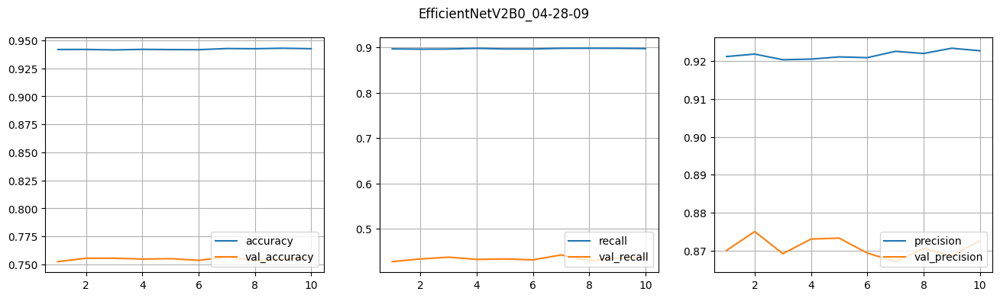

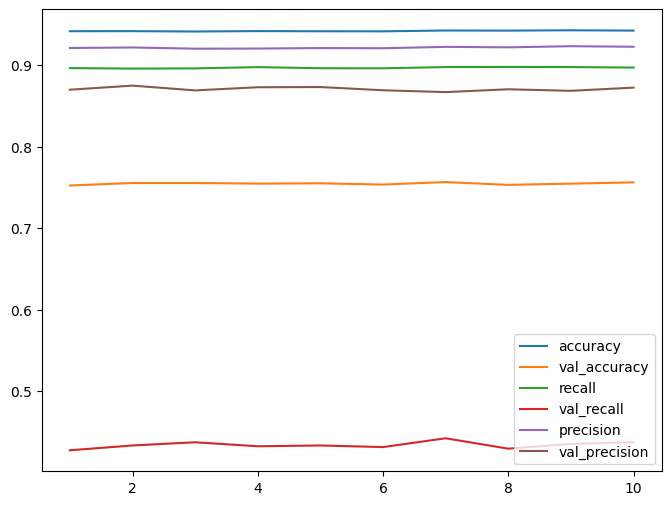

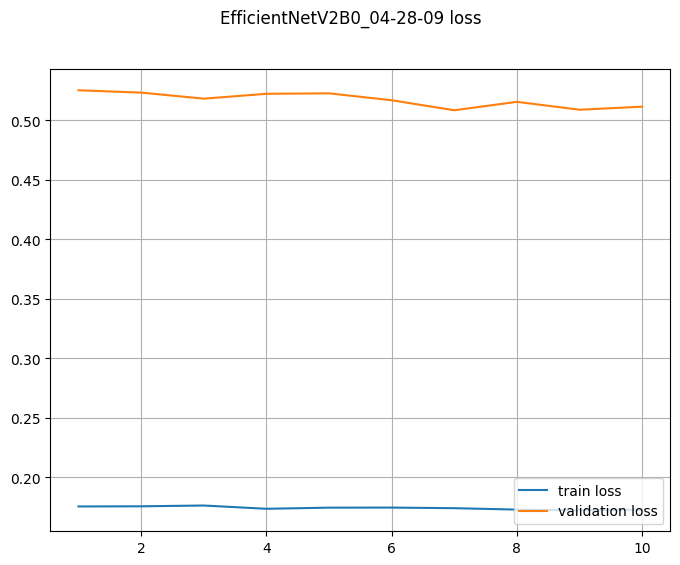

In [ ]:
from google.colab import files

df_basic = pd.DataFrame(history.history)
df_basic.to_csv(f"metrics_{label}{MODEL_NAME}.csv", index=False)

files.download(f'/content/metrics_logs_{label}{MODEL_NAME}.csv')
files.download(f'/content/{label}{MODEL_NAME}.keras')
files.download(f'/content/metrics_{label}{MODEL_NAME}.csv')

plot_scores (df_basic, MODEL_NAME, ['accuracy', 'recall', 'precision'])
plot_loss(df_basic, MODEL_NAME)

In [ ]:
model_path = f"/content/tl-{MODEL_NAME}.keras"
best_tl_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})
# оцінка останньої моделі
best_tl_results = best_tl_model.evaluate(test_ds, verbose=1)

precision = best_tl_results[2]
recall = best_tl_results[3]
fbeta = fbeta_metric(precision, recall)
best_tl_results.append(fbeta)

for metric, value in zip(["loss"] + [m.name for m in METRICS] + ["f1_beta"], best_tl_results):
  print(metric, ': ', value)
print()

# Зберегти результат оцінки на тествому наборі
df_eval = pd.DataFrame({'Metric': ["loss"] + [m.name for m in METRICS] + ["f1_beta"], 'Value': tl_results})
df_eval.to_csv(f'evaluate_results_{label}{MODEL_NAME}.csv', index=False)
files.download(f'/content/evaluate_results_{label}{MODEL_NAME}.csv')

299/299 ━━━━━━━━━━━━━━━━━━━━ 49s 134ms/step - accuracy: 0.9105 - auc: 0.8117 - fn: 641.3167 - fp: 204.5900 - loss: 0.2453 - prc: 0.2936 - precision: 0.4176 - recall: 0.1821 - tn: 8637.4062 - tp: 148.4733
loss :  0.2426702380180359
accuracy :  0.9117892980575562
precision :  0.4281650185585022
recall :  0.1896660327911377
tp :  301.0
fp :  402.0
tn :  17147.0
fn :  1286.0
auc :  0.8122014403343201
prc :  0.30053964257240295
f1_beta :  0.21344489819605225



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
test_data_dir = pathlib.Path('/content/full_ds_croppedtr_no_augm/test')
prepocess_to_crop(test_data_dir)

With vignette /content/full_ds_croppedtr_no_augm/test/other: 2028
Without vignette /content/full_ds_croppedtr_no_augm/test/other: 15521
17549
With vignette /content/full_ds_croppedtr_no_augm/test/melanoma: 517
Without vignette /content/full_ds_croppedtr_no_augm/test/melanoma: 1070
1587


In [ ]:
# test_data_dir = pathlib.Path('/content/full_ds_croppedtr_no_augm/test')
test_ds = tf.keras.utils.image_dataset_from_directory(
  test_data_dir,
  class_names=["other", "melanoma"],
  seed=123,
  # image_size=(IM_SIZE, IM_SIZE),
  batch_size=BATCH_SIZE)

test_ds = test_ds.prefetch(buffer_size=tf.data.AUTOTUNE)

Found 19136 files belonging to 2 classes.


In [ ]:
# model_path = f"/content/tl-{MODEL_NAME}.keras"
# best_tl_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})
# оцінка останньої моделі
best_tl_results = best_tl_model.evaluate(test_ds, verbose=1)

precision = best_tl_results[2]
recall = best_tl_results[3]
fbeta = fbeta_metric(precision, recall)
best_tl_results.append(fbeta)

for metric, value in zip(["loss"] + [m.name for m in METRICS] + ["f1_beta"], best_tl_results):
  print(metric, ': ', value)
print()

# Зберегти результат оцінки на тествому наборі
# df_eval = pd.DataFrame({'Metric': ["loss"] + [m.name for m in METRICS] + ["f1_beta"], 'Value': tl_results})
# df_eval.to_csv(f'evaluate_results_{label}{MODEL_NAME}.csv', index=False)
# files.download(f'/content/evaluate_results_{label}{MODEL_NAME}.csv')

299/299 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - accuracy: 0.9048 - auc: 0.8168 - fn: 601.1433 - fp: 304.5300 - loss: 0.2508 - prc: 0.2910 - precision: 0.3780 - recall: 0.2323 - tn: 8537.2168 - tp: 188.8967
loss :  0.24852226674556732
accuracy :  0.906302273273468
precision :  0.39446720480918884
recall :  0.2425960898399353
tp :  385.0
fp :  591.0
tn :  16958.0
fn :  1202.0
auc :  0.8189079761505127
prc :  0.3020575940608978
f1_beta :  0.2628345127106395



Збільшення batch_size до 64, зменшення lr до 1e-5, використання training=True для навчання статистик batch norm не покращило feature extraction.

### Fine tuning на 2х блоках зі збільшеним датасетом (аугментація обох класів)

Шари EfficientNetV2B0

In [ ]:
for i, layer in enumerate(base_model.layers):
  print(f'{i+1}. {layer.name}: {layer.output.shape}')

1. input_layer: (None, 256, 256, 3)
2. rescaling: (None, 256, 256, 3)
3. normalization: (None, 256, 256, 3)
4. stem_conv: (None, 128, 128, 32)
5. stem_bn: (None, 128, 128, 32)
6. stem_activation: (None, 128, 128, 32)
7. block1a_project_conv: (None, 128, 128, 16)
8. block1a_project_bn: (None, 128, 128, 16)
9. block1a_project_activation: (None, 128, 128, 16)
10. block2a_expand_conv: (None, 64, 64, 64)
11. block2a_expand_bn: (None, 64, 64, 64)
12. block2a_expand_activation: (None, 64, 64, 64)
13. block2a_project_conv: (None, 64, 64, 32)
14. block2a_project_bn: (None, 64, 64, 32)
15. block2b_expand_conv: (None, 64, 64, 128)
16. block2b_expand_bn: (None, 64, 64, 128)
17. block2b_expand_activation: (None, 64, 64, 128)
18. block2b_project_conv: (None, 64, 64, 32)
19. block2b_project_bn: (None, 64, 64, 32)
20. block2b_drop: (None, 64, 64, 32)
21. block2b_add: (None, 64, 64, 32)
22. block3a_expand_conv: (None, 32, 32, 128)
23. block3a_expand_bn: (None, 32, 32, 128)
24. block3a_expand_activation

In [ ]:
IM_SIZE = 256
BATCH_SIZE = 32
VERSION = generate_model_version_name()
LEARNING_RATE = 5e-5
VERSION

'04-29-19'

In [ ]:
MODEL_NAME

'EfficientNetV2B0_04-29-19'

In [ ]:
# weight_0, weight_1 = binary_class_weights(train_ds)
weight_0, weight_1 = binary_class_weights_2(count_1, count_0)

class_weights = {0: weight_0, 1: weight_1}

print(f'Weight for class 0: {weight_0:.2f}')
print(f'Weight for class 1: {weight_1:.2f}')

Weight for class 0: 0.62
Weight for class 1: 2.60


In [ ]:
# initial_bias = initial_bias_calc(train_ds)
initial_bias = initial_bias_calc_2(count_1, count_0)
print(f'initial_bias: {initial_bias}')

initial_bias: -1.4338372778413724


In [ ]:
# MODEL_NAME='EfficientNetV2B0_04-23-10'
labels = ['tl-', 'ft-']
label = labels[1]
print(label,  MODEL_NAME)
model_path = '/content/ft-EfficientNetV2B0_04-23-10.keras'
# model_path = f"/content/ft-{MODEL_NAME}.keras"

ft_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})
base_model = ft_model.get_layer('efficientnetv2-b0')

ft- EfficientNetV2B0_04-29-19


In [ ]:
for i, layer in enumerate(base_model.layers):
  print(f'{i}. {layer.name}: {layer.output.shape}')

0. input_layer: (None, 256, 256, 3)
1. rescaling: (None, 256, 256, 3)
2. normalization: (None, 256, 256, 3)
3. stem_conv: (None, 128, 128, 32)
4. stem_bn: (None, 128, 128, 32)
5. stem_activation: (None, 128, 128, 32)
6. block1a_project_conv: (None, 128, 128, 16)
7. block1a_project_bn: (None, 128, 128, 16)
8. block1a_project_activation: (None, 128, 128, 16)
9. block2a_expand_conv: (None, 64, 64, 64)
10. block2a_expand_bn: (None, 64, 64, 64)
11. block2a_expand_activation: (None, 64, 64, 64)
12. block2a_project_conv: (None, 64, 64, 32)
13. block2a_project_bn: (None, 64, 64, 32)
14. block2b_expand_conv: (None, 64, 64, 128)
15. block2b_expand_bn: (None, 64, 64, 128)
16. block2b_expand_activation: (None, 64, 64, 128)
17. block2b_project_conv: (None, 64, 64, 32)
18. block2b_project_bn: (None, 64, 64, 32)
19. block2b_drop: (None, 64, 64, 32)
20. block2b_add: (None, 64, 64, 32)
21. block3a_expand_conv: (None, 32, 32, 128)
22. block3a_expand_bn: (None, 32, 32, 128)
23. block3a_expand_activation:

In [ ]:
for layer in base_model.layers[-195:]:
  layer.trainable=True

for layer in base_model.layers[:-195]:
  layer.trainable=False

ft_model.summary(show_trainable=True)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ input_layer_1 (InputLayer)  │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ lambda (Lambda)             │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ efficientnetv2-b0           │ (None, 8, 8, 1280)    │  5,919,312 │   N   │
│ (Functional)                │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ global_average_pooling2d    │ (None, 1280)          │          0 │   -   │
│ (GlobalAveragePooling2D)    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dropout (Dropout)           │ (None, 1280)          │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ full_con1 (Dense)           │ (None, 128)           │    163,968 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ pred (Dense)                │ (None, 1)             │        129 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 15,385,005 (58.69 MB)

 Trainable params: 5,597,845 (21.35 MB)

 Non-trainable params: 485,564 (1.85 MB)

 Optimizer params: 9,301,596 (35.48 MB)

In [ ]:
metrics_logger = MetricsLogger(filepath=f"metrics_logs_{label}{MODEL_NAME}.csv")

ft_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=LEARNING_RATE),
    loss=keras.losses.BinaryCrossentropy(),
    metrics=METRICS)

callbacks_list = [EarlyStopping(monitor='val_recall', patience=10),
                  ReduceLROnPlateau(factor=0.8, patience=5, min_lr=1e-6),
                  ModelCheckpoint(f'{label}{MODEL_NAME}.keras', monitor='val_loss', save_best_only=True),
                  metrics_logger,
                  # WandbMetricsLogger(),
                  # WandbModelCheckpoint(filepath=f"small-{label}{MODEL_NAME}_wandb.keras", monitor="val_loss")
]

epochs=20

In [ ]:
# EfficientNetV2B0 fine tuning
history = ft_model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=callbacks_list,
  class_weight=class_weights
)

Epoch 1/20
3970/3970 ━━━━━━━━━━━━━━━━━━━━ 582s 124ms/step - accuracy: 0.8888 - auc: 0.9526 - fn: 1718.6165 - fp: 5113.9824 - loss: 0.2754 - prc: 0.8822 - precision: 0.6672 - recall: 0.8544 - tn: 46109.7031 - tp: 10609.3887 - val_accuracy: 0.8544 - val_auc: 0.9415 - val_fn: 307.0000 - val_fp: 74.0000 - val_loss: 0.3298 - val_prc: 0.9210 - val_precision: 0.9057 - val_recall: 0.6984 - val_tn: 1525.0000 - val_tp: 711.0000 - learning_rate: 5.0000e-05
Epoch 2/20
3970/3970 ━━━━━━━━━━━━━━━━━━━━ 433s 108ms/step - accuracy: 0.9145 - auc: 0.9752 - fn: 1139.5153 - fp: 4198.2954 - loss: 0.2006 - prc: 0.9293 - precision: 0.7241 - recall: 0.9043 - tn: 47029.2734 - tp: 11184.7578 - val_accuracy: 0.8728 - val_auc: 0.9456 - val_fn: 228.0000 - val_fp: 105.0000 - val_loss: 0.3193 - val_prc: 0.9299 - val_precision: 0.8827 - val_recall: 0.7760 - val_tn: 1494.0000 - val_tp: 790.0000 - learning_rate: 5.0000e-05
Epoch 3/20
3970/3970 ━━━━━━━━━━━━━━━━━━━━ 433s 107ms/step - accuracy: 0.9337 - auc: 0.9854 - fn: 75

KeyboardInterrupt: 

Перенавчання, зростає val_loss

In [ ]:
# load best model after fine tuning
model_path = f"/content/ft-{MODEL_NAME}.keras"
best_ft_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})

best_ft_results = best_ft_model.evaluate(test_ds, verbose=1)

precision = best_ft_results[2]
recall = best_ft_results[3]
fbeta = fbeta_metric(precision, recall)
best_ft_results.append(fbeta)

for metric, value in zip(["loss"] + [m.name for m in METRICS] + ["f1_beta"], best_ft_results):
  print(metric, ': ', value)
print()

598/598 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - accuracy: 0.9123 - auc: 0.8504 - fn: 360.6277 - fp: 456.1102 - loss: 0.2562 - prc: 0.5074 - precision: 0.4736 - recall: 0.5265 - tn: 8358.2422 - tp: 424.9666
loss :  0.25004681944847107
accuracy :  0.9155518412590027
precision :  0.49160394072532654
recall :  0.5349716544151306
tp :  849.0
fp :  878.0
tn :  16671.0
fn :  738.0
auc :  0.8523417115211487
prc :  0.5220766067504883
f1_beta :  0.525696602745715



In [ ]:
# Зберегти результат оцінки на тествому наборі
from google.colab import files
df_eval = pd.DataFrame({'Metric': ["loss"] + [m.name for m in METRICS] + ["f1_beta"], 'Value': best_ft_results})
df_eval.to_csv(f'evaluate_results_{label}{MODEL_NAME}.csv', index=False)
files.download(f'/content/evaluate_results_{label}{MODEL_NAME}.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from tensorflow.keras import backend as K
K.clear_session()

Оцінка на cropped test_ds

In [ ]:
test_data_dir = pathlib.Path('/content/full_ds_croppedtr_no_augm/test')
prepocess_to_crop(test_data_dir, center_ratio=0.5, threshold=70)

test_ds = tf.keras.utils.image_dataset_from_directory(
  test_data_dir,
  class_names=["other", "melanoma"],
  seed=123,
  # image_size=(IM_SIZE, IM_SIZE),
  batch_size=BATCH_SIZE)

test_ds = test_ds.prefetch(buffer_size=tf.data.AUTOTUNE)

# model_path = '/content/ft-EfficientNetV2B0_04-29-19.keras'
# best_ft_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})

ft_results = best_ft_model.evaluate(test_ds, verbose=1)

precision = ft_results[2]
recall = ft_results[3]
fbeta = fbeta_metric(precision, recall)
ft_results.append(fbeta)

for metric, value in zip(["loss"] + [m.name for m in METRICS] + ["f1_beta"], ft_results):
  print(metric, ': ', value)
print()

With vignette /content/full_ds_croppedtr_no_augm/test/other: 2028
Without vignette /content/full_ds_croppedtr_no_augm/test/other: 15521
17549
With vignette /content/full_ds_croppedtr_no_augm/test/melanoma: 517
Without vignette /content/full_ds_croppedtr_no_augm/test/melanoma: 1070
1587
Found 19136 files belonging to 2 classes.
598/598 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step - accuracy: 0.9112 - auc: 0.8963 - fn: 303.5826 - fp: 524.0484 - loss: 0.2304 - prc: 0.5414 - precision: 0.4719 - recall: 0.5959 - tn: 8290.3037 - tp: 482.0117
loss :  0.2242589294910431
accuracy :  0.914402186870575
precision :  0.4871794879436493
recall :  0.6105859875679016
tp :  969.0
fp :  1020.0
tn :  16529.0
fn :  618.0
auc :  0.898946225643158
prc :  0.5640715956687927
f1_beta :  0.5811442794975699



In [ ]:
# Зберегти результат оцінки на тествому наборі
from google.colab import files
df_eval = pd.DataFrame({'Metric': ["loss"] + [m.name for m in METRICS] + ["f1_beta"], 'Value': best_ft_results})
df_eval.to_csv(f'evaluate_results_{label}{MODEL_NAME}.csv', index=False)
files.download(f'/content/evaluate_results_{label}{MODEL_NAME}.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# перевизначити, щоб прибрати prefetch та отримати атрибут датасету file_paths, а також прибрати мітки, перемішування
test_dataset = tf.keras.utils.image_dataset_from_directory(
  data_dir / "test",
  label_mode=None,
  image_size=(256, 256),
  batch_size=BATCH_SIZE,
  shuffle=False)

predictions_df = get_predictions_df(best_ft_model, img_size=(256, 256), batch_size=32, dataset=test_dataset)
print(classification_report(predictions_df['true_label'], predictions_df['predicted_label']))
print(precision_recall_fscore_support(predictions_df['true_label'], predictions_df['predicted_label'], beta=2.0, average='weighted'))

predictions_df.to_csv(f'Predictions_{label}{MODEL_NAME}_test_ds.csv', index=False)
files.download(f'Predictions_{label}{MODEL_NAME}_test_ds.csv')

Found 19136 files.
              precision    recall  f1-score   support

           0       0.96      0.94      0.95     17549
           1       0.49      0.61      0.54      1587

    accuracy                           0.91     19136
   macro avg       0.73      0.78      0.75     19136
weighted avg       0.92      0.91      0.92     19136

(0.9244181253953373, 0.9144021739130435, 0.9159360079548808, None)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

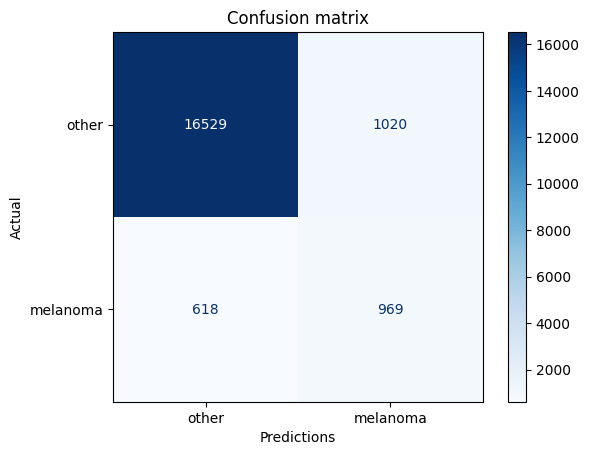

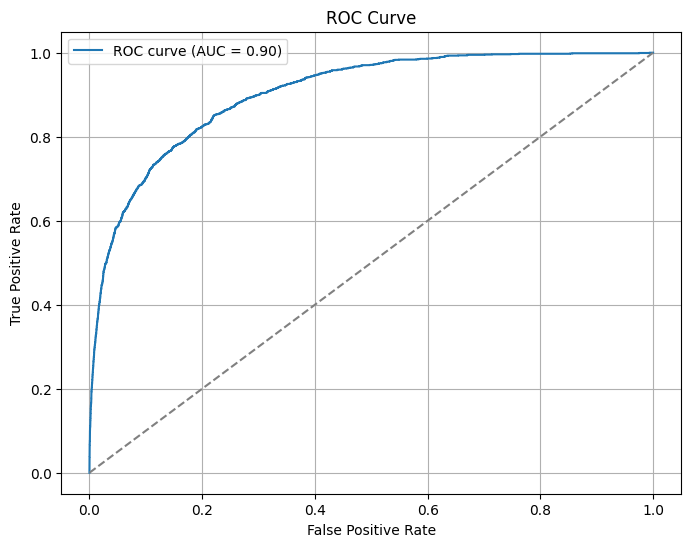

In [ ]:
plot_confusion_matrix(predictions_df['true_label'], predictions_df['predicted_label'], threshold=0.5)

fp_rate, tp_rate, _ = roc_curve(predictions_df['true_label'], predictions_df['predicted_prob'])
roc_auc = auc(fp_rate, tp_rate)

plt.figure(figsize=(8, 6))
plt.plot(fp_rate, tp_rate, label=f"ROC curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.grid(True)
plt.show()

## Отримання передбачень з train_ds (помилки)

In [ ]:
tf.keras.backend.clear_session()

In [ ]:
data_dir = pathlib.Path("/content/full_ds_croppedtr_no_augm")
show_dirs_len(data_dir)

.: 3
test: 2
test/other: 17549
test/melanoma: 1587
validation: 2
validation/other: 1599
validation/melanoma: 1018
train: 2
train/other: 64101
train/melanoma: 24450


! визначення параметрів, метрик, train_ds

In [ ]:
IM_SIZE = 256
BATCH_SIZE = 16
# VERSION = generate_model_version_name()
# MODEL_NAME = f"EfficientNetV2B0_{VERSION}"
MODEL_NAME = 'EfficientNetV2B0_05-24-11'
LEARNING_RATE = 1e-5

In [ ]:
from keras.applications.efficientnet_v2 import preprocess_input

base_model_name = 'EfficientNetV2B0_04-23-10_train_preds'
model_path = '/content/ft-EfficientNetV2B0_04-23-10.keras'
base_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})

In [ ]:
# tl-EfficientNetV2B0_04-23-10.keras

base_model_name2 = 'tl-EfficientNetV2B0_04-23-10.keras_train_preds'
model_path2 = '/content/tl-EfficientNetV2B0_04-23-10.keras'
base_model2 = keras.models.load_model(model_path2, custom_objects={"preprocess_input": preprocess_input})

In [ ]:
from keras.applications.efficientnet_v2 import preprocess_input
base_model_name = 'EfficientNetV2B0_05-24-11_train_preds'
model_path = '/content/EfficientNetV2B0_05-24-11.keras'
base_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})

Found 88551 files.
              precision    recall  f1-score   support

           0       0.94      0.86      0.90     64101
           1       0.69      0.86      0.77     24450

    accuracy                           0.86     88551
   macro avg       0.82      0.86      0.83     88551
weighted avg       0.87      0.86      0.86     88551

(0.8731823321746093, 0.8568960260189044, 0.8575610603671383, None)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

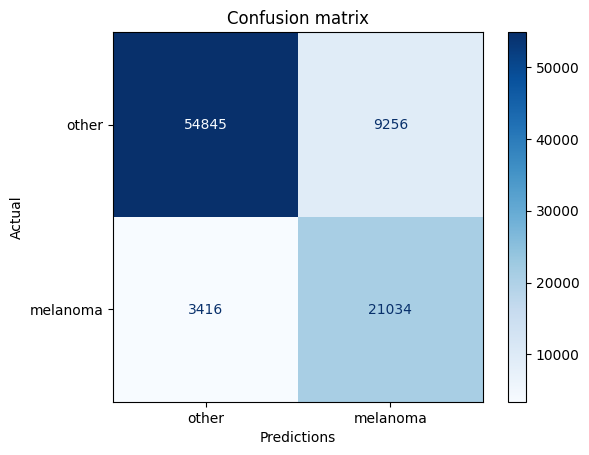

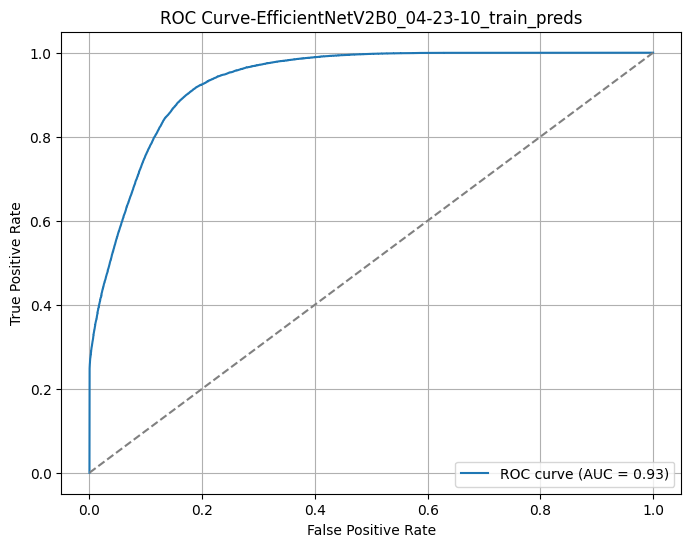

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir / "train",
  label_mode=None,
  image_size=(IM_SIZE, IM_SIZE),
  batch_size=BATCH_SIZE,
  shuffle=False)

prediction_df_train = ModelPredicting(train_ds, base_model, model_name=base_model_name)

In [ ]:
prediction_df_train = pd.read_csv('/content/Predictions_EfficientNetV2B0_04-23-10_train_preds.csv')

## Донавчання на помилках

In [ ]:
def select_hard_examples(predictions_df, batch_size, image_size=(256, 256), easy_ratio=0.3):

  mask_fp = (predictions_df['true_label'] == 0) & (predictions_df['predicted_label'] == 1)
  mask_fn = (predictions_df['true_label'] == 1) & (predictions_df['predicted_label'] == 0)
  mask_tn = (predictions_df['true_label'] == 0) & (predictions_df['predicted_label'] == 0)
  mask_tp = (predictions_df['true_label'] == 1) & (predictions_df['predicted_label'] == 1)
  mask_weak_preds1 = (predictions_df['predicted_prob'] <=0.75) & mask_tp
  mask_weak_preds0 = (predictions_df['predicted_prob'] >=0.25) & mask_tn

  hard_examples = predictions_df[mask_fp | mask_fn | mask_weak_preds1 | mask_weak_preds0]
  # image_paths_hard_examples = hard_examples.file_path
  # labels_hard_examples = hard_examples.true_label

  sampled_easy_examples = predictions_df[~(mask_fp | mask_fn | mask_weak_preds1 | mask_weak_preds0)].sample(frac=0.3, random_state=42)
  # sampled_labels = sampled_easy_examples['true_label']
  # sampled_image_paths = sampled_easy_examples['file_path']

  combined_df = pd.concat([hard_examples, sampled_easy_examples])
  image_paths = combined_df['file_path']
  labels = combined_df['true_label']

  image_paths = np.array(image_paths)
  labels = np.array(labels)

  print(f"Found {image_paths.shape[0]} files and {np.unique(labels)} classes")
  count_1 = (labels==1).sum()
  count_0 = labels.shape[0] - count_1

  dataset = tf.data.Dataset.from_tensor_slices((image_paths, labels))
  dataset = dataset.map(lambda path, label: preprocess_image(path, label, size=image_size), num_parallel_calls=tf.data.AUTOTUNE)
  dataset = dataset.shuffle(1000).batch(batch_size)
  # dataset = dataset.prefetch(tf.data.AUTOTUNE)
  return dataset, [count_1, count_0]

In [ ]:
train_ds, count_list = select_hard_examples(prediction_df_train, BATCH_SIZE)

val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir / "validation",
  class_names=["other", "melanoma"],
  seed=123,
  # image_size=(IM_SIZE, IM_SIZE),
  batch_size=BATCH_SIZE)

test_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir / "test",
  class_names=["other", "melanoma"],
  seed=123,
  # image_size=(IM_SIZE, IM_SIZE),
  batch_size=BATCH_SIZE)

# train_ds = train_ds.shuffle(64).prefetch(buffer_size=tf.data.AUTOTUNE)
train_ds = train_ds.prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size=tf.data.AUTOTUNE)
# test_ds = test_ds.prefetch(buffer_size=tf.data.AUTOTUNE)

Found 40180 files and [0 1] classes
Found 2617 files belonging to 2 classes.
Found 19136 files belonging to 2 classes.


In [ ]:
count_1, count_0 = count_list
weight_0, weight_1 = binary_class_weights_2(count_1, count_0)

class_weights = {0: weight_0, 1: weight_1}

print(f'Weight for class 0: {weight_0:.2f}')
print(f'Weight for class 1: {weight_1:.2f}')

Weight for class 0: 0.70
Weight for class 1: 1.78


In [ ]:
# backbone_model = base_model.get_layer('efficientnetv2-b0')

# for layer in backbone_model.layers[-195:]:
#   layer.trainable=True

# for layer in backbone_model.layers[:-195]:
#   layer.trainable=False

In [ ]:
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=LEARNING_RATE,
    decay_steps=1858,
    decay_rate=0.95
)

optimizer = keras.optimizers.Adam(learning_rate=lr_schedule, weight_decay=0.01)

filepath = f"{MODEL_NAME}_best_auc.keras"
custom_checkpoint = CustomCheckpoint(filepath=filepath, monitor_metric='val_auc')

callbacks_list = [EarlyStopping(monitor='val_auc', patience=6),
                  ModelCheckpoint(f'{MODEL_NAME}.keras', monitor='val_loss', save_best_only=True),
                  custom_checkpoint
]

epochs=20

In [ ]:
history = ModelTraining(train_ds, val_ds,
                       base_model, model_name=MODEL_NAME,
                        optimizer=optimizer, loss_func=keras.losses.BinaryFocalCrossentropy(),
                        metrics=METRICS,
                        class_weights=class_weights,
                        callbacks_list=callbacks_list,
                        epochs=epochs)

EfficientNetV2B0_05-24-11


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ input_layer_1 (InputLayer)  │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ lambda (Lambda)             │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ efficientnetv2-b0           │ (None, 8, 8, 1280)    │  5,919,312 │   N   │
│ (Functional)                │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ global_average_pooling2d    │ (None, 1280)          │          0 │   -   │
│ (GlobalAveragePooling2D)    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dropout (Dropout)           │ (None, 1280)          │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ full_con1 (Dense)           │ (None, 128)           │    163,968 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ pred (Dense)                │ (None, 1)             │        129 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 6,083,409 (23.21 MB)

 Trainable params: 5,597,845 (21.35 MB)

 Non-trainable params: 485,564 (1.85 MB)

Epoch 1/20
2512/2512 ━━━━━━━━━━━━━━━━━━━━ 285s 83ms/step - accuracy: 0.7999 - auc: 0.8846 - fn: 1798.1206 - fp: 2109.7700 - loss: 0.1626 - prc: 0.8286 - precision: 0.7609 - recall: 0.7499 - tn: 12843.8613 - tp: 5977.2319 - val_accuracy: 0.7604 - val_auc: 0.9142 - val_fn: 615.0000 - val_fp: 12.0000 - val_loss: 0.1627 - val_prc: 0.8825 - val_precision: 0.9711 - val_recall: 0.3959 - val_tn: 1587.0000 - val_tp: 403.0000
Epoch 2/20
2512/2512 ━━━━━━━━━━━━━━━━━━━━ 194s 69ms/step - accuracy: 0.8500 - auc: 0.7958 - fn: 775.7712 - fp: 1554.4751 - loss: 0.1275 - prc: 0.9077 - precision: 0.8113 - recall: 0.8689 - tn: 11801.3447 - tp: 5980.3926 - val_accuracy: 0.7749 - val_auc: 0.9164 - val_fn: 568.0000 - val_fp: 21.0000 - val_loss: 0.1627 - val_prc: 0.8861 - val_precision: 0.9554 - val_recall: 0.4420 - val_tn: 1578.0000 - val_tp: 450.0000
Epoch 3/20
2512/2512 ━━━━━━━━━━━━━━━━━━━━ 202s 69ms/step - accuracy: 0.8600 - auc: 0.8038 - fn: 699.7127 - fp: 1463.4938 - loss: 0.1162 - prc: 0.9174 - precision

EfficientNetV2B0_05-24-11


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ input_layer_1 (InputLayer)  │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ lambda (Lambda)             │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ efficientnetv2-b0           │ (None, 8, 8, 1280)    │  5,919,312 │   N   │
│ (Functional)                │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ global_average_pooling2d    │ (None, 1280)          │          0 │   -   │
│ (GlobalAveragePooling2D)    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dropout (Dropout)           │ (None, 1280)          │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ full_con1 (Dense)           │ (None, 128)           │    163,968 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ pred (Dense)                │ (None, 1)             │        129 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 6,083,409 (23.21 MB)

 Trainable params: 5,597,845 (21.35 MB)

 Non-trainable params: 485,564 (1.85 MB)

Epoch 1/20
2512/2512 ━━━━━━━━━━━━━━━━━━━━ 284s 82ms/step - accuracy: 0.8384 - auc: 0.8040 - fn: 1025.5702 - fp: 1224.0111 - loss: 0.1306 - prc: 0.9179 - precision: 0.8378 - recall: 0.8216 - tn: 12131.2461 - tp: 5731.1567 - val_accuracy: 0.8089 - val_auc: 0.9249 - val_fn: 467.0000 - val_fp: 33.0000 - val_loss: 0.1878 - val_prc: 0.9002 - val_precision: 0.9435 - val_recall: 0.5413 - val_tn: 1566.0000 - val_tp: 551.0000
Epoch 2/20
2512/2512 ━━━━━━━━━━━━━━━━━━━━ 191s 67ms/step - accuracy: 0.9060 - auc: 0.8416 - fn: 452.0107 - fp: 940.2268 - loss: 0.0791 - prc: 0.9624 - precision: 0.8801 - recall: 0.9189 - tn: 12411.5166 - tp: 6308.2300 - val_accuracy: 0.8028 - val_auc: 0.9234 - val_fn: 482.0000 - val_fp: 34.0000 - val_loss: 0.1900 - val_prc: 0.8984 - val_precision: 0.9404 - val_recall: 0.5265 - val_tn: 1565.0000 - val_tp: 536.0000
Epoch 3/20
2512/2512 ━━━━━━━━━━━━━━━━━━━━ 176s 70ms/step - accuracy: 0.9083 - auc: 0.8449 - fn: 458.2802 - fp: 884.2113 - loss: 0.0791 - prc: 0.9639 - precision: 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

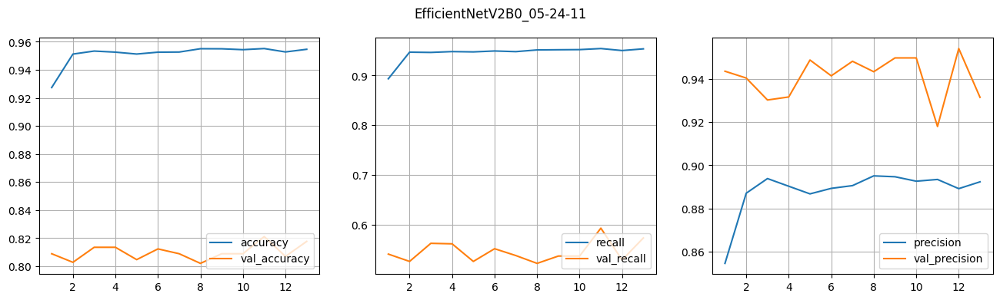

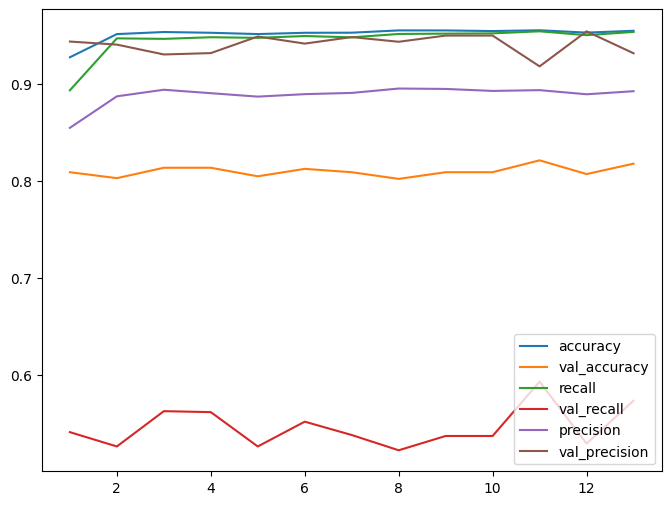

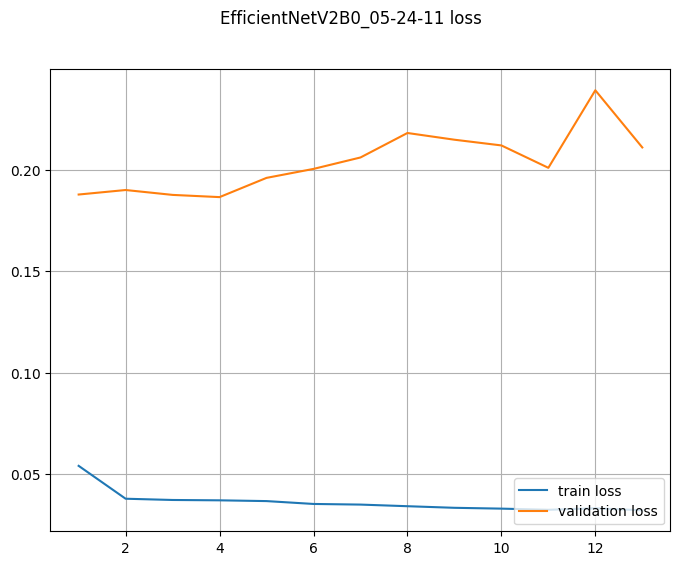

In [ ]:
history = ModelTraining(train_ds, val_ds,
                       base_model, model_name=MODEL_NAME,
                        optimizer=optimizer, loss_func=keras.losses.BinaryFocalCrossentropy(),
                        metrics=METRICS,
                        class_weights=class_weights,
                        callbacks_list=callbacks_list,
                        epochs=epochs)

In [ ]:
model_path = '/content/EfficientNetV2B0_05-24-11.keras'
best_loss_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})
# оцінка на необроблених даних
best_loss_results = ModelEvaluating(test_ds,
                           best_loss_model, model_name='best_loss-'+ MODEL_NAME,
                           metrics=METRICS)

In [ ]:
# model_path = f"/content/{MODEL_NAME}.keras"
model_path = '/content/EfficientNetV2B0_05-24-11_best_auc.keras'
best_ft_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})
# оцінка на необроблених даних
best_ft_results = ModelEvaluating(test_ds,
                           best_ft_model, model_name='best_auc-'+ MODEL_NAME,
                           metrics=METRICS)

1196/1196 ━━━━━━━━━━━━━━━━━━━━ 50s 34ms/step - accuracy: 0.9284 - auc: 0.8054 - fn: 550.8471 - fp: 115.6917 - loss: 0.1169 - prc: 0.4528 - precision: 0.6617 - recall: 0.2829 - tn: 8682.7197 - tp: 234.7285
loss :  0.11484789103269577
accuracy :  0.930079460144043
precision :  0.6760962009429932
recall :  0.30119723081588745
tp :  478.0
fp :  229.0
tn :  17320.0
fn :  1109.0
auc :  0.8077889084815979
prc :  0.4689840078353882
f1_beta :  0.33876683641592104


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Очистка тест даних

In [ ]:
test_data_dir = pathlib.Path('/content/full_ds_croppedtr_no_augm/test')
prepocess_to_crop(test_data_dir)

With vignette /content/full_ds_croppedtr_no_augm/test/other: 2028
Without vignette /content/full_ds_croppedtr_no_augm/test/other: 15521
17549
With vignette /content/full_ds_croppedtr_no_augm/test/melanoma: 517
Without vignette /content/full_ds_croppedtr_no_augm/test/melanoma: 1070
1587


In [ ]:
best_loss_results = ModelEvaluating(test_ds,
                           best_loss_model, model_name='best_loss-'+ MODEL_NAME+'cropped',
                           metrics=METRICS)

1196/1196 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - accuracy: 0.9266 - auc: 0.8634 - fn: 467.4987 - fp: 215.8095 - loss: 0.0893 - prc: 0.4997 - precision: 0.5895 - recall: 0.3905 - tn: 8582.6826 - tp: 317.9958
loss :  0.08775991201400757
accuracy :  0.9282504320144653
precision :  0.6000000238418579
recall :  0.4045368731021881
tp :  642.0
fp :  428.0
tn :  17121.0
fn :  945.0
auc :  0.8636201024055481
prc :  0.5113846659660339
f1_beta :  0.4327312070317835


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
IM_SIZE = 256
BATCH_SIZE = 32
# VERSION = generate_model_version_name()
# MODEL_NAME = f"EfficientNetV2B0_{VERSION}"
MODEL_NAME = 'EfficientNetV2B0_05-24-11'
LEARNING_RATE = 1e-5

In [ ]:
model_path = '/content/EfficientNetV2B0_05-24-11.keras'
base_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})

In [ ]:
# lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
#     initial_learning_rate=LEARNING_RATE,
#     decay_steps=1858,
#     decay_rate=0.95
# )

optimizer = keras.optimizers.Adam(learning_rate=LEARNING_RATE)

filepath = f"{MODEL_NAME}_best_auc.keras"
custom_checkpoint = CustomCheckpoint(filepath=filepath, monitor_metric='val_auc')

callbacks_list = [EarlyStopping(monitor='val_auc', patience=6),
                  ModelCheckpoint(f'{MODEL_NAME}.keras', monitor='val_loss', save_best_only=True),
                  custom_checkpoint
]

epochs=20

In [ ]:
history = ModelTraining(train_ds, val_ds,
                       base_model, model_name=MODEL_NAME, show_summary=False,
                        optimizer=optimizer, loss_func=keras.losses.BinaryFocalCrossentropy(),
                        metrics=METRICS,
                        class_weights=class_weights,
                        callbacks_list=callbacks_list,
                        epochs=epochs)

EfficientNetV2B0_05-24-11


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ input_layer_1 (InputLayer)  │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ lambda (Lambda)             │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ efficientnetv2-b0           │ (None, 8, 8, 1280)    │  5,919,312 │   N   │
│ (Functional)                │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ global_average_pooling2d    │ (None, 1280)          │          0 │   -   │
│ (GlobalAveragePooling2D)    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dropout (Dropout)           │ (None, 1280)          │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ full_con1 (Dense)           │ (None, 128)           │    163,968 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ pred (Dense)                │ (None, 1)             │        129 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 6,083,409 (23.21 MB)

 Trainable params: 5,597,845 (21.35 MB)

 Non-trainable params: 485,564 (1.85 MB)

Epoch 1/20
1256/1256 ━━━━━━━━━━━━━━━━━━━━ 254s 142ms/step - accuracy: 0.8253 - auc: 0.9093 - fn: 1783.6404 - fp: 1430.9451 - loss: 0.1608 - prc: 0.8859 - precision: 0.8193 - recall: 0.7484 - tn: 13532.2734 - tp: 5998.0962 - val_accuracy: 0.8185 - val_auc: 0.9244 - val_fn: 422.0000 - val_fp: 53.0000 - val_loss: 0.1746 - val_prc: 0.9008 - val_precision: 0.9183 - val_recall: 0.5855 - val_tn: 1546.0000 - val_tp: 596.0000
Epoch 2/20
1256/1256 ━━━━━━━━━━━━━━━━━━━━ 193s 110ms/step - accuracy: 0.8856 - auc: 0.8351 - fn: 565.3437 - fp: 1027.6014 - loss: 0.0916 - prc: 0.9543 - precision: 0.8678 - recall: 0.8957 - tn: 12339.0977 - tp: 6195.9126 - val_accuracy: 0.8116 - val_auc: 0.9244 - val_fn: 453.0000 - val_fp: 40.0000 - val_loss: 0.1937 - val_prc: 0.9011 - val_precision: 0.9339 - val_recall: 0.5550 - val_tn: 1559.0000 - val_tp: 565.0000
Epoch 3/20
1256/1256 ━━━━━━━━━━━━━━━━━━━━ 140s 108ms/step - accuracy: 0.8951 - auc: 0.8417 - fn: 502.7001 - fp: 965.3500 - loss: 0.0857 - prc: 0.9626 - precisi

In [ ]:
from keras.applications.efficientnet_v2 import preprocess_input

model_path = '/content/EfficientNetV2B0_05-24-11.keras'
best_loss_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})
# оцінка на необроблених даних
best_loss_results = ModelEvaluating(test_ds,
                           best_loss_model, model_name='best_loss-'+ MODEL_NAME,
                           metrics=METRICS)

1196/1196 ━━━━━━━━━━━━━━━━━━━━ 60s 37ms/step - accuracy: 0.9262 - auc: 0.8650 - fn: 458.5088 - fp: 226.7937 - loss: 0.0857 - prc: 0.5035 - precision: 0.5815 - recall: 0.3963 - tn: 8571.6172 - tp: 327.0668
loss :  0.08414635062217712
accuracy :  0.9284594655036926
precision :  0.5976702570915222
recall :  0.4202898442745209
tp :  667.0
fp :  449.0
tn :  17100.0
fn :  920.0
auc :  0.8654361367225647
prc :  0.518272340297699
f1_beta :  0.4468113521299811


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
model_path = '/content/EfficientNetV2B0_05-24-11_best_auc.keras'
best_metric_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})
# оцінка на необроблених даних
best_metric_results = ModelEvaluating(test_ds,
                           best_metric_model, model_name='best_metric-'+ MODEL_NAME,
                           metrics=METRICS)

1196/1196 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - accuracy: 0.9286 - auc: 0.8497 - fn: 508.7644 - fp: 162.1287 - loss: 0.1040 - prc: 0.4917 - precision: 0.6319 - recall: 0.3394 - tn: 8636.5869 - tp: 276.5063
loss :  0.10405789315700531
accuracy :  0.9289297461509705
precision :  0.6279594302177429
recall :  0.3509766757488251
tp :  557.0
fp :  330.0
tn :  17219.0
fn :  1030.0
auc :  0.847862184047699
prc :  0.4990907907485962
f1_beta :  0.3849343387108521


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>